# Problem statement, Data dictionary

Each sample is composed of data from 25 cells, covering an area of 625 m2. Each cell represents an area of 5 x 5 m2 and has nine features (as introduced in section 2). For a landslide sample, cell 13 is the location of landslide, and other cells are the neighboring areas. For a non-landslide sample, there is no recorded landslide occurrence within the sample area.

- CELLID_elevation	Continuous	
Digital elevation of the terrain surface in meter

- CELLID_slope	Continuous	
Angle of the slope inclination in degree

- CELLID_aspect	Continuous	
Exposition of the slope in degree
(direction of the slope?) -> dummied to 8 NSEW

- CELLID_placurv	Continuous	
Planform curvature, curvature perpendicular to the direction of the maximum slope

- CELLID_procurv	Continuous	
Profile curvature, curvature parallel to the slope, indicating the direction of maximum slope

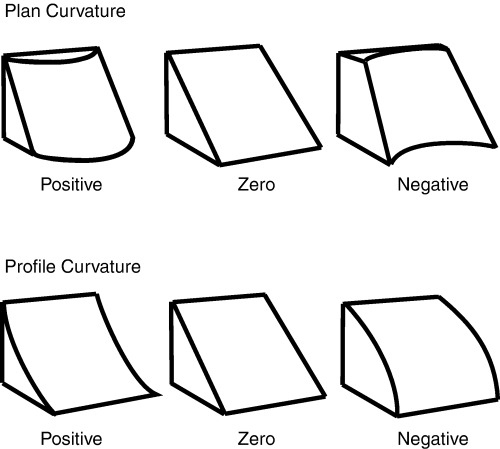


- CELLID_lsfactor	Continuous	
Length-slope factor that accounts for the effects of topography on erosion

- CELLID_twi	Continuous	
Topographic wetness index, an index to quantify the topographic control on hydrological process

- CELLID_geology	Categorical	Lithology of the surface material
1: Weathered Cretaceous granitic rocks
2: Weathered Jurassic granite rocks
3: Weathered Jurassic tuff and lava
4: Weathered Cretaceous tuff and lava
5: Quaternary deposits
6: Fill
7: Weathered Jurassic sandstone, siltstone and mudstone

- CELLID_sdoif	Continuous	
Step duration orographic intensification factor: an index to quantify the amplification of orography on rainfall


# 0. Import

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# all columns, limit 200 rows
pd.set_option("display.max_columns", None) 
pd.set_option("display.max_rows", 200)

# round up DISPLAY 4 decimal
pd.options.display.float_format = "{:,.4f}".format

import time

from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold, StratifiedKFold, cross_validate, cross_val_score, cross_val_predict
from sklearn.model_selection import GridSearchCV
from sklearn import metrics

import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor as vif
from sklearn.feature_selection import RFE



from sklearn.linear_model import LogisticRegression 
from sklearn.svm import SVC 
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier 
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import AdaBoostClassifier,GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB

# !conda install -c conda-forge py-xgboost 
# !pip install xgboost
import xgboost as xgb

from sklearn.metrics import ( 
    f1_score, 
    accuracy_score, 
    recall_score, 
    precision_score, 
    confusion_matrix, 
    roc_auc_score, 
    roc_curve,
    plot_confusion_matrix, 
    classification_report, 
    precision_recall_curve,
    make_scorer,
 
) 

C:\Users\nguye_5159g\anaconda3\envs\newbase010323\lib\site-packages\xgboost\compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


In [2]:
# from google.colab import drive
# drive.mount('/content/drive')
# path = '/content/drive/MyDrive/Colab/Landslide/'

In [3]:
path = 'df/'

In [4]:
df = pd.read_csv(path+'Train.csv')

In [5]:
df.head()

,Sample_ID,1_elevation,2_elevation,3_elevation,4_elevation,5_elevation,6_elevation,7_elevation,8_elevation,9_elevation,10_elevation,11_elevation,12_elevation,13_elevation,14_elevation,15_elevation,16_elevation,17_elevation,18_elevation,19_elevation,20_elevation,21_elevation,22_elevation,23_elevation,24_elevation,25_elevation,1_slope,2_slope,3_slope,4_slope,5_slope,6_slope,7_slope,8_slope,9_slope,10_slope,11_slope,12_slope,13_slope,14_slope,15_slope,16_slope,17_slope,18_slope,19_slope,20_slope,21_slope,22_slope,23_slope,24_slope,25_slope,1_aspect,2_aspect,3_aspect,4_aspect,5_aspect,6_aspect,7_aspect,8_aspect,9_aspect,10_aspect,11_aspect,12_aspect,13_aspect,14_aspect,15_aspect,16_aspect,17_aspect,18_aspect,19_aspect,20_aspect,21_aspect,22_aspect,23_aspect,24_aspect,25_aspect,1_placurv,2_placurv,3_placurv,4_placurv,5_placurv,6_placurv,7_placurv,8_placurv,9_placurv,10_placurv,11_placurv,12_placurv,13_placurv,14_placurv,15_placurv,16_placurv,17_placurv,18_placurv,19_placurv,20_placurv,21_placurv,22_placurv,23_placurv,24_placurv,25_placurv,1_procurv,2_procurv,3_procurv,4_procurv,5_procurv,6_procurv,7_procurv,8_procurv,9_procurv,10_procurv,11_procurv,12_procurv,13_procurv,14_procurv,15_procurv,16_procurv,17_procurv,18_procurv,19_procurv,20_procurv,21_procurv,22_procurv,23_procurv,24_procurv,25_procurv,1_lsfactor,2_lsfactor,3_lsfactor,4_lsfactor,5_lsfactor,6_lsfactor,7_lsfactor,8_lsfactor,9_lsfactor,10_lsfactor,11_lsfactor,12_lsfactor,13_lsfactor,14_lsfactor,15_lsfactor,16_lsfactor,17_lsfactor,18_lsfactor,19_lsfactor,20_lsfactor,21_lsfactor,22_lsfactor,23_lsfactor,24_lsfactor,25_lsfactor,1_twi,2_twi,3_twi,4_twi,5_twi,6_twi,7_twi,8_twi,9_twi,10_twi,11_twi,12_twi,13_twi,14_twi,15_twi,16_twi,17_twi,18_twi,19_twi,20_twi,21_twi,22_twi,23_twi,24_twi,25_twi,1_geology,2_geology,3_geology,4_geology,5_geology,6_geology,7_geology,8_geology,9_geology,10_geology,11_geology,12_geology,13_geology,14_geology,15_geology,16_geology,17_geology,18_geology,19_geology,20_geology,21_geology,22_geology,23_geology,24_geology,25_geology,1_sdoif,2_sdoif,3_sdoif,4_sdoif,5_sdoif,6_sdoif,7_sdoif,8_sdoif,9_sdoif,10_sdoif,11_sdoif,12_sdoif,13_sdoif,14_sdoif,15_sdoif,16_sdoif,17_sdoif,18_sdoif,19_sdoif,20_sdoif,21_sdoif,22_sdoif,23_sdoif,24_sdoif,25_sdoif,Label
0,1,130,129,127,126,123,126,125,124,122,119,122,121,119,117,115,119,117,115,114,112,116,114,113,111,110,35.2644,37.2921,33.8545,35.7958,40.3155,38.8767,39.5097,40.5106,45.8345,45.0000,36.0550,40.5106,44.5637,41.8103,38.8767,33.8545,38.8767,33.8545,33.8545,32.6319,32.6319,30.2463,30.2463,30.2463,30.2463,98.1301,113.1986,116.5650,123.6901,135.0000,97.1250,104.0362,110.5560,119.0546,126.8699,105.9454,110.5560,113.9625,116.5650,119.7449,116.5650,119.7449,116.5650,116.5650,128.6598,128.6598,120.9638,120.9638,120.9638,120.9638,0.0385,0.0295,0.0314,0.0258,0.0105,0.0283,0.0274,0.0198,0.0093,0.0088,0.0215,0.0212,0.0173,0.0067,-0.0087,0.0239,0.0126,-0.0042,0.0036,-0.0068,0.0133,0.0053,0.0070,-0.0178,-0.0078,0.0139,0.0147,0.0182,0.0184,0.0033,0.0020,0.0057,0.0022,-0.0038,-0.0033,-0.0021,0.0036,0.0020,-0.0123,-0.0272,0.0010,-0.0126,-0.0316,-0.0257,-0.0374,-0.0189,-0.0219,-0.0236,-0.0485,-0.0391,8.0452,8.3330,7.8194,8.0322,9.8189,9.2958,9.3751,9.4994,10.9229,11.0019,9.3399,9.8832,11.0358,10.2980,9.6189,8.7032,10.1758,8.6511,8.2511,8.0745,8.5199,7.9892,7.6343,7.8042,7.2192,3.1733,2.9614,3.3159,3.0612,3.2469,3.2217,3.1535,3.0486,2.9155,3.0740,3.7653,3.2467,3.1545,3.2378,3.3925,3.8513,3.6739,3.8213,3.5846,3.7346,4.0031,4.2181,3.9909,4.1009,3.7152,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,1.2818,1.2817,1.2817,1.2817,1.2816,1.2818,1.2818,1.2817,1.2817,1.2817,1.2818,1.2818,1.2817,1.2817,1.2817,1.2818,1.2818,1.2817,1.2817,1.2817,1.2818,1.2818,1.2818,1.2817,1.2817,0
1,2,161,158,155,153,151,162,159,155,153,151,162,159,156,153,151,162,160,157,153,151,162,160,157,154,150,32.3115,32.3115,26.5650,21.8014,22.4069,27.0171,35.2644,31.3112,21.8014,21.8014,30.9638,31.3112,32.3115,26.5650,21.8014,26.5650,27.0171,35.2644,31.3112,27.01

# 1. Quality check

In [6]:
# not a good idea to have column's name start with a number
# bring cell ID to the end

cellid    = [name.split('_')[0] for name in df.columns[1:-1]]
attribute = [name.split('_')[1] for name in df.columns[1:-1]]
df.columns = [df.columns[0]] + ['_'.join(name) for name in zip(attribute, cellid)] + [df.columns[-1]]

df.head(1)

,Sample_ID,elevation_1,elevation_2,elevation_3,elevation_4,elevation_5,elevation_6,elevation_7,elevation_8,elevation_9,elevation_10,elevation_11,elevation_12,elevation_13,elevation_14,elevation_15,elevation_16,elevation_17,elevation_18,elevation_19,elevation_20,elevation_21,elevation_22,elevation_23,elevation_24,elevation_25,slope_1,slope_2,slope_3,slope_4,slope_5,slope_6,slope_7,slope_8,slope_9,slope_10,slope_11,slope_12,slope_13,slope_14,slope_15,slope_16,slope_17,slope_18,slope_19,slope_20,slope_21,slope_22,slope_23,slope_24,slope_25,aspect_1,aspect_2,aspect_3,aspect_4,aspect_5,aspect_6,aspect_7,aspect_8,aspect_9,aspect_10,aspect_11,aspect_12,aspect_13,aspect_14,aspect_15,aspect_16,aspect_17,aspect_18,aspect_19,aspect_20,aspect_21,aspect_22,aspect_23,aspect_24,aspect_25,placurv_1,placurv_2,placurv_3,placurv_4,placurv_5,placurv_6,placurv_7,placurv_8,placurv_9,placurv_10,placurv_11,placurv_12,placurv_13,placurv_14,placurv_15,placurv_16,placurv_17,placurv_18,placurv_19,placurv_20,placurv_21,placurv_22,placurv_23,placurv_24,placurv_25,procurv_1,procurv_2,procurv_3,procurv_4,procurv_5,procurv_6,procurv_7,procurv_8,procurv_9,procurv_10,procurv_11,procurv_12,procurv_13,procurv_14,procurv_15,procurv_16,procurv_17,procurv_18,procurv_19,procurv_20,procurv_21,procurv_22,procurv_23,procurv_24,procurv_25,lsfactor_1,lsfactor_2,lsfactor_3,lsfactor_4,lsfactor_5,lsfactor_6,lsfactor_7,lsfactor_8,lsfactor_9,lsfactor_10,lsfactor_11,lsfactor_12,lsfactor_13,lsfactor_14,lsfactor_15,lsfactor_16,lsfactor_17,lsfactor_18,lsfactor_19,lsfactor_20,lsfactor_21,lsfactor_22,lsfactor_23,lsfactor_24,lsfactor_25,twi_1,twi_2,twi_3,twi_4,twi_5,twi_6,twi_7,twi_8,twi_9,twi_10,twi_11,twi_12,twi_13,twi_14,twi_15,twi_16,twi_17,twi_18,twi_19,twi_20,twi_21,twi_22,twi_23,twi_24,twi_25,geology_1,geology_2,geology_3,geology_4,geology_5,geology_6,geology_7,geology_8,geology_9,geology_10,geology_11,geology_12,geology_13,geology_14,geology_15,geology_16,geology_17,geology_18,geology_19,geology_20,geology_21,geology_22,geology_23,geology_24,geology_25,sdoif_1,sdoif_2,sdoif_3,sdoif_4,sdoif_5,sdoif_6,sdoif_7,sdoif_8,sdoif_9,sdoif_10,sdoif_11,sdoif_12,sdoif_13,sdoif_14,sdoif_15,sdoif_16,sdoif_17,sdoif_18,sdoif_19,sdoif_20,sdoif_21,sdoif_22,sdoif_23,sdoif_24,sdoif_25,Label
0,1,130,129,127,126,123,126,125,124,122,119,122,121,119,117,115,119,117,115,114,112,116,114,113,111,110,35.2644,37.2921,33.8545,35.7958,40.3155,38.8767,39.5097,40.5106,45.8345,45.0000,36.0550,40.5106,44.5637,41.8103,38.8767,33.8545,38.8767,33.8545,33.8545,32.6319,32.6319,30.2463,30.2463,30.2463,30.2463,98.1301,113.1986,116.5650,123.6901,135.0000,97.1250,104.0362,110.5560,119.0546,126.8699,105.9454,110.5560,113.9625,116.5650,119.7449,116.5650,119.7449,116.5650,116.5650,128.6598,128.6598,120.9638,120.9638,120.9638,120.9638,0.0385,0.0295,0.0314,0.0258,0.0105,0.0283,0.0274,0.0198,0.0093,0.0088,0.0215,0.0212,0.0173,0.0067,-0.0087,0.0239,0.0126,-0.0042,0.0036,-0.0068,0.0133,0.0053,0.0070,-0.0178,-0.0078,0.0139,0.0147,0.0182,0.0184,0.0033,0.0020,0.0057,0.0022,-0.0038,-0.0033,-0.0021,0.0036,0.0020,-0.0123,-0.0272,0.0010,-0.0126,-0.0316,-0.0257,-0.0374,-0.0189,-0.0219,-0.0236,-0.0485,-0.0391,8.0452,8.3330,7.8194,8.0322,9.8189,9.2958,9.3751,9.4994,10.9229,11.0019,9.3399,9.8832,11.0358,10.2980,9.6189,8.7032,10.1758,8.6511,8.2511,8.0745,8.5199,7.9892,7.6343,7.8042,7.2192,3.1733,2.9614,3.3159,3.0612,3.2469,3.2217,3.1535,3.0486,2.9155,3.0740,3.7653,3.2467,3.1545,3.2378,3.3925,3.8513,3.6739,3.8213,3.5846,3.7346,4.0031,4.2181,3.9909,4.1009,3.7152,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,1.2818,1.2817,1.2817,1.2817,1.2816,1.2818,1.2818,1.2817,1.2817,1.2817,1.2818,1.2818,1.2817,1.2817,1.2817,1.2818,1.2818,1.2817,1.2817,1.2817,1.2818,1.2818,1.2818,1.2817,1.2817,0


Create attribute group

In [7]:
elevation_cols = df.columns[1:26].tolist()
slope_cols = df.columns[1+25:26+25].tolist()
aspect_cols = df.columns[1+25*2:26+25*2].tolist()
placurv_cols = df.columns[1+25*3:26+25*3].tolist()
procurv_cols = df.columns[1+25*4:26+25*4].tolist()
lsfactor_cols = df.columns[1+25*5:26+25*5].tolist()
twi_cols = df.columns[1+25*6:26+25*6].tolist()
geology_cols = df.columns[1+25*7:26+25*7].tolist()
sdoif_cols = df.columns[1+25*8:26+25*8].tolist()

In [8]:
df.isna().any().sum()

0

# 2. EDA

## 2.0 Label

In [9]:
df.Label.value_counts()

0    8148
1    2716
Name: Label, dtype: int64

## 2.1 Prep

<AxesSubplot: >

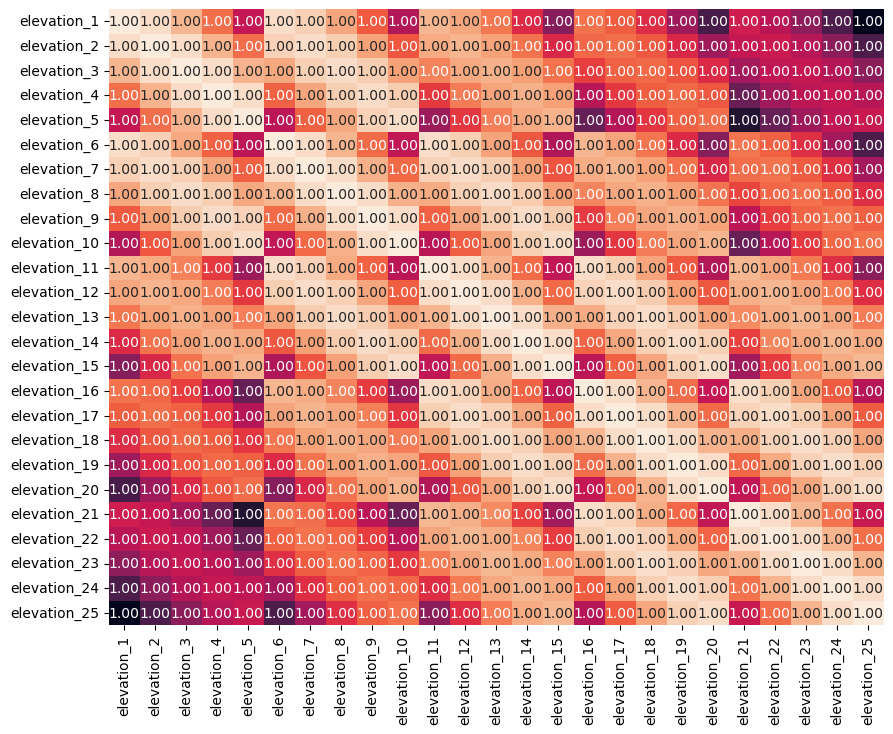

In [10]:
# not very easy to look at
plt.figure(figsize=(10,8))
sns.heatmap(df[elevation_cols].corr(), annot=True, fmt='.2f', cbar=False)

<AxesSubplot: >

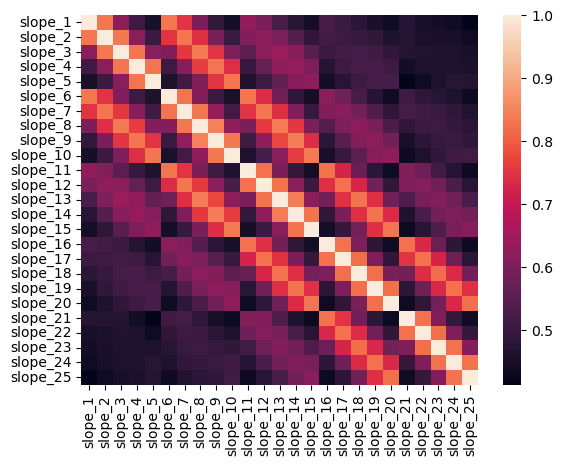

In [11]:
# interesting pattern, but not easy to interprete
sns.heatmap(df[slope_cols].corr())

### Map each 5x5 cell to a more intuitive manner?

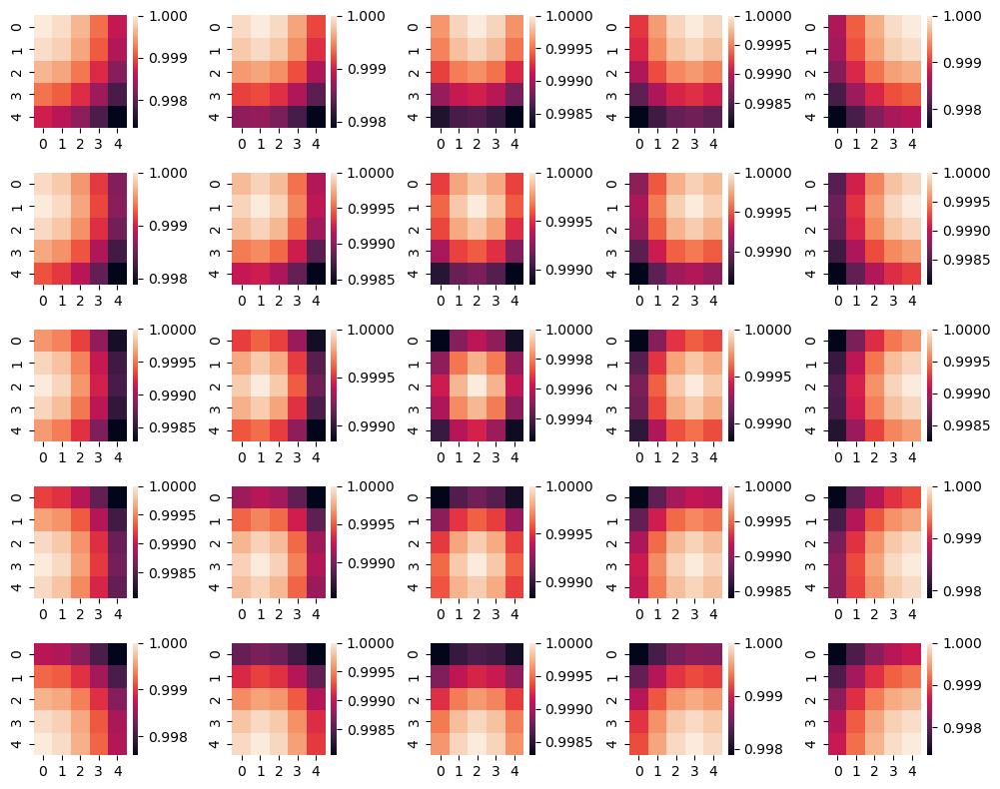

In [12]:
# select feature
df_corr = df[elevation_cols].corr()

fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(10, 8))
for feature, ax in zip(df_corr.columns, axs.ravel()):
    sns.heatmap(np.array(df_corr[feature]).reshape((5,5)), ax = ax)
plt.tight_layout()
plt.show()

This is much better.

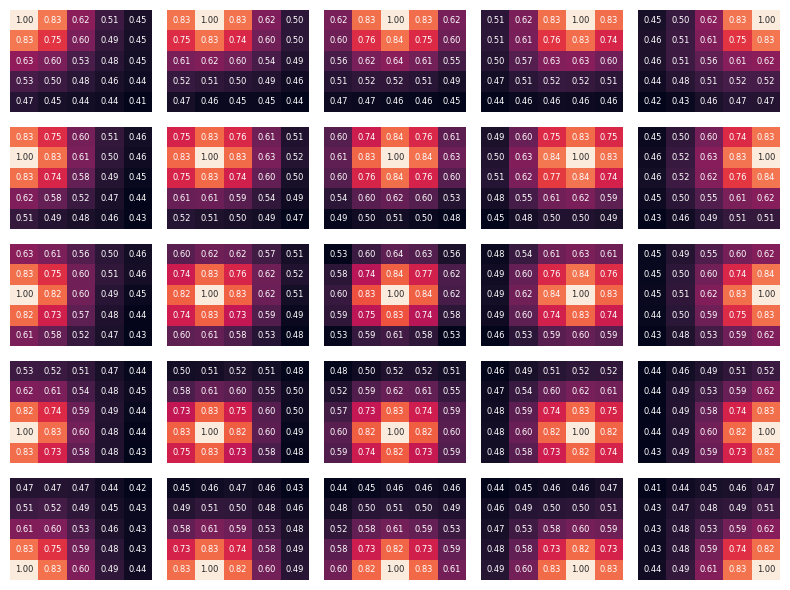

In [13]:
# remove cbar, add annot, clean up a bit
df_corr = df[slope_cols].corr()

fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(8, 6))

# plot each column (cell) to its own 5x5 matrix
for cell, ax in zip(df_corr.columns, axs.ravel()):
    sns.heatmap(np.array(df_corr[cell]).reshape((5,5)), annot=True, fmt='.2f', annot_kws={'size': 6}, cbar=False, ax = ax, yticklabels=False, xticklabels=False)
    ax.tick_params(left=False, bottom=False)
plt.tight_layout()
plt.show()

In [14]:
# # all attribute
# attributes = [('elevation',elevation_cols), 
#               ('slope',slope_cols), 
#               ('aspect',aspect_cols), 
#               ('placurv',placurv_cols), 
#               ('procurv',procurv_cols), 
#               ('lsfactor',lsfactor_cols), 
#               ('twi', twi_cols),
#               ('geology', geology_cols),
#               ('sdoif',sdoif_cols)
#              ]

# for attribute_name, attribute in attributes:
#     df_corr = df[attribute].corr()

#     fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(12, 10))
#     for cell, ax in zip(df_corr.columns, axs.ravel()):
#         sns.heatmap(np.array(df_corr[cell]).reshape((5,5)), annot=True, fmt='.2f', cbar=False, ax = ax, yticklabels=False, xticklabels=False)
#         ax.tick_params(left=False, bottom=False)
#     plt.suptitle(attribute_name, size=30)


#     plt.tight_layout()
#     plt.show()

Elevation
- Elevation: very strong correlation, close to 1 for all 25 cells -> reduce to 1 variable. 
-Would different elevation among cells lead to more landslide? 
>- Calculate the range between max and min
>- sum of total difference from max and the rest?



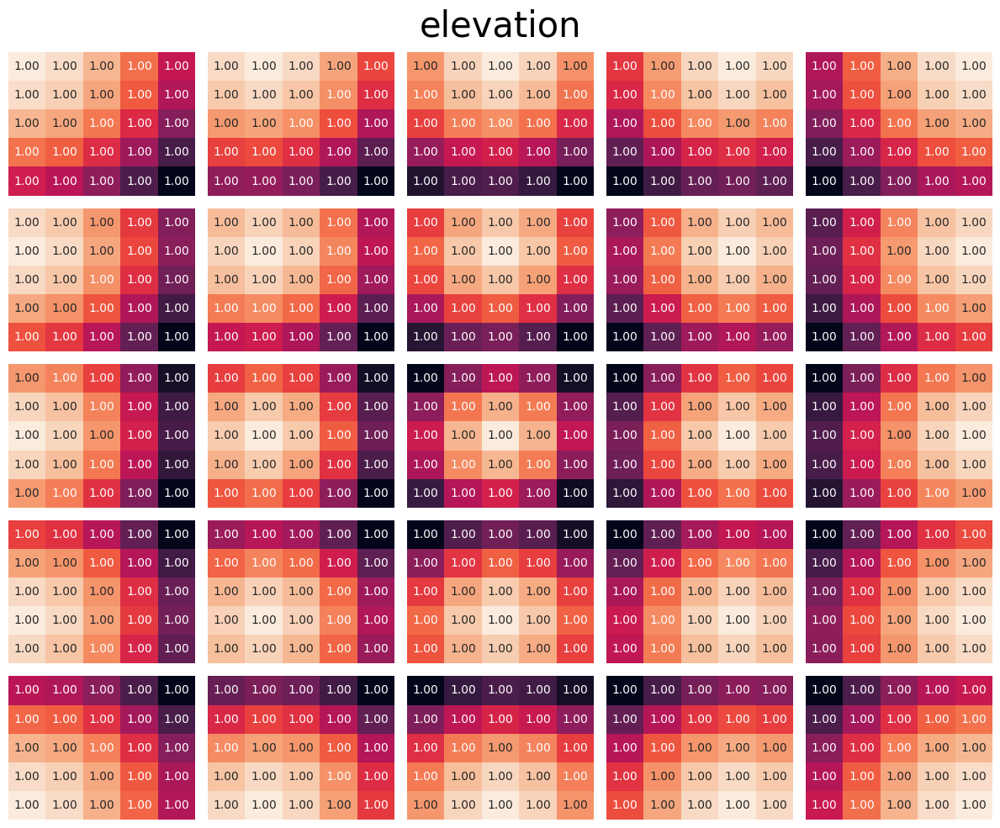
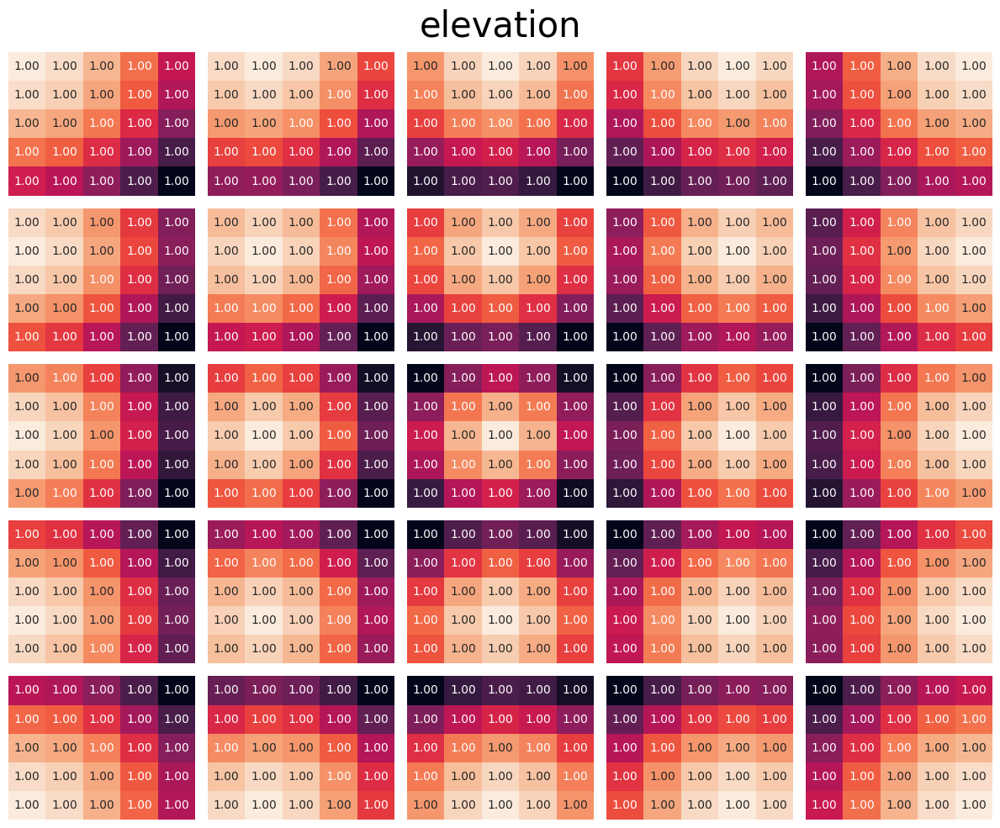

Slope
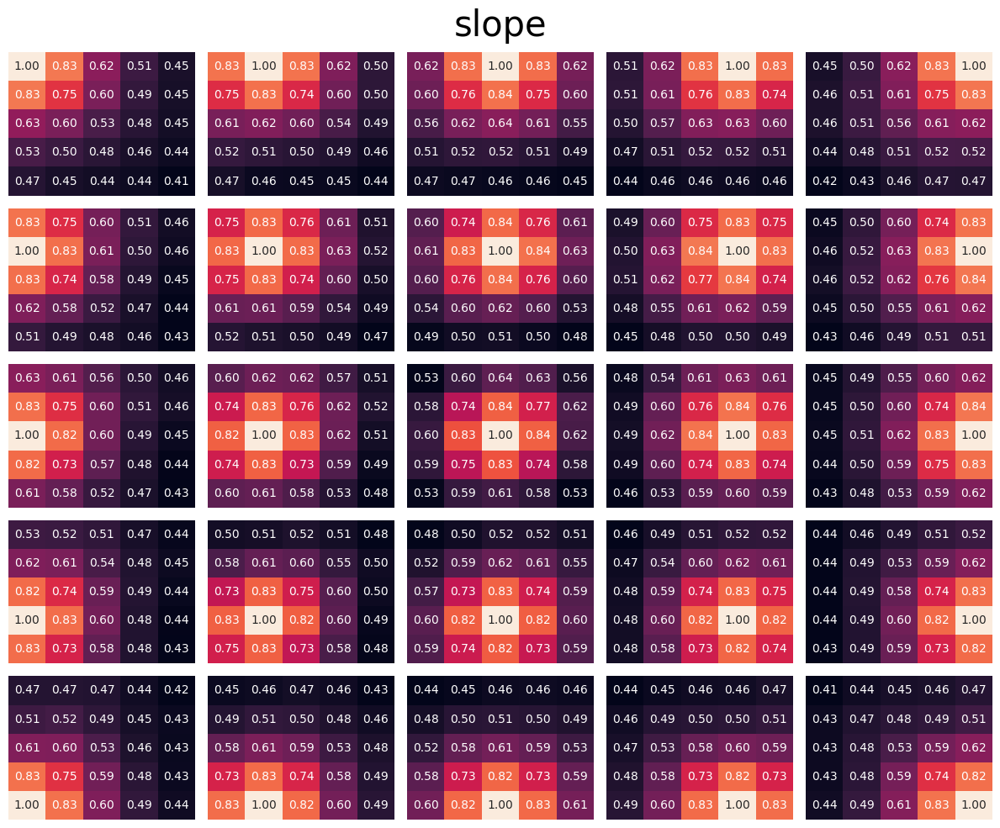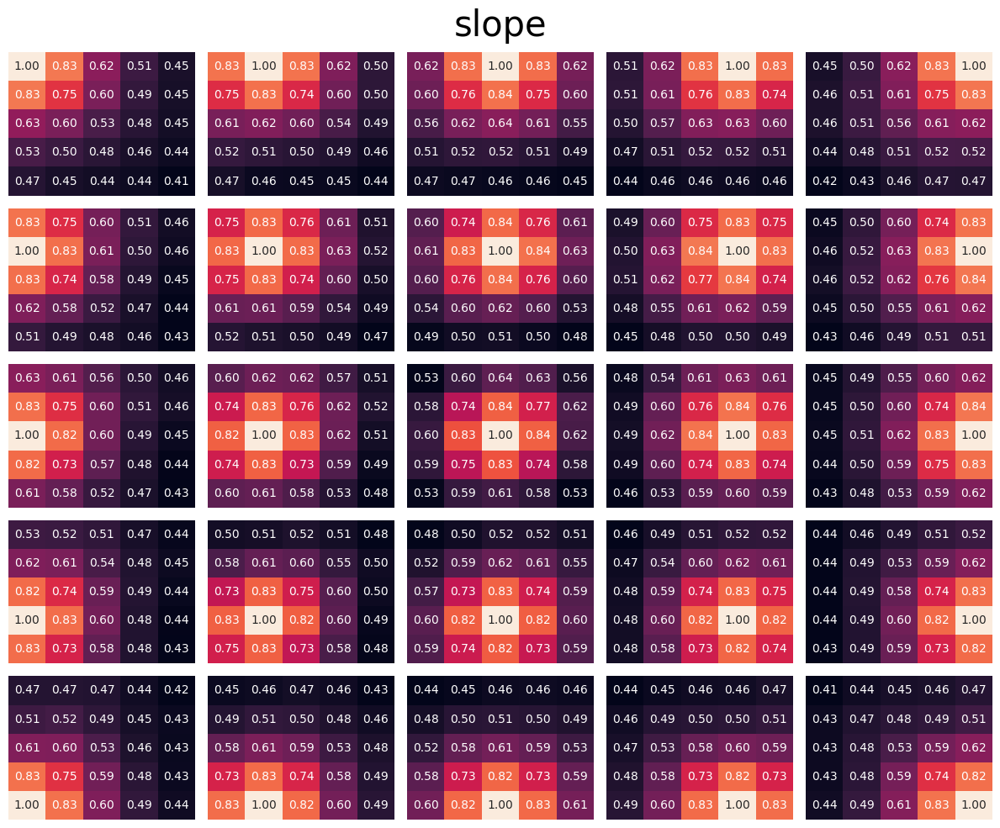

Aspect
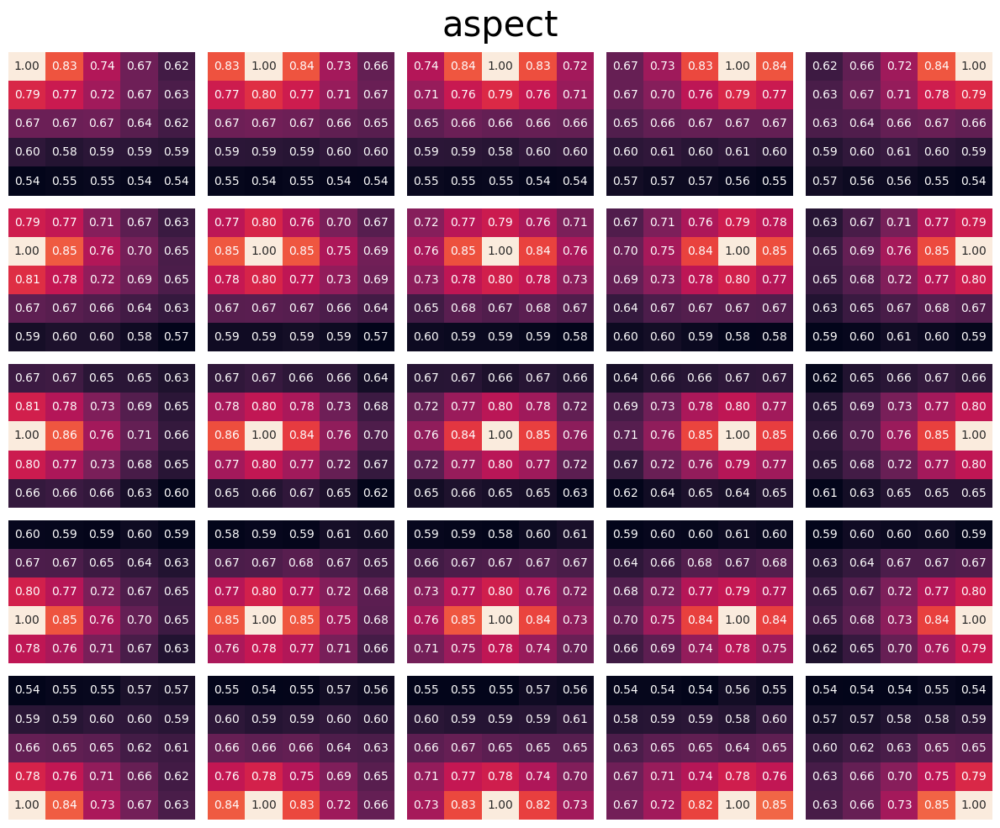

Placurv
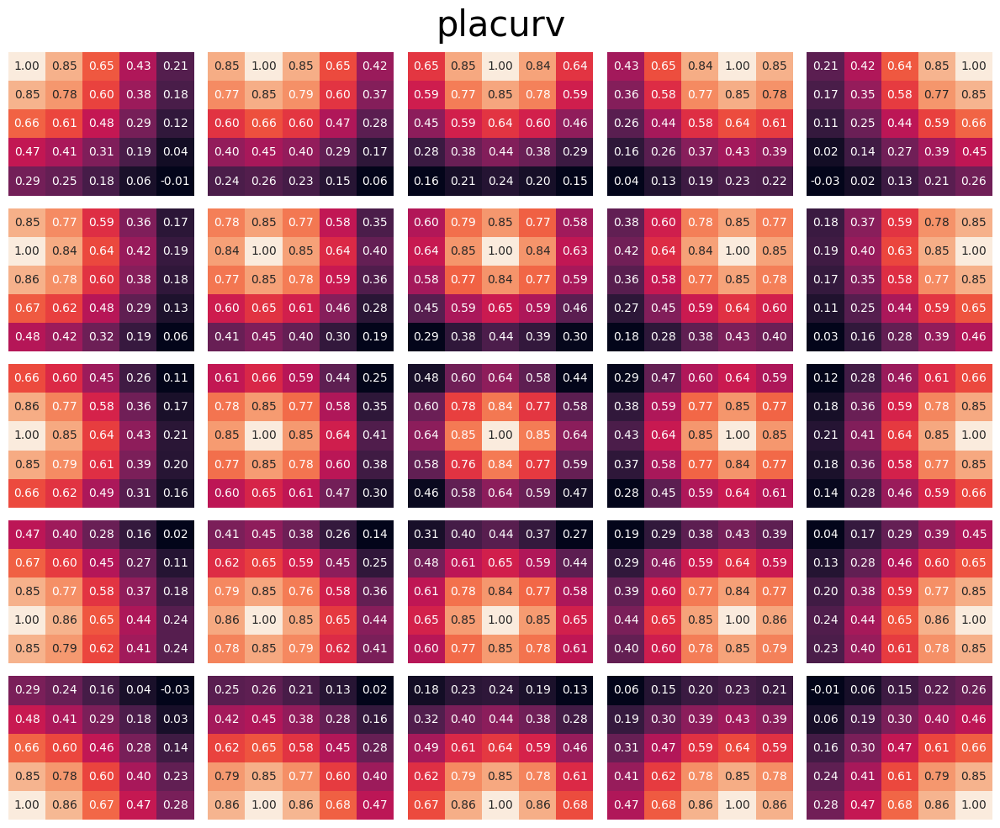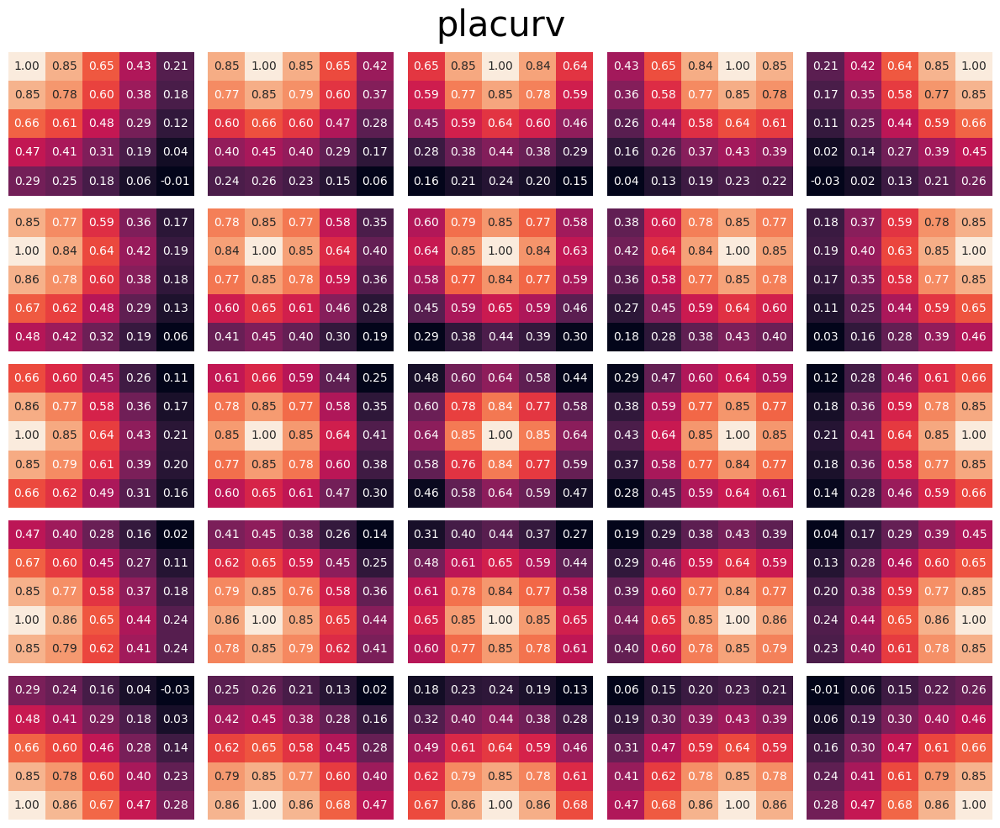

Procurv
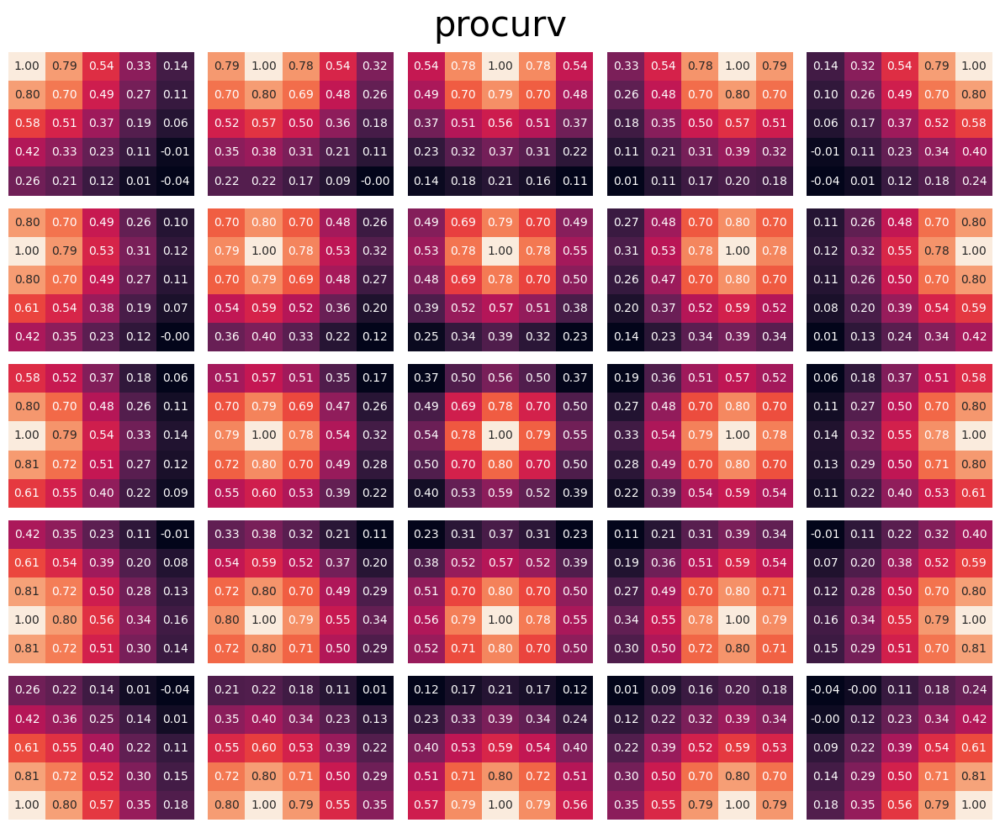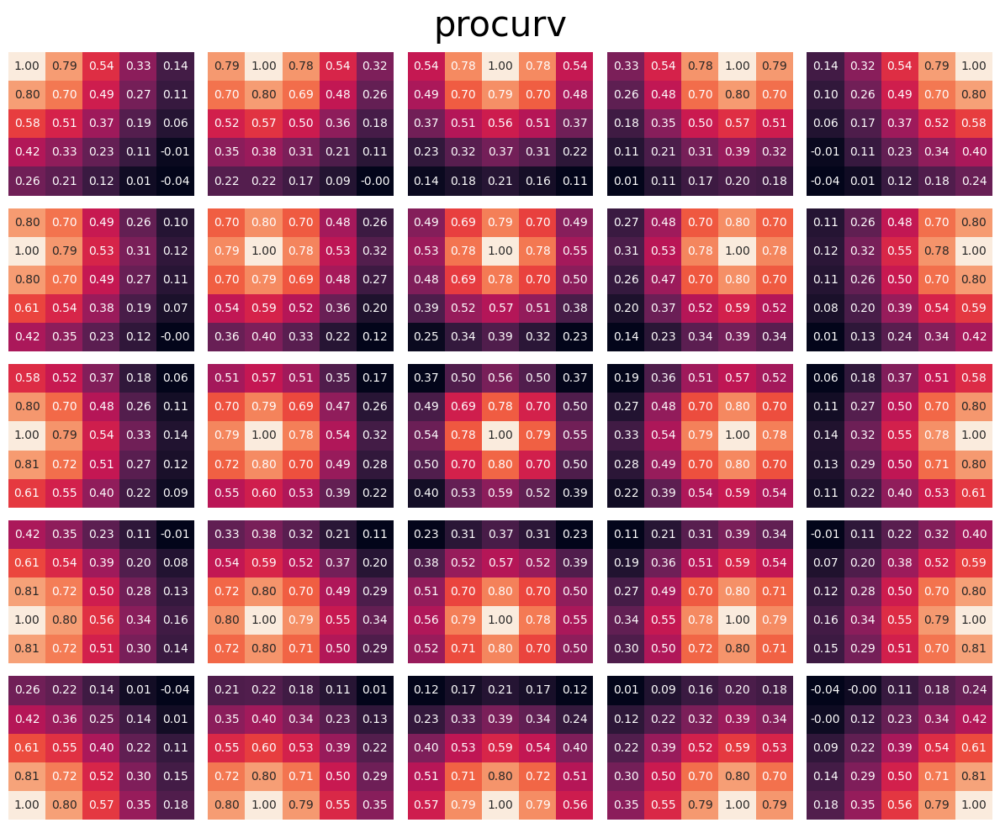

LS factor
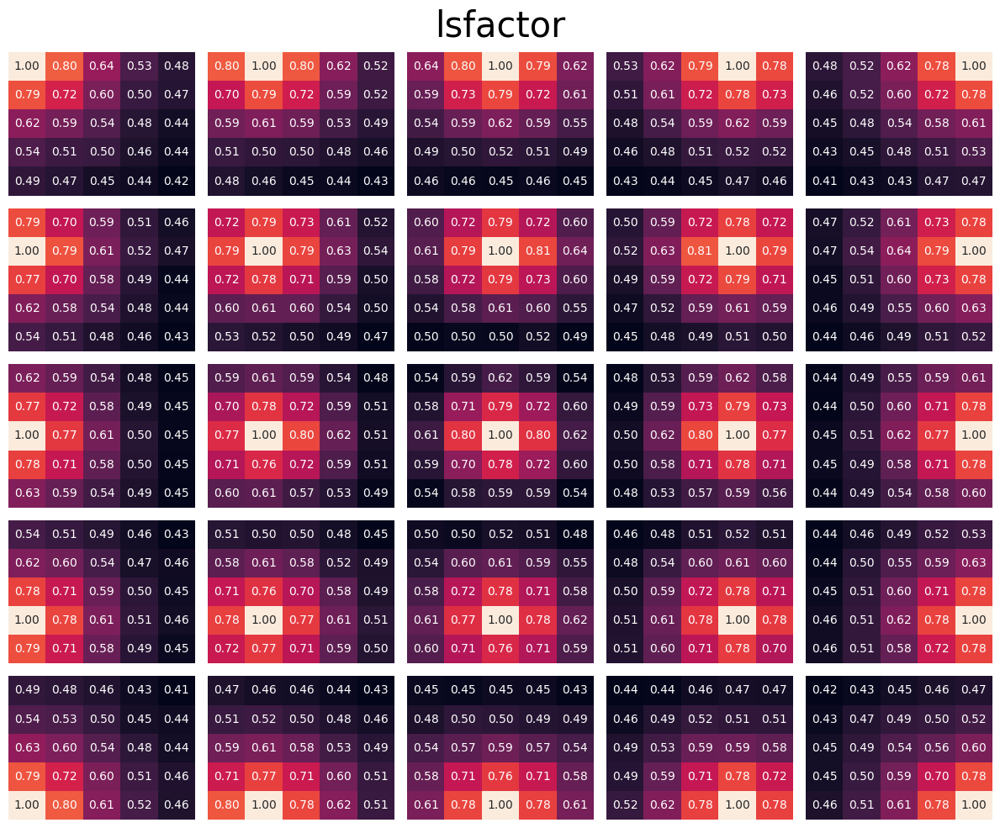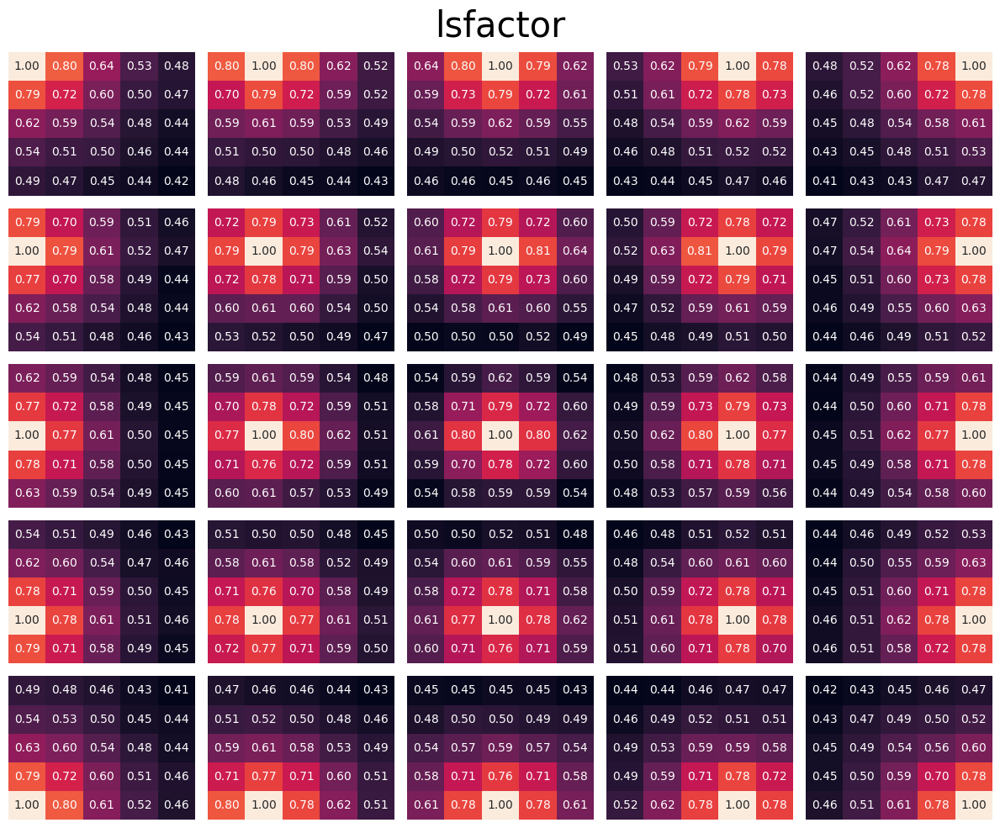

TWI
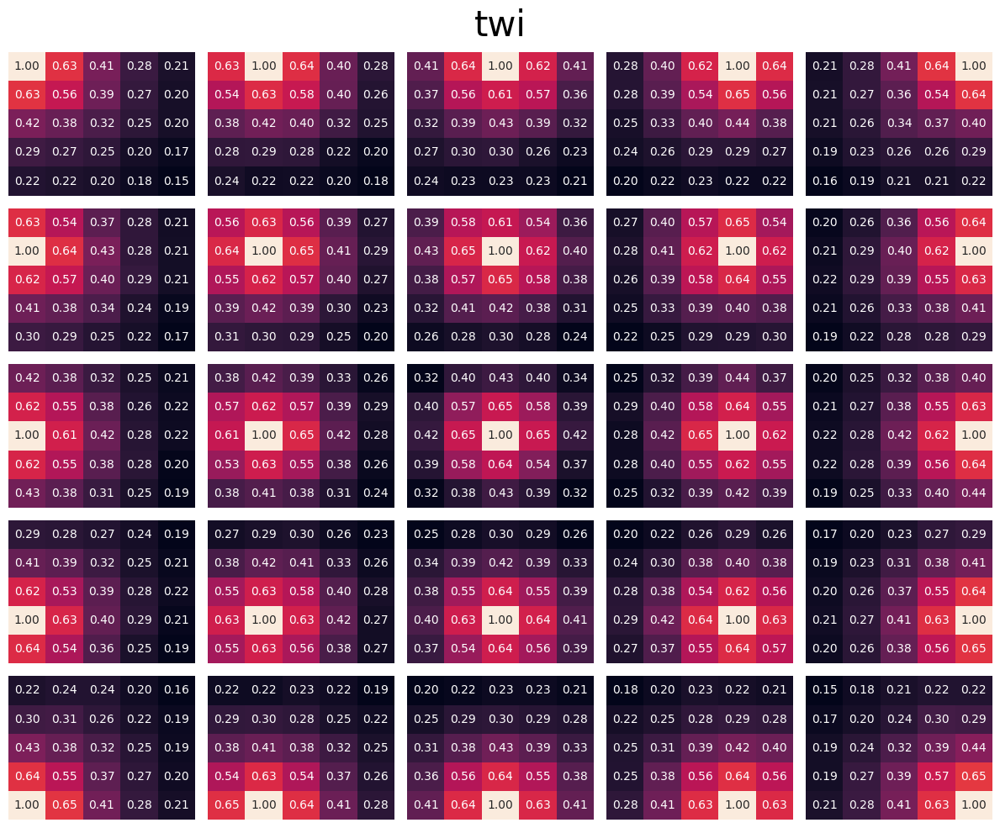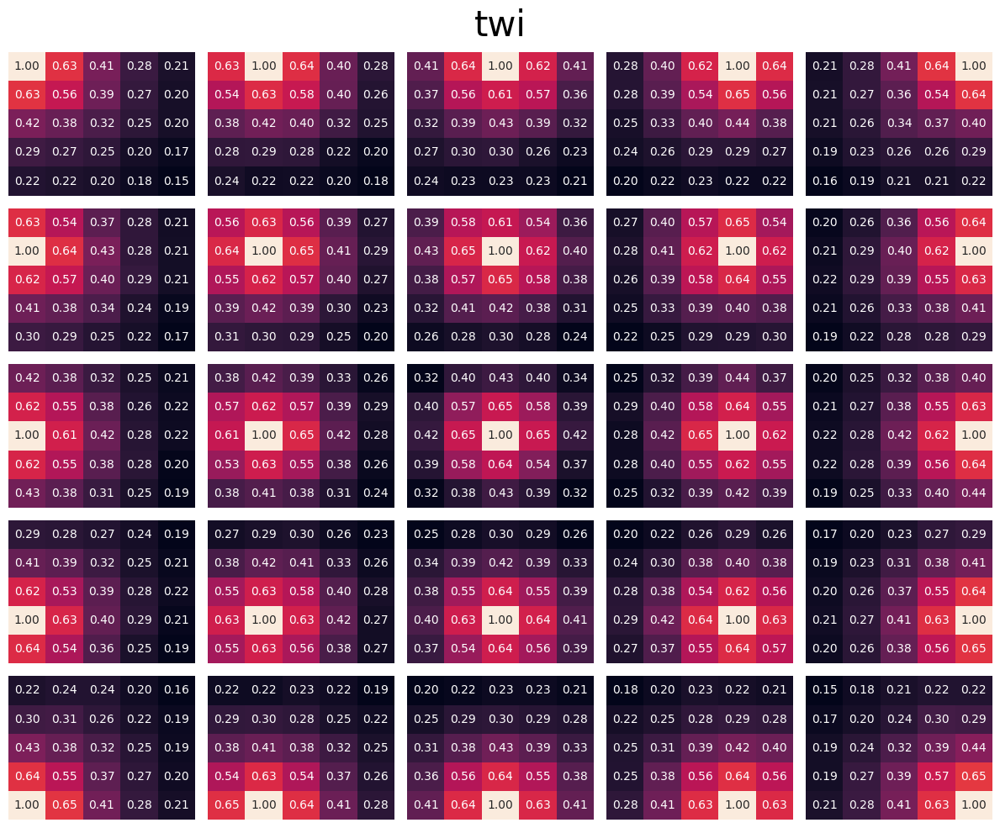

Geo
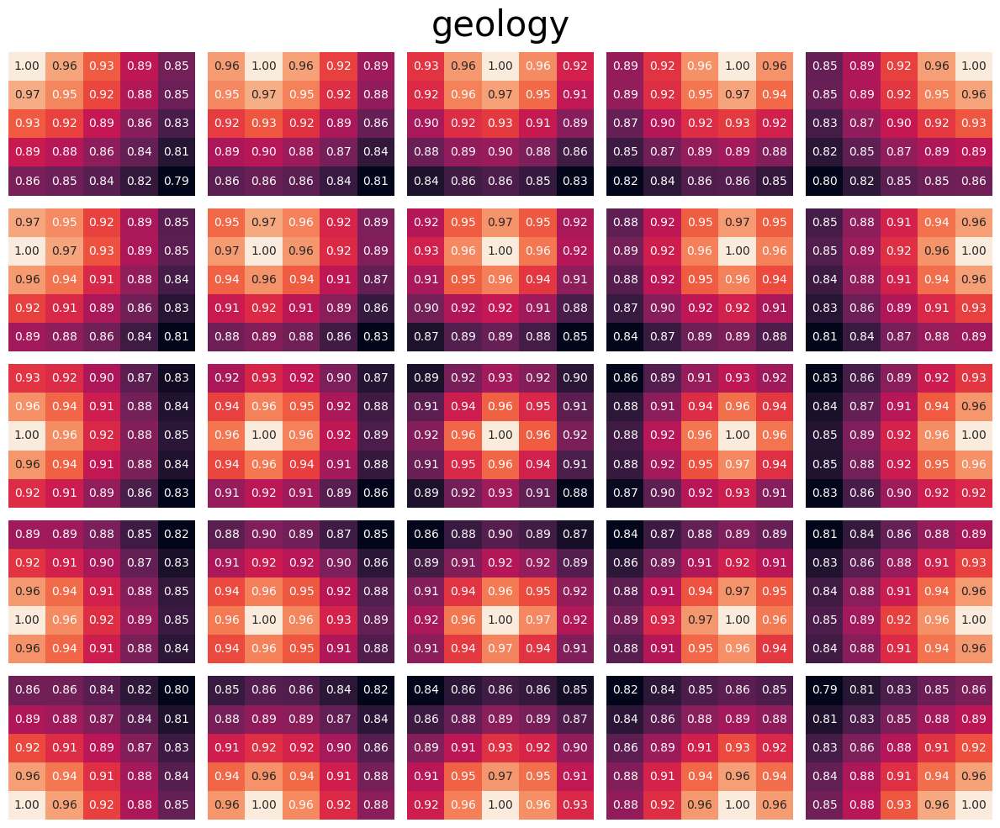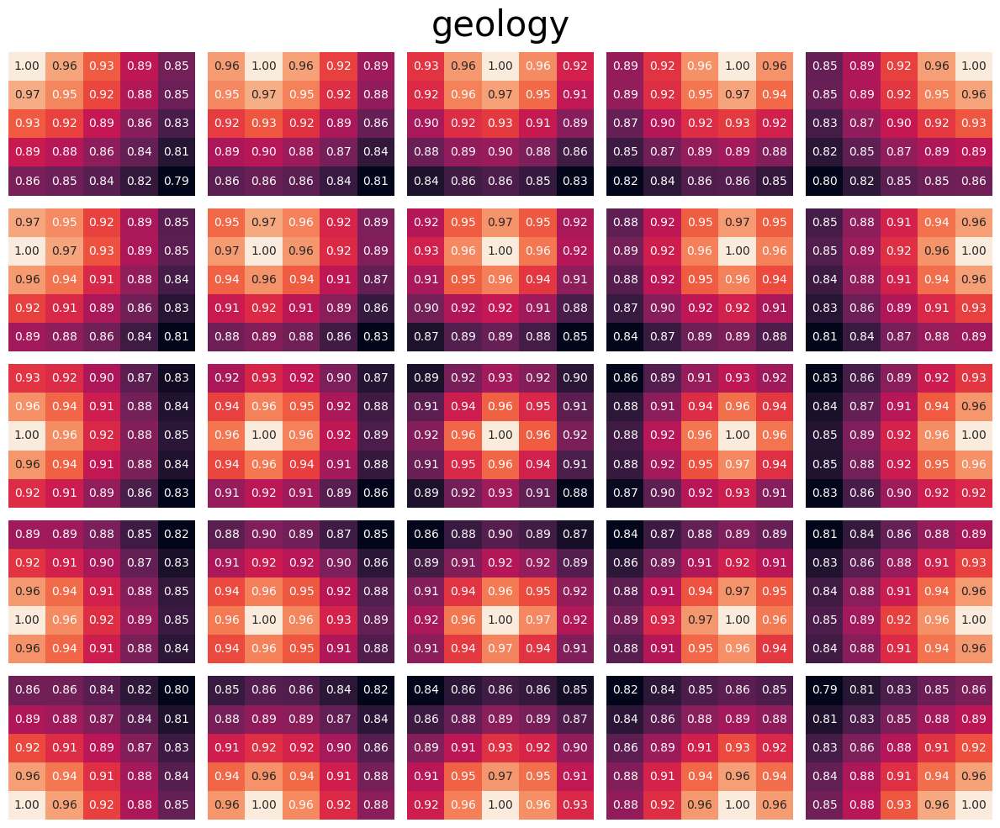

SDOIF
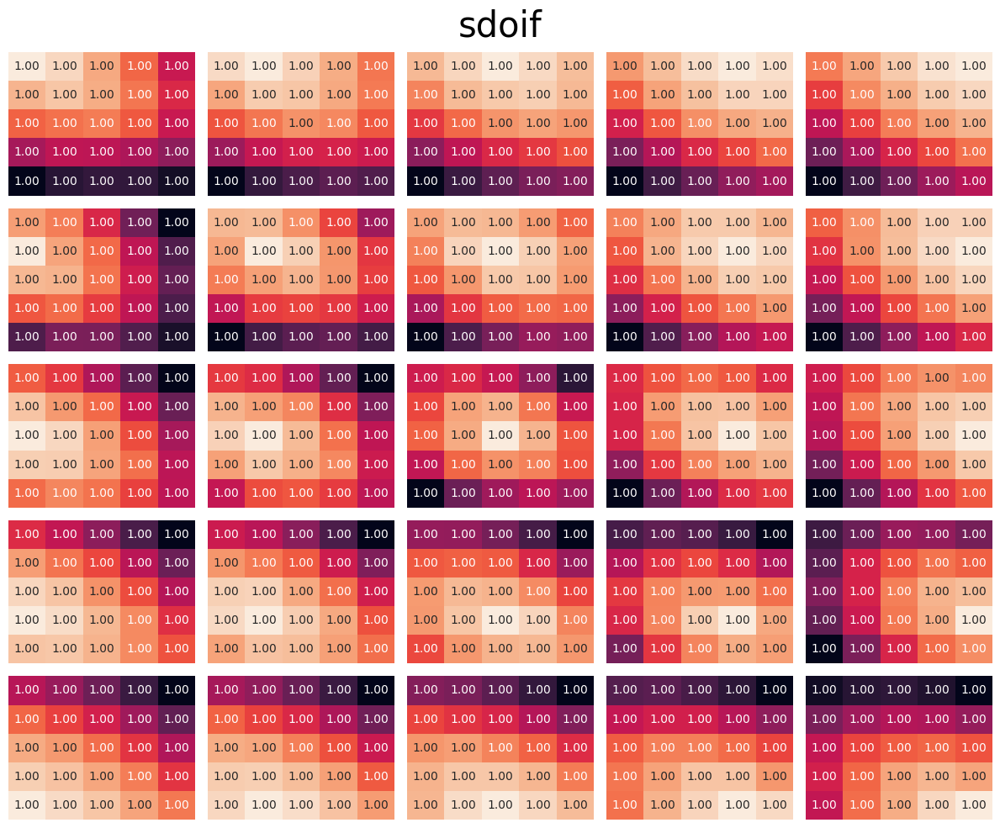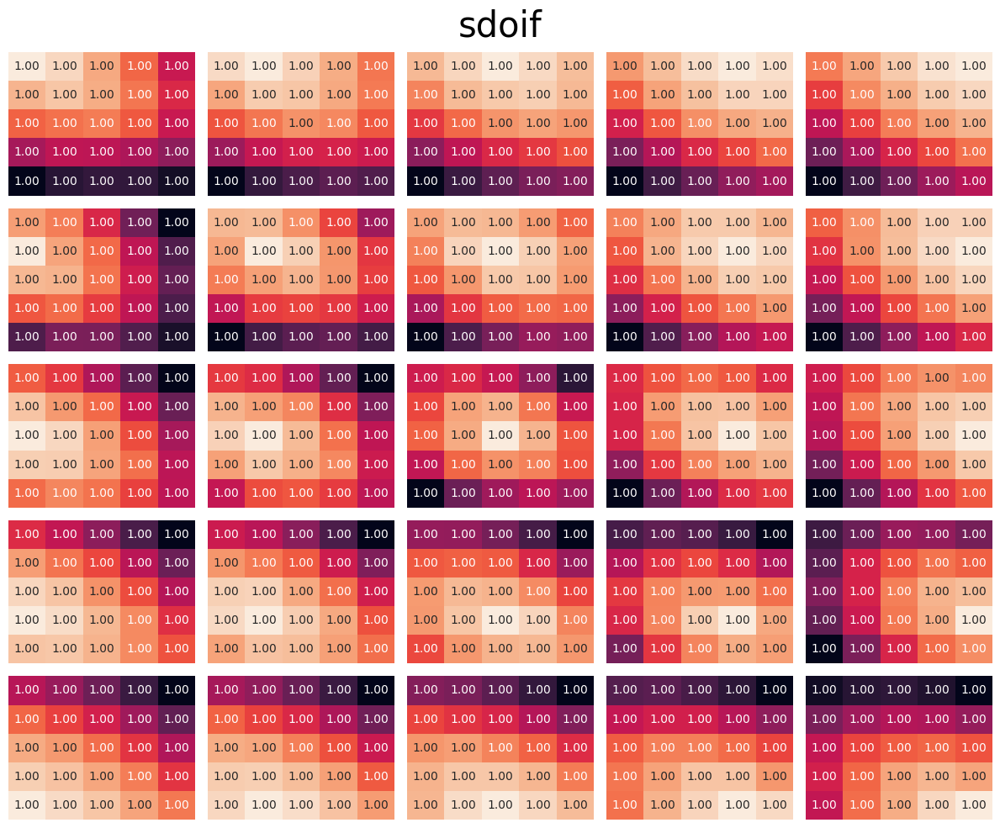

Summary:

- Slope: correlation from 0.7-0.8 for adjacent cells, 0.6-0.5-0.4 for distant cells.
- Aspect: 0.8/0.7 to 0.66
- Placurv: Similar to slope (0.8/0.7) to 0.6/0.5
- Procurv: Range slightly larger than placurv
- lsfactor: 0.8/0/7 - 0.6
- Twi: 0.6 - 0.3 => least correlation
- Geology: min 0.88
- sdoif: mostly 1. Reduce 1 column. Mark if there's mixed sdoif.


### Function for correlation map

In [15]:
def block_attribute(attribute_cols, attribute_name = ''):
    df_corr = df[attribute_cols].corr()
    fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(8, 6))
    for cell, ax in zip(df_corr.columns, axs.ravel()):
        sns.heatmap(np.array(df_corr[cell]).reshape((5,5)), 
                    annot=True, fmt='.2f', annot_kws={'size': 6},
                    cbar=False, ax = ax, yticklabels=False, xticklabels=False,
                    # vmin=0.3, vmax=1.0,
                   )
        ax.tick_params(left=False, bottom=False)
    plt.suptitle(attribute_name, size=30)
    plt.tight_layout()
    plt.show()

### Function for EDA

In [16]:
def histbox(attribute, title=''):
    fig, [ax_box, ax_hist] = plt.subplots(nrows=2, gridspec_kw={'height_ratios': [0.15, 0.85]}, sharex=True, figsize=(8,5))
    sns.boxplot(x=attribute, ax=ax_box)
    sns.histplot(x=attribute, ax=ax_hist)
    ax_box.set_title(title)
    plt.show()

In [17]:
def kde_label(attribute, title=''):
    fig, [ax_box, ax_kde] = plt.subplots(nrows=2, gridspec_kw={'height_ratios': [0.2, 0.8]}, sharex=True, figsize=(8,5))
    sns.boxplot(x=attribute, y=df.Label.astype(str), ax=ax_box)
    sns.kdeplot(x=attribute, hue=df.Label, ax=ax_kde)
    ax_box.set_title(title)
    plt.show()

### Weight of evidence

In [18]:
# Weight of evidence: categorical
def convert_woe_cat(feature, target='Label'):
   
    # woe calculation
    df_woe = df.groupby(feature).count()[[target]]
    df_woe.columns=['Total']
    df_woe['Good'] = df.groupby(feature).sum(numeric_only =True)[target]
    df_woe['Bad'] = df_woe.Total - df_woe.Good

    good = df_woe.Good
    bad  = df_woe.Bad
    total_good = df_woe.Good.sum()
    total_bad  = df_woe.Bad.sum()
    df_woe['WOE'] = np.log(good/total_good + 0.001) - np.log(bad/total_bad + 0.001)
    df_woe['IV'] = df_woe.WOE*(good/total_good - bad/total_bad)
    print(f'Information value: {df_woe.IV.sum():.2f}')
    return df_woe.sort_values('WOE', ascending=False)

In [19]:
# Weight of evidence
def convert_woe(feature, bins=10, target='Label'):
    # set label length if bins input is list (in case of coarse finetuning)
    label_length=0
    if isinstance(bins,list):
        label_length = len(bins)
    else:
        label_length = bins+1
    # bins, range and target count    
    df_bins = pd.DataFrame({
        feature+'_bins': pd.cut(df[feature], bins, labels=np.arange(1, label_length,1)).astype(int),
        feature+'_range': pd.cut(df[feature], bins),
        target : df[target]
    })
    # woe calculation
    df_woe = df_bins.groupby(feature+'_range').agg(pd.Series.mode)[[feature+'_bins']]
    df_woe.columns=['Bin']
    df_woe['Total'] = df_bins.groupby(feature+'_range').count()[[target]]
    df_woe['Good'] = df_bins.groupby(feature+'_range').sum(numeric_only =True)[target]
    df_woe['Bad'] = df_woe.Total - df_woe.Good

    good = df_woe.Good
    bad  = df_woe.Bad
    total_good = df_woe.Good.sum()
    total_bad  = df_woe.Bad.sum()
    df_woe['WOE'] = np.log(good/total_good + 0.001) - np.log(bad/total_bad + 0.001)
    df_woe['IV'] = df_woe.WOE*(good/total_good - bad/total_bad)
    print(f'Information value: {df_woe.IV.sum():.2f}')
    return df_woe.sort_values('WOE', ascending=False)

In [20]:
# Weight of evidence (sliced)
def convert_woe_sliced(feature, sliced_location, bins=10, target='Label'):
    # set label length if bins input is list (in case of coarse finetuning)
    label_length=0
    if isinstance(bins,list):
        label_length = len(bins)
    else:
        label_length = bins+1
        
    df_bins = pd.DataFrame({
        feature+'_bins': pd.cut(df[feature][sliced_location], bins, labels=np.arange(1, label_length,1)).astype(int),
        feature+'_range': pd.cut(df[feature][sliced_location], bins),
        target : df[target][sliced_location]
    })
    df_woe = df_bins.groupby(feature+'_range').agg(pd.Series.mode)[[feature+'_bins']]
    df_woe.columns=['Bin']
    df_woe['Total'] = df_bins.groupby(feature+'_range').count()[[target]]
    df_woe['Good'] = df_bins.groupby(feature+'_range').sum(numeric_only =True)[target]
    df_woe['Bad'] = df_woe.Total - df_woe.Good

    good = df_woe.Good
    bad  = df_woe.Bad
    total_good = df_woe.Good.sum()
    total_bad  = df_woe.Bad.sum()
    df_woe['WOE'] = np.log(good/total_good + 0.001) - np.log(bad/total_bad + 0.001)
    df_woe['IV'] = df_woe.WOE*(good/total_good - bad/total_bad)
    print(f'Information value: {df_woe.IV.sum():.2f}')
    return df_woe.sort_values('WOE', ascending=False)

### Function for getting the attribute of 1 cell directly below

In [21]:
# shift the rotation 22.5 degree CW so N=0-45, NE=45-90,...
center_cell_aspect = df.aspect_13 + 45/2

# substract 360 from the cell over 360
center_cell_aspect[center_cell_aspect>360] = center_cell_aspect - 360

# map the NSEW for aspect
df['aspect_NSEW'] = pd.cut(center_cell_aspect, np.linspace(0,360,9), labels = ['N','NE','E','SE','S','SW', 'W', 'NW'])

# get 1 cell ID corresponding to the direction
df['ID_1cell_below'] = df['aspect_NSEW'].map({
    'N': 12,
    'NE': 17,
    'E': 18,
    'SE': 19,
    'S': 14,
    'SW': 9,
    'W': 8,
    'NW': 7
})
# get 2 cell ID corresponding to the direction
df['ID_2cell_below'] = df['aspect_NSEW'].map({
    'N': 11,
    'NE': 21,
    'E': 23,
    'SE': 25,
    'S': 15,
    'SW': 5,
    'W': 3,
    'NW': 1
})

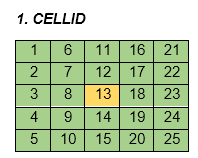

In [22]:
def attribute_1cell_below(attribute, attribute_cols):
    df[attribute+'_1cell_below'] = 0
    for i, row in df[attribute_cols].iterrows():
        below_cell_id = df.ID_1cell_below[i]
        cell_column_name = attribute + '_' + str(below_cell_id)
        df.at[i, attribute+'_1cell_below'] = row[cell_column_name]

In [23]:
def attribute_2cell_below(attribute, attribute_cols):
    df[attribute+'_2cell_below'] = 0
    for i, row in df[attribute_cols].iterrows():
        below_cell_id = df.ID_2cell_below[i]
        cell_column_name = attribute + '_' + str(below_cell_id)
        df.at[i, attribute+'_2cell_below'] = row[cell_column_name]

In [24]:
# get 1 cell ID corresponding to the direction
df['ID_1cell_above'] = df['aspect_NSEW'].map({
    'N': 14,
    'NE': 9,
    'E': 8,
    'SE': 7,
    'S': 12,
    'SW': 17,
    'W': 18,
    'NW': 19
})

def attribute_1cell_above(attribute, attribute_cols):
    df[attribute+'_1cell_above'] = 0
    for i, row in df[attribute_cols].iterrows():
        above_cell_id = df.ID_1cell_above[i]
        cell_column_name = attribute + '_' + str(above_cell_id)
        df.at[i, attribute+'_1cell_above'] = row[cell_column_name]

## 2.3 Elevation*
- Average height
- Average absolute difference in a block 5x5
- Average percentage difference in a block (based on central cell)


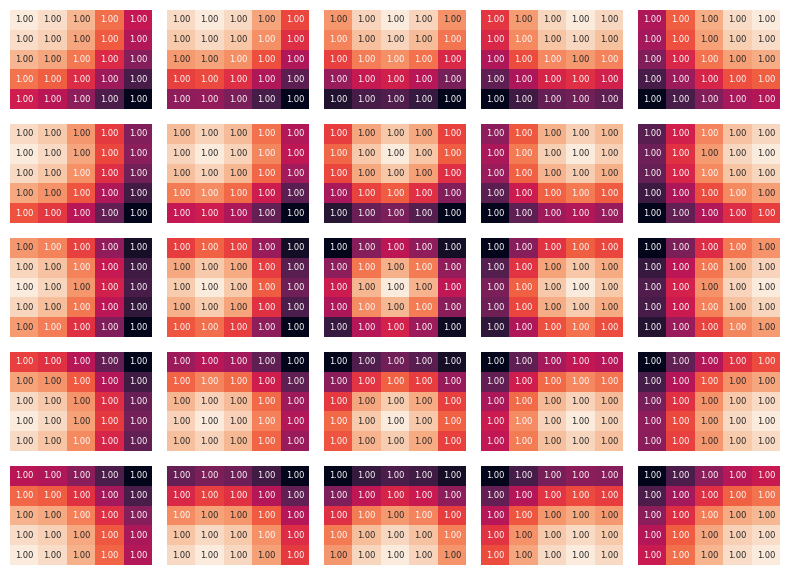

In [25]:
block_attribute(elevation_cols)

In [26]:
df[elevation_cols].head()

,elevation_1,elevation_2,elevation_3,elevation_4,elevation_5,elevation_6,elevation_7,elevation_8,elevation_9,elevation_10,elevation_11,elevation_12,elevation_13,elevation_14,elevation_15,elevation_16,elevation_17,elevation_18,elevation_19,elevation_20,elevation_21,elevation_22,elevation_23,elevation_24,elevation_25
0,130,129,127,126,123,126,125,124,122,119,122,121,119,117,115,119,117,115,114,112,116,114,113,111,110
1,161,158,155,153,151,162,159,155,153,151,162,159,156,153,151,162,160,157,153,151,162,160,157,154,150
2,149,151,154,156,158,154,157,158,160,161,162,164,164,164,165,166,168,168,167,167,170,171,171,170,169
3,80,78,77,75,73,80,78,77,75,73,80,78,77,75,73,80,78,77,75,73,79,78,76,73,72
4,117,115,114,112,110,115,113,111,110,108,112,111,109,107,106,110,109,107,105,104,108,106,105,103,102


### **Elevation of center cell**

In [27]:
df['elevation_center'] = df.elevation_13

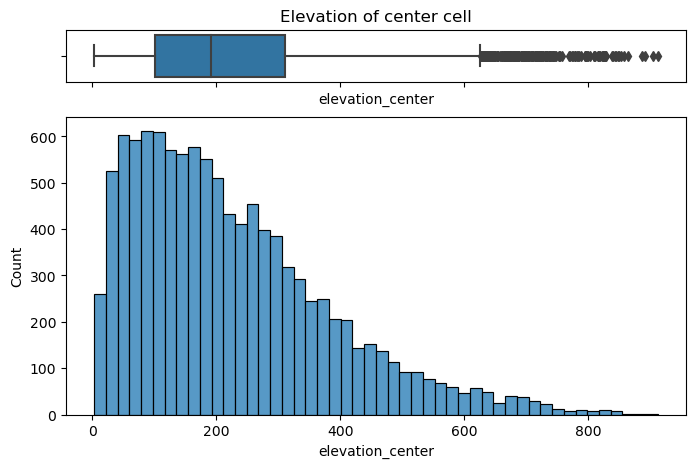

In [28]:
histbox(df.elevation_center, title='Elevation of center cell')

**Elevation of center cell: 1 vs 0**

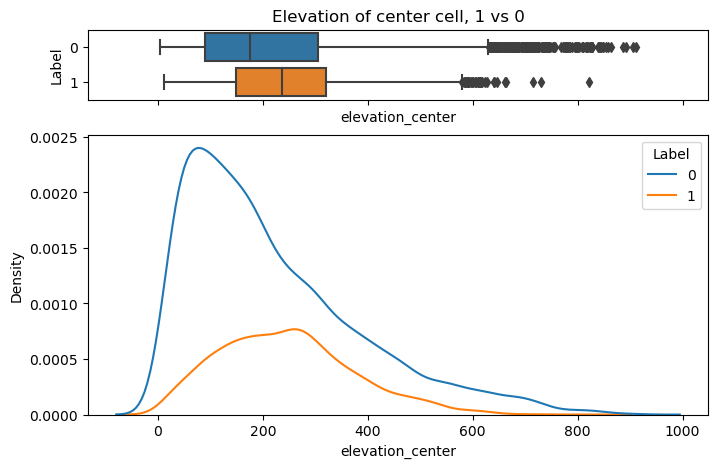

In [29]:
kde_label(df.elevation_center, title='Elevation of center cell, 1 vs 0')

The distribution of non-landslide: skewed right, while landslide: around 200. Elevation of landslide sample is higher than non landslide

**Elevation of center cell: WOE**

In [30]:
convert_woe('elevation_center')

Information value: 0.28


,Bin,Total,Good,Bad,WOE,IV
elevation_center_range,,,,,,
"(275.7, 366.6]",4,1553,565,988,0.5363,0.0465
"(184.8, 275.7]",3,2182,752,1430,0.4538,0.0460
"(366.6, 457.5]",5,898,275,623,0.2777,0.0069
"(457.5, 548.4]",6,494,138,356,0.1478,0.0011
"(93.9, 184.8]",2,2780,633,2147,-0.1223,0.0037
"(2.091, 93.9]",1,2452,312,2140,-0.8221,0.1215
"(548.4, 639.3]",7,274,33,241,-0.8438,0.0147
"(821.1, 912.0]",10,21,1,20,-0.9262,0.0019
"(639.3, 730.2]",8,158,7,151,-1.6974,0.0271


3-4 and 5-6 to an extent has the highest weight?

### Elevation min-max difference

In [31]:
df['elevation_minmax_difference'] = df[elevation_cols].max(axis=1)-df[elevation_cols].min(axis=1)

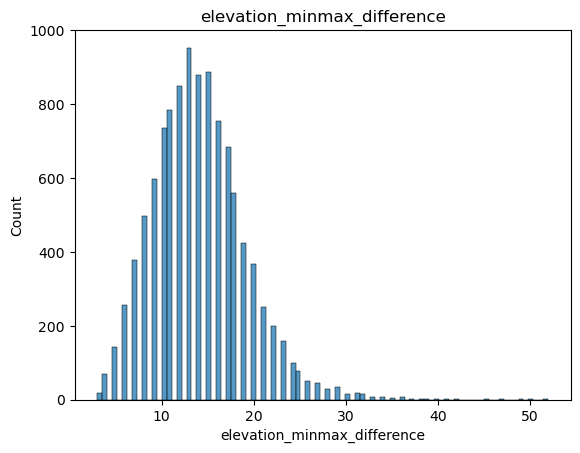

In [32]:
# distribution of elevation difference among cells in a block
sns.histplot(x=df.elevation_minmax_difference)
plt.title('elevation_minmax_difference')
plt.show()

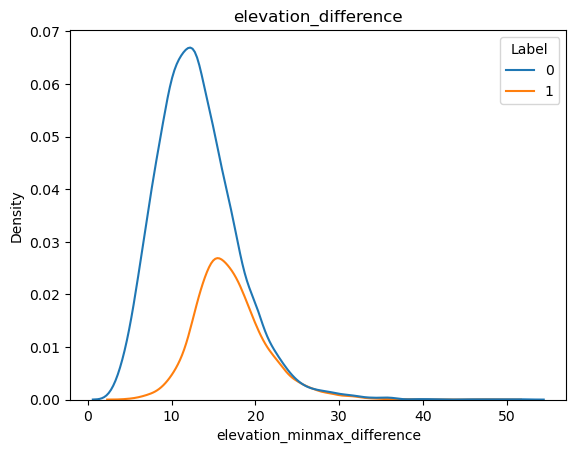

In [33]:
sns.kdeplot(x=df.elevation_minmax_difference, hue=df.Label)
plt.title('elevation_difference')
plt.show()

Does elevation difference correlate with elevation? (does higher location have steeper slope?)

In [34]:
# correlation coef.
df.elevation_minmax_difference.corr(df.elevation_center)

0.2484594056584325

<AxesSubplot: xlabel='elevation_minmax_difference', ylabel='elevation_center'>

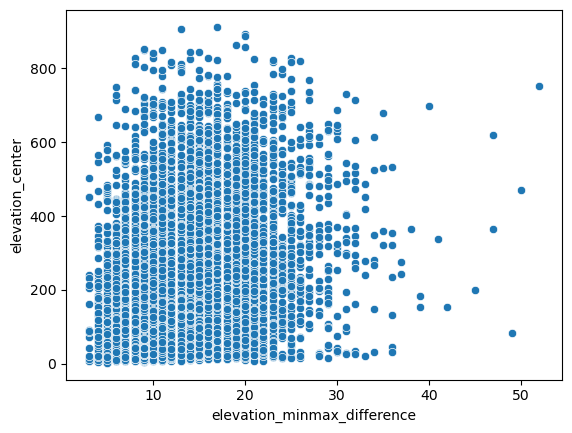

In [35]:
sns.scatterplot(df, x='elevation_minmax_difference', y='elevation_center')

<AxesSubplot: ylabel='Count'>

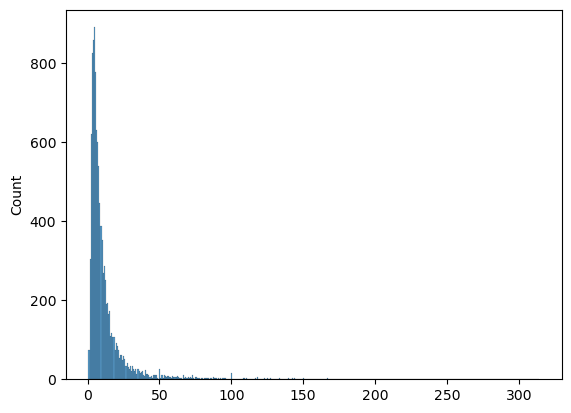

In [36]:
# min max difference as percentage of center cell elevation
sns.histplot(x=100*df.elevation_minmax_difference/df.elevation_center)

Percentage difference is mostly 0-50, but there's outlier that's up to 300%?

In [37]:
df['elevation_difference_pct'] = 100*df.elevation_minmax_difference/df.elevation_center

<AxesSubplot: xlabel='elevation_center', ylabel='Count'>

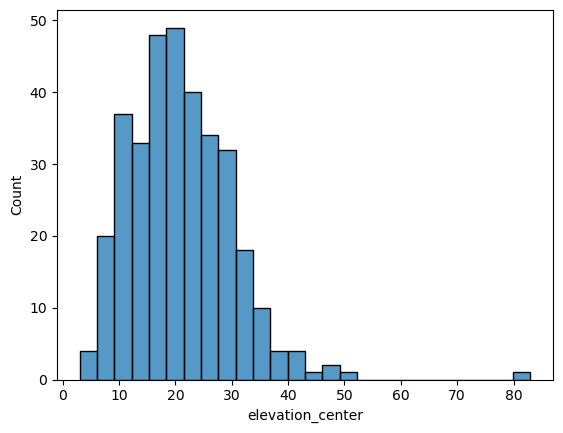

In [38]:
sns.histplot(data=df[df['elevation_difference_pct']>50], x='elevation_center')

Those 300% difference is from very low elevation

**WOE of min-max difference**

In [39]:
convert_woe('elevation_minmax_difference')

Information value: 0.92


,Bin,Total,Good,Bad,WOE,IV
elevation_minmax_difference_range,,,,,,
"(22.6, 27.5]",5,431,208,223,1.0061,0.0495
"(17.7, 22.6]",4,1804,809,995,0.8869,0.1559
"(27.5, 32.4]",6,112,49,63,0.7796,0.0080
"(37.3, 42.2]",8,6,3,3,0.4306,0.0003
"(12.8, 17.7]",3,4157,1344,2813,0.3591,0.0537
"(32.4, 37.3]",7,26,8,18,0.2066,0.0002
"(42.2, 47.1]",9,3,1,2,0.0940,0.0000
"(47.1, 52.0]",10,3,1,2,0.0940,0.0000
"(7.9, 12.8]",2,3460,278,3182,-1.3319,0.3838


In [40]:
ele_minmax_woe = convert_woe_sliced('elevation_minmax_difference', df.elevation_minmax_difference<50)
ele_minmax_woe

Information value: 0.93


,Bin,Total,Good,Bad,WOE,IV
elevation_minmax_difference_range,,,,,,
"(21.4, 26.0]",5,586,276,310,0.9660,0.0614
"(26.0, 30.6]",6,123,57,66,0.8819,0.0114
"(16.8, 21.4]",4,2288,991,1297,0.8257,0.1698
"(30.6, 35.2]",7,51,22,29,0.6910,0.0031
"(44.4, 49.0]",10,4,2,2,0.3322,0.0002
"(12.2, 16.8]",3,3473,1070,2403,0.2885,0.0285
"(35.2, 39.8]",8,12,4,8,0.2212,0.0001
"(39.8, 44.4]",9,3,1,2,0.0939,0.0000
"(7.6, 12.2]",2,3460,278,3182,-1.3321,0.3840


In [41]:
# exclude low occurence
ele_minmax_woe[ele_minmax_woe.Total>100]

,Bin,Total,Good,Bad,WOE,IV
elevation_minmax_difference_range,,,,,,
"(21.4, 26.0]",5,586,276,310,0.9660,0.0614
"(26.0, 30.6]",6,123,57,66,0.8819,0.0114
"(16.8, 21.4]",4,2288,991,1297,0.8257,0.1698
"(12.2, 16.8]",3,3473,1070,2403,0.2885,0.0285
"(7.6, 12.2]",2,3460,278,3182,-1.3321,0.3840
"(2.954, 7.6]",1,862,15,847,-2.7784,0.2735


Can see a very clear trend: 1,2 have negative WOE, 3 is the median, 4,5,6 have highest WOE

### Elevation total difference

In [42]:
df['elevation_total_difference'] = df[elevation_cols].apply(lambda x: df[elevation_cols].max(axis=1) - x).sum(axis=1)

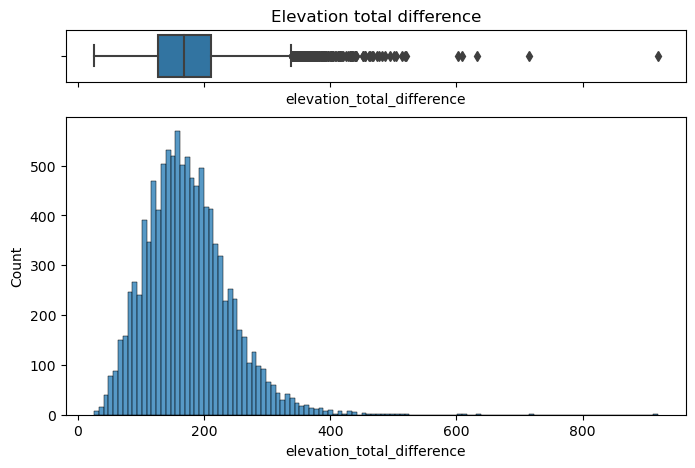

In [43]:
histbox(df.elevation_total_difference, title='Elevation total difference')

**separate by label**

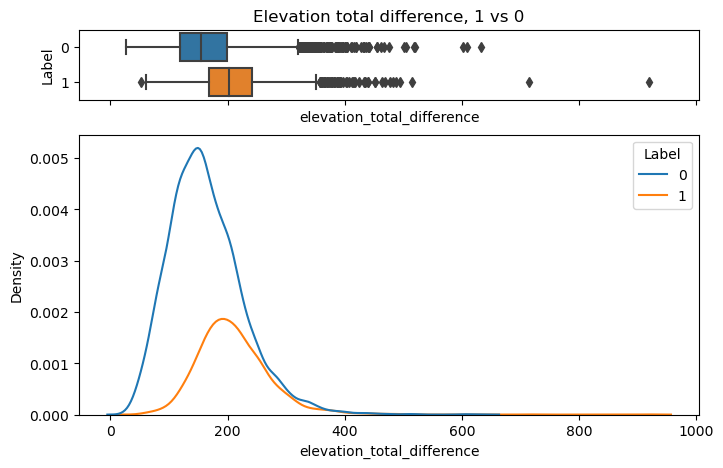

In [44]:
kde_label(df.elevation_total_difference, title='Elevation total difference, 1 vs 0')

- Landslide samples have higher mean of elevation total difference than non landslide.
- Is it actually the case or it's simply because total elevation difference tend to correlate with center cell elevation? 

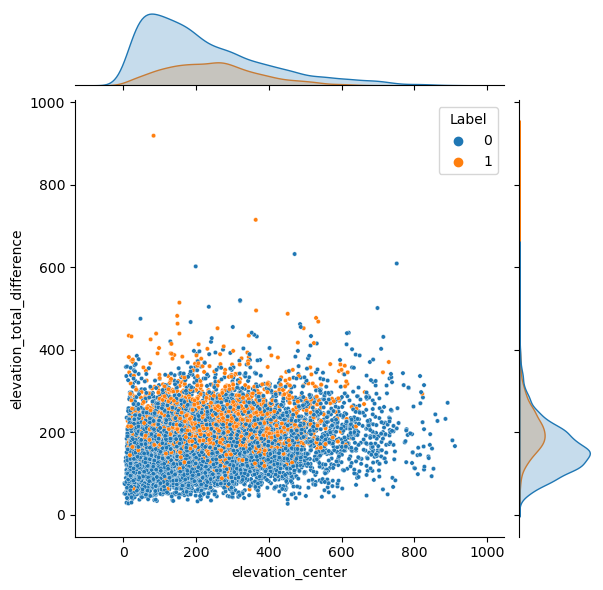

In [45]:
# does elevation total difference correlate with center cell elevation
sns.jointplot(df, x='elevation_center', y='elevation_total_difference', hue='Label', s=10)

In [46]:
# correlation coef.
df.elevation_center.corr(df.elevation_total_difference)

0.23019059337249106

Doesn't seem to be the case. We have reason to believe that LS does have higher mean elevation total difference than non-LS.

In [47]:
convert_woe('elevation_total_difference')

Information value: 0.61


,Bin,Total,Good,Bad,WOE,IV
elevation_total_difference_range,,,,,,
"(293.9, 383.2]",4,415,180,235,0.8129,0.0304
"(204.6, 293.9]",3,2641,1101,1540,0.7602,0.1645
"(383.2, 472.5]",5,60,26,34,0.7149,0.0039
"(472.5, 561.8]",6,10,5,5,0.5656,0.0007
"(651.1, 740.4]",8,1,1,0,0.3135,0.0001
"(829.7, 919.0]",10,1,1,0,0.3135,0.0001
"(740.4, 829.7]",[],0,0,0,0.0000,0.0000
"(115.3, 204.6]",2,5762,1319,4443,-0.1156,0.0069
"(561.8, 651.1]",7,3,0,3,-0.3135,0.0001


In [48]:
# exclude extreme values 400+
convert_woe_sliced('elevation_total_difference', df.elevation_total_difference<400)

Information value: 0.73


,Bin,Total,Good,Bad,WOE,IV
elevation_total_difference_range,,,,,,
"(359.9, 397.0]",10,66,36,30,1.1187,0.0108
"(248.6, 285.7]",7,735,345,390,0.9684,0.0776
"(285.7, 322.8]",8,321,145,176,0.8834,0.0284
"(211.5, 248.6]",6,1420,584,836,0.7400,0.0843
"(174.4, 211.5]",5,2271,761,1510,0.4167,0.0403
"(322.8, 359.9]",9,145,47,98,0.3451,0.0019
"(137.3, 174.4]",4,2582,545,2037,-0.2137,0.0104
"(100.2, 137.3]",3,2021,188,1833,-1.1637,0.1815
"(63.1, 100.2]",2,1020,37,983,-2.1139,0.2269


elevation_total_difference has very high information value than just center cell difference

### Center - 1below

In [49]:
# create elevation of 1 cell below
attribute_1cell_below('elevation', elevation_cols)

In [50]:
df['elevation_1below_diff'] = df.elevation_center - df.elevation_1cell_below

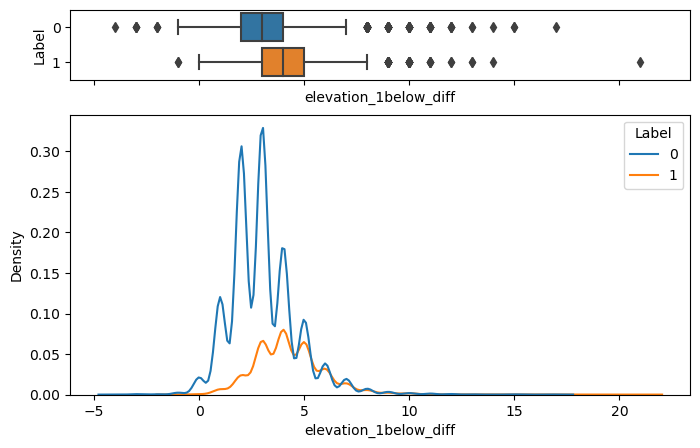

In [51]:
kde_label(df.elevation_1below_diff)

In [52]:
convert_woe('elevation_1below_diff')

Information value: 0.62


,Bin,Total,Good,Bad,WOE,IV
elevation_1below_diff_range,,,,,,
"(6.0, 8.5]",5,366,175,191,0.9848,0.0404
"(8.5, 11.0]",6,87,41,46,0.8846,0.0084
"(3.5, 6.0]",4,3873,1608,2265,0.7541,0.2368
"(18.5, 21.0]",10,1,1,0,0.3135,0.0001
"(11.0, 13.5]",7,11,4,7,0.2852,0.0002
"(13.5, 16.0]",8,4,1,3,0.0000,0.0000
"(16.0, 18.5]",9,1,0,1,-0.1158,0.0000
"(1.0, 3.5]",3,5415,821,4594,-0.6218,0.1626
"(-4.025, -1.5]",1,8,0,8,-0.6840,0.0007


- 2,3: low WOE
- 4,5,6: high woe.
- finetune 10,7,8,9 ->6, 1 ->2

[1,2], [3], 4, 5, [6,7,8,9,10]

In [53]:
tuned_bins = [-5000,1, 3.5, 6, 8.5, 21]

convert_woe('elevation_1below_diff', bins= tuned_bins)

Information value: 0.62


,Bin,Total,Good,Bad,WOE,IV
elevation_1below_diff_range,,,,,,
"(6.0, 8.5]",4,366,175,191,0.9848,0.0404
"(8.5, 21.0]",5,104,47,57,0.8283,0.0085
"(3.5, 6.0]",3,3873,1608,2265,0.7541,0.2368
"(1.0, 3.5]",2,5415,821,4594,-0.6218,0.1626
"(-5000.0, 1.0]",1,1106,65,1041,-1.6418,0.1705


The larger the elevation of center cell compared to the cell directly below, higher chance of LS.

### Elevation 1above - center

In [54]:
attribute_1cell_above('elevation', elevation_cols)

In [55]:
df['elevation_1above_center_diff'] = df.elevation_1cell_above - df.elevation_center

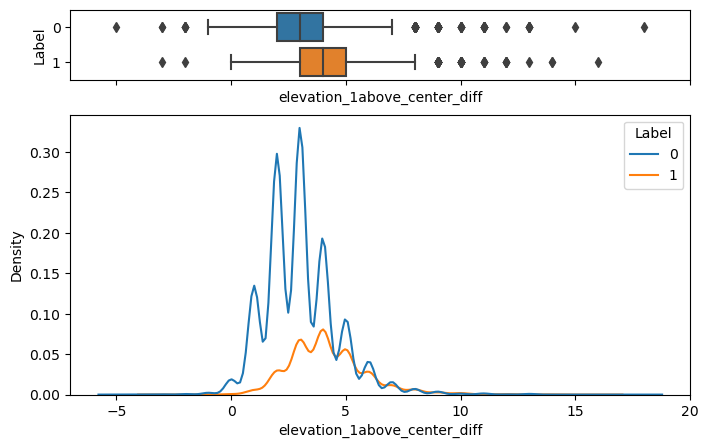

In [56]:
kde_label(df.elevation_1above_center_diff)

In [57]:
convert_woe('elevation_1above_center_diff')

Information value: 0.43


,Bin,Total,Good,Bad,WOE,IV
elevation_1above_center_diff_range,,,,,,
"(6.5, 8.8]",6,326,165,161,1.0901,0.0447
"(8.8, 11.1]",7,92,48,44,1.0708,0.0131
"(4.2, 6.5]",5,1740,778,962,0.8814,0.1484
"(11.1, 13.4]",8,14,6,8,0.4820,0.0006
"(13.4, 15.7]",9,3,2,1,0.4360,0.0003
"(15.7, 18.0]",10,2,1,1,0.1977,0.0000
"(-5.023, -2.7]",1,4,1,3,0.0000,0.0000
"(1.9, 4.2]",4,7513,1658,5855,-0.1628,0.0176
"(-2.7, -0.4]",2,22,1,21,-0.9611,0.0021


### Conclusion:
new feature: 
- elevation_minmax_difference 0.93
- elevation_total_difference 0.73
- centercell-below 0.62


## 2.4 Slope*
To find out
- Mean and distribution of slope angle
- Mean and distribution of center 9 cell
- is there a difference among cells in a block, and does that lead to LS
- how about the difference among 9 center cells
- what if the cell 'below' the center cell has steeper/much challower angle than center cell? (see 2 vertical, 3 horizontal)


Answer:
- LS blocks have steeper slope
- Inner difference, in absolute values and percentage values, show no correlation to LS

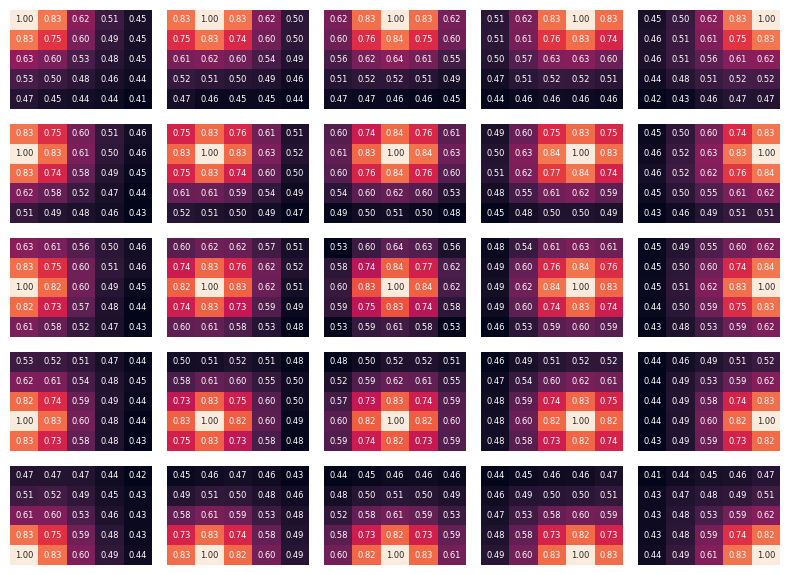

In [58]:
block_attribute(slope_cols)

In [59]:
df[slope_cols].head()

,slope_1,slope_2,slope_3,slope_4,slope_5,slope_6,slope_7,slope_8,slope_9,slope_10,slope_11,slope_12,slope_13,slope_14,slope_15,slope_16,slope_17,slope_18,slope_19,slope_20,slope_21,slope_22,slope_23,slope_24,slope_25
0,35.2644,37.2921,33.8545,35.7958,40.3155,38.8767,39.5097,40.5106,45.8345,45.0000,36.0550,40.5106,44.5637,41.8103,38.8767,33.8545,38.8767,33.8545,33.8545,32.6319,32.6319,30.2463,30.2463,30.2463,30.2463
1,32.3115,32.3115,26.5650,21.8014,22.4069,27.0171,35.2644,31.3112,21.8014,21.8014,30.9638,31.3112,32.3115,26.5650,21.8014,26.5650,27.0171,35.2644,31.3112,27.0171,26.5650,26.5650,30.9638,34.9920,31.3112
2,42.6746,43.3317,40.7032,35.7958,32.3115,56.7703,53.6761,46.2340,40.5106,36.0550,54.2531,48.1897,45.0000,35.2644,31.3112,45.0000,36.0550,35.2644,31.3112,21.8014,37.9907,27.0171,27.0171,28.3032,26.5650
3,19.8270,17.5484,17.5484,22.4069,16.6992,16.6992,16.6992,16.6992,21.8014,16.6992,16.6992,16.6992,16.6992,21.8014,16.6992,17.5484,16.6992,17.5484,24.0948,22.4069,15.7932,19.8270,30.2463,26.5650,19.8270
4,32.6319,26.5650,30.2463,29.4962,30.2463,32.6319,29.4962,30.2463,30.2463,26.5650,30.2463,26.5650,29.4962,30.2463,24.0948,26.5650,30.2463,29.4962,26.5650,24.0948,26.5650,30.2463,26.5650,22.9898,24.0948


### Center cell

In [60]:
df['slope_center'] = df.slope_13

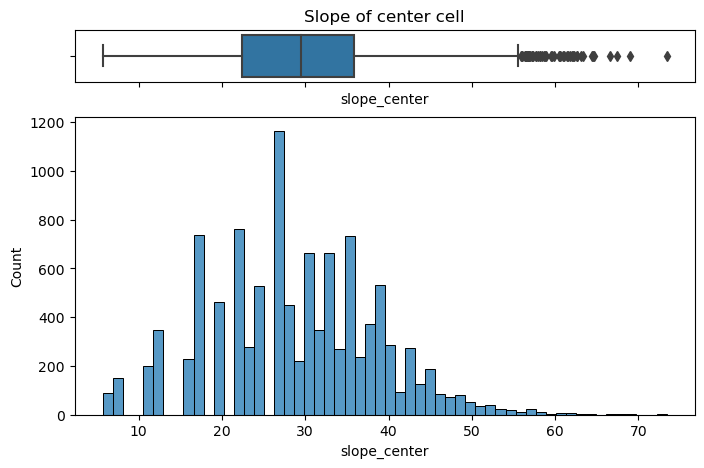

In [61]:
histbox(df.slope_center, title='Slope of center cell')

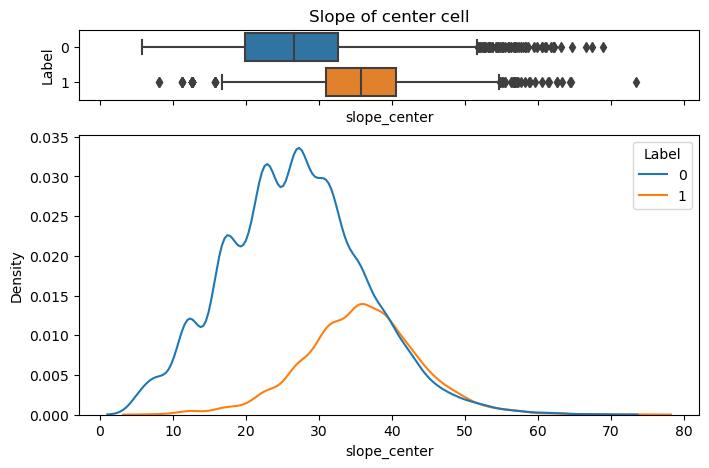

In [62]:
kde_label(df.slope_center, title='Slope of center cell')

Landslide location have steeper slope > non landslide

### Mean slope

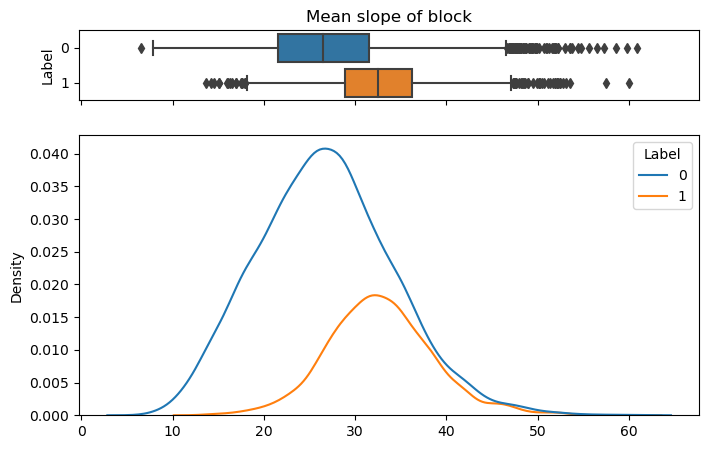

In [63]:
kde_label(df[slope_cols].mean(axis=1), title='Mean slope of block')

### Min max difference

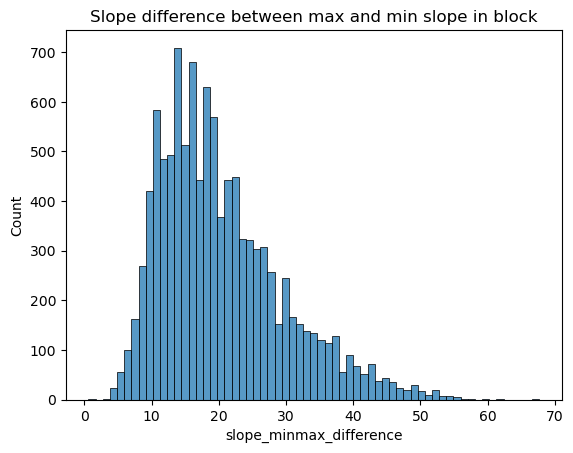

In [64]:
df['slope_minmax_difference'] = df[slope_cols].max(axis=1) - df[slope_cols].min(axis=1)

sns.histplot(x=df['slope_minmax_difference'])
plt.title('Slope difference between max and min slope in block')
plt.show()

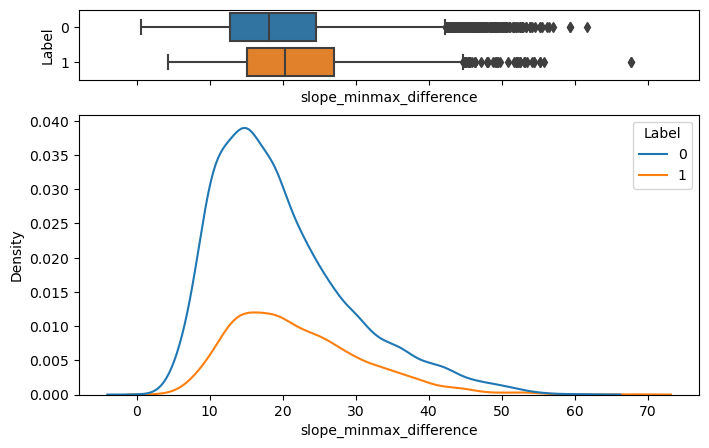

In [65]:
kde_label(df.slope_minmax_difference)

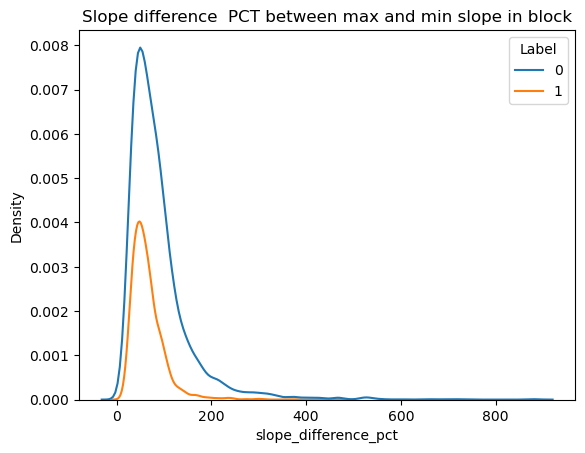

In [66]:
df['slope_difference_pct'] = 100*df['slope_minmax_difference']/df.slope_center

sns.kdeplot(x=df['slope_difference_pct'], hue= df.Label.astype(str))
plt.title('Slope difference  PCT between max and min slope in block')
plt.show()

In [67]:
convert_woe('slope_minmax_difference')

Information value: 0.09


,Bin,Total,Good,Bad,WOE,IV
slope_minmax_difference_range,,,,,,
"(60.973, 67.681]",10,3,2,1,0.4360,0.0003
"(27.436, 34.143]",5,1172,387,785,0.3880,0.0179
"(54.266, 60.973]",9,14,5,9,0.3000,0.0002
"(34.143, 40.851]",6,625,189,436,0.2585,0.0042
"(20.728, 27.436]",4,2171,632,1539,0.2076,0.0091
"(14.021, 20.728]",3,3491,866,2625,-0.0103,0.0000
"(40.851, 47.558]",7,276,59,217,-0.1956,0.0010
"(47.558, 54.266]",8,107,22,85,-0.2281,0.0005
"(7.313, 14.021]",2,2741,533,2208,-0.3213,0.0240


Very low information value.

### The 1-cell below

In [68]:
attribute_1cell_below('slope', slope_cols)

In [69]:
# slope_1cell_below_difference
df['slope_1cell_below_diff'] = df.slope_center - df.slope_1cell_below

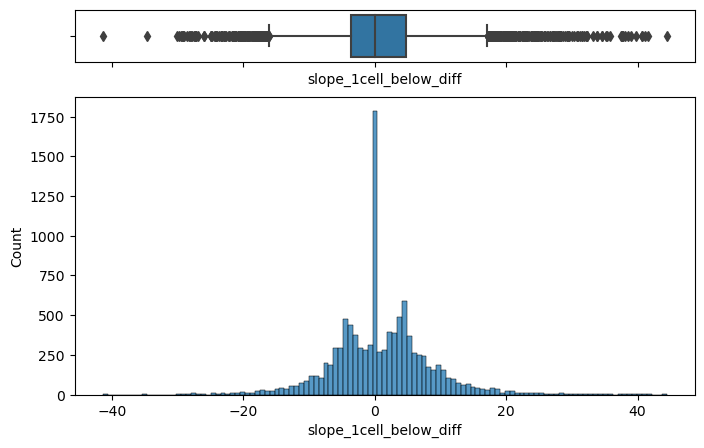

In [70]:
histbox(df['slope_1cell_below_diff'])

Seems like the distribution is normal, mean = 0.

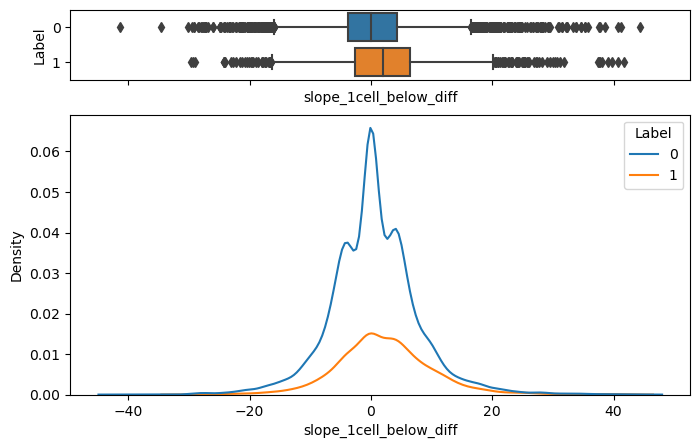

In [71]:
kde_label(df['slope_1cell_below_diff'])

Landslide tends to happen where the cell below has greater slope?

In [72]:
convert_woe('slope_1cell_below_diff')

Information value: 0.07


,Bin,Total,Good,Bad,WOE,IV
slope_1cell_below_diff_range,,,,,,
"(35.849, 44.426]",10,14,8,6,0.8208,0.0018
"(10.12, 18.697]",7,775,298,477,0.6203,0.0317
"(18.697, 27.273]",8,140,53,87,0.5634,0.0050
"(1.544, 10.12]",6,3642,1027,2615,0.1635,0.0094
"(27.273, 35.849]",9,40,10,30,0.0000,0.0000
"(-15.609, -7.032]",4,931,210,721,-0.1333,0.0015
"(-32.761, -24.185]",2,29,6,23,-0.1750,0.0001
"(-41.423, -32.761]",1,2,0,2,-0.2195,0.0001
"(-24.185, -15.609]",3,155,32,123,-0.2305,0.0008


slope diff = slope center - slope below
- 10, 7, 8, 6, 9 (positive difference, center > below): positive woe
- 5, 3, 1, 2, 4 (negative difference, center < below): negative woe
- ====> LS tends to happen where the center cell has greater slope than the cell directly below

Very low IV though. The difference between the bins aren't that significant.

## 2.5 Aspect

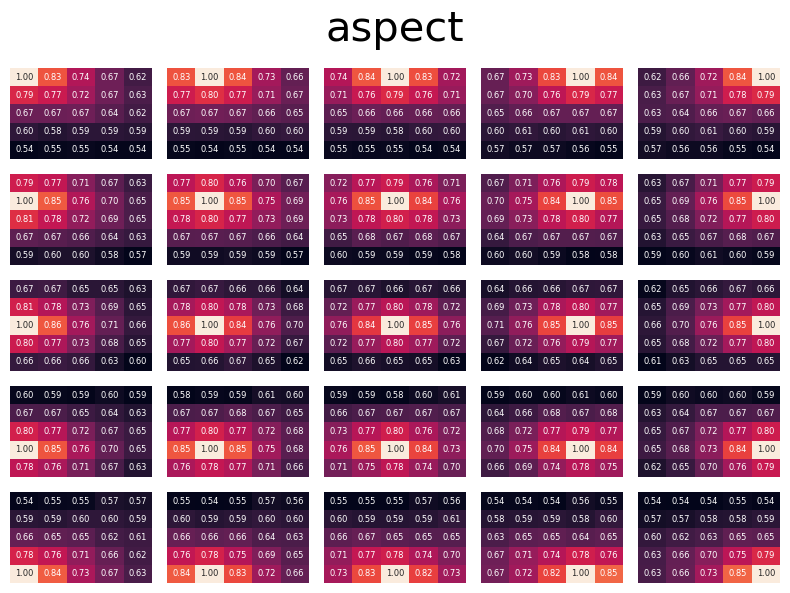

In [73]:
block_attribute(aspect_cols, 'aspect')

In [74]:
df[aspect_cols].head()

,aspect_1,aspect_2,aspect_3,aspect_4,aspect_5,aspect_6,aspect_7,aspect_8,aspect_9,aspect_10,aspect_11,aspect_12,aspect_13,aspect_14,aspect_15,aspect_16,aspect_17,aspect_18,aspect_19,aspect_20,aspect_21,aspect_22,aspect_23,aspect_24,aspect_25
0,98.1301,113.1986,116.5650,123.6901,135.0000,97.1250,104.0362,110.5560,119.0546,126.8699,105.9454,110.5560,113.9625,116.5650,119.7449,116.5650,119.7449,116.5650,116.5650,128.6598,128.6598,120.9638,120.9638,120.9638,120.9638
1,198.4350,198.4350,180.0000,180.0000,194.0362,191.3099,188.1301,189.4623,180.0000,180.0000,180.0000,189.4623,198.4350,180.0000,180.0000,180.0000,191.3099,188.1301,189.4623,168.6901,180.0000,180.0000,180.0000,180.0000,170.5377
2,310.6013,302.0054,305.5377,303.6901,288.4349,301.6075,287.1027,286.6992,290.5560,285.9454,300.2564,280.3048,270.0000,278.1301,279.4623,306.8699,285.9454,261.8699,260.5377,270.0000,309.8056,281.3099,258.6901,248.1986,270.0000
3,213.6901,198.4350,198.4350,194.0362,180.0000,180.0000,180.0000,180.0000,180.0000,180.0000,180.0000,180.0000,180.0000,180.0000,180.0000,161.5650,180.0000,161.5650,153.4350,165.9638,135.0000,146.3099,149.0362,143.1301,146.3099
4,128.6598,126.8699,120.9638,135.0000,120.9638,128.6598,135.0000,120.9638,120.9638,126.8699,120.9638,126.8699,135.0000,120.9638,116.5650,126.8699,120.9638,135.0000,126.8699,116.5650,126.8699,120.9638,126.8699,135.0000,116.5650


### Visualize aspect

In [75]:
def visualize_aspect(index):
    sample = df[aspect_cols].loc[index,:]

    # create a polar plot
    ax = plt.subplot(111, projection='polar')

    # convert the degrees to radians
    theta = np.deg2rad(sample)

    # plot the directions
    ax.plot(theta, np.ones(25), 'o')

    # set the labels for each direction
    ax.set_xticklabels([f'Aspect_{i}' for i in range(25)])

    # set the title
    ax.set_title('Direction Degrees')

    print(index)
    # show the plot
    plt.show()

C:\Users\nguye_5159g\AppData\Local\Temp\ipykernel_24292\128234399.py:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([f'Aspect_{i}' for i in range(25)])


8560


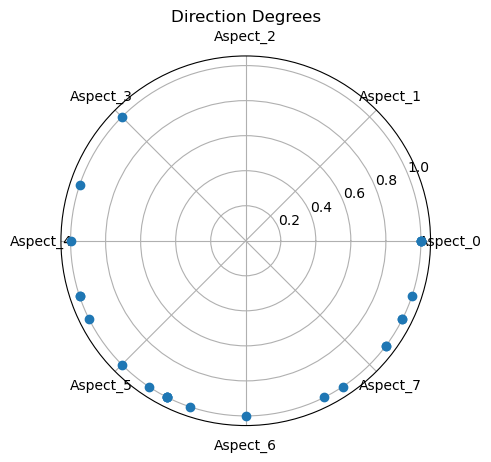

In [76]:
visualize_aspect(8560)

Notable 8560,166, 10454, 8112

### Center cell aspect

<AxesSubplot: xlabel='aspect_NSEW', ylabel='count'>

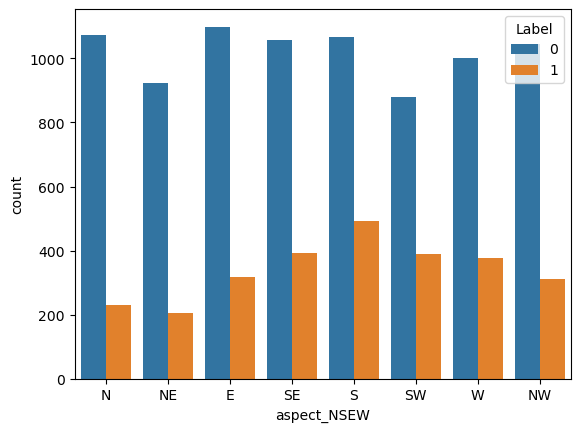

In [77]:
sns.countplot(x=df.aspect_NSEW, hue=df.Label)

In [78]:
convert_woe_cat('aspect_NSEW')

Information value: 0.07


,Total,Good,Bad,WOE,IV
aspect_NSEW,,,,,
S,1559,493,1066,0.3253,0.0165
SW,1268,388,880,0.2775,0.0097
W,1379,377,1002,0.1202,0.0019
SE,1453,394,1059,0.1091,0.0016
NW,1356,310,1046,-0.1166,0.0017
E,1417,318,1099,-0.1404,0.0025
NE,1128,206,922,-0.3958,0.0148
N,1304,230,1074,-0.4383,0.0207


### Aspect span (ie what's the angle of the two far left and far right)

In [79]:
df[aspect_cols].head()

,aspect_1,aspect_2,aspect_3,aspect_4,aspect_5,aspect_6,aspect_7,aspect_8,aspect_9,aspect_10,aspect_11,aspect_12,aspect_13,aspect_14,aspect_15,aspect_16,aspect_17,aspect_18,aspect_19,aspect_20,aspect_21,aspect_22,aspect_23,aspect_24,aspect_25
0,98.1301,113.1986,116.5650,123.6901,135.0000,97.1250,104.0362,110.5560,119.0546,126.8699,105.9454,110.5560,113.9625,116.5650,119.7449,116.5650,119.7449,116.5650,116.5650,128.6598,128.6598,120.9638,120.9638,120.9638,120.9638
1,198.4350,198.4350,180.0000,180.0000,194.0362,191.3099,188.1301,189.4623,180.0000,180.0000,180.0000,189.4623,198.4350,180.0000,180.0000,180.0000,191.3099,188.1301,189.4623,168.6901,180.0000,180.0000,180.0000,180.0000,170.5377
2,310.6013,302.0054,305.5377,303.6901,288.4349,301.6075,287.1027,286.6992,290.5560,285.9454,300.2564,280.3048,270.0000,278.1301,279.4623,306.8699,285.9454,261.8699,260.5377,270.0000,309.8056,281.3099,258.6901,248.1986,270.0000
3,213.6901,198.4350,198.4350,194.0362,180.0000,180.0000,180.0000,180.0000,180.0000,180.0000,180.0000,180.0000,180.0000,180.0000,180.0000,161.5650,180.0000,161.5650,153.4350,165.9638,135.0000,146.3099,149.0362,143.1301,146.3099
4,128.6598,126.8699,120.9638,135.0000,120.9638,128.6598,135.0000,120.9638,120.9638,126.8699,120.9638,126.8699,135.0000,120.9638,116.5650,126.8699,120.9638,135.0000,126.8699,116.5650,126.8699,120.9638,126.8699,135.0000,116.5650


In [80]:
# span between the far left/far right
aspect_sorted = pd.DataFrame(np.sort(df[aspect_cols].values))
aspect_sorted[25] = aspect_sorted[0] + 360
for i in np.arange(25,0,-1):
    aspect_sorted[i] = aspect_sorted[i] - aspect_sorted[(i-1)]
df['aspect_span'] = 360-aspect_sorted.max(axis=1)

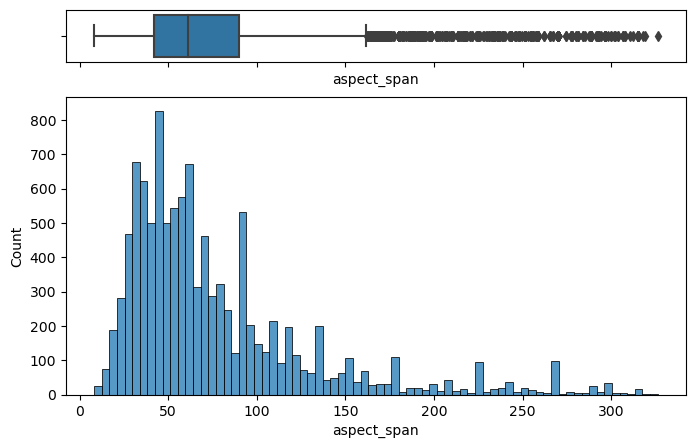

In [81]:
histbox(df['aspect_span'])

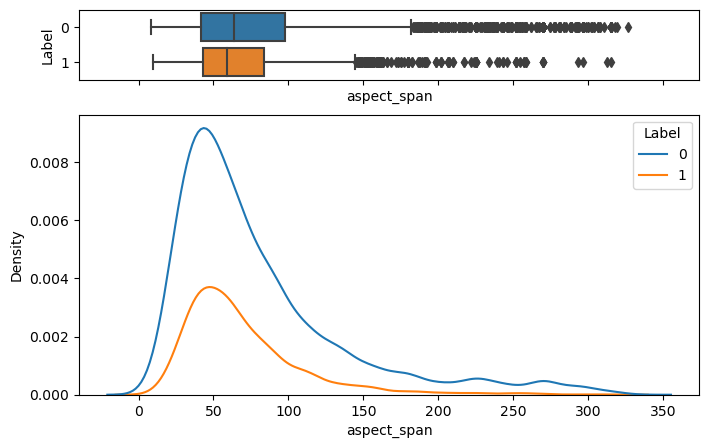

In [82]:
kde_label(df['aspect_span'])

In [83]:
convert_woe('aspect_span')

Information value: 0.09


,Bin,Total,Good,Bad,WOE,IV
aspect_span_range,,,,,,
"(39.948, 71.766]",2,4238,1224,3014,0.1970,0.0159
"(71.766, 103.584]",3,1882,520,1362,0.1350,0.0033
"(7.812, 39.948]",1,2470,565,1905,-0.1163,0.0030
"(135.402, 167.22]",5,401,89,312,-0.1515,0.0008
"(103.584, 135.402]",4,1070,236,834,-0.1621,0.0025
"(167.22, 199.038]",6,267,35,232,-0.7526,0.0117
"(230.856, 262.674]",8,129,16,113,-0.7690,0.0061
"(199.038, 230.856]",7,187,22,165,-0.8481,0.0103
"(294.492, 326.31]",10,67,3,64,-1.4368,0.0097


### Sum of span from center cell

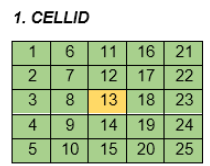

In [84]:
center_9_cells = [7,8,9,12,13,14,17,18,19]
df_9_cells = df['aspect_'+ pd.Series(center_9_cells).astype(str)]
# shift cw every angle a degree of center cell
df_9_cells = df_9_cells.sub(df_9_cells.aspect_13, axis=0)
# convert left angle (181 -> 360) to negative degree
df_9_cells = df_9_cells.apply(lambda x: x.apply(lambda x: x-360 if x>180 else x), axis=1)
# sum of spans of 8 cells around centercell from center cell aspect
df['aspect_sum_span_9cells'] = df_9_cells.abs().sum(axis=1)

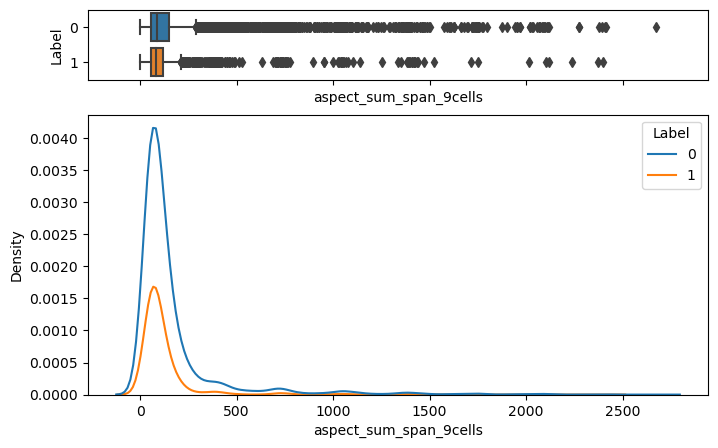

In [85]:
kde_label(df['aspect_sum_span_9cells'] )

In [86]:
convert_woe_sliced('aspect_sum_span_9cells', df.aspect_sum_span_9cells<200)

Information value: 0.03


,Bin,Total,Good,Bad,WOE,IV
aspect_sum_span_9cells_range,,,,,,
"(39.988, 59.983]",3,1807,553,1254,0.1847,0.0070
"(79.977, 99.971]",5,1505,444,1061,0.1324,0.0029
"(59.983, 79.977]",4,1875,531,1344,0.0753,0.0012
"(99.971, 119.966]",6,1007,270,737,0.0002,0.0000
"(19.994, 39.988]",2,1004,239,765,-0.1576,0.0026
"(159.954, 179.948]",9,360,85,275,-0.1653,0.0010
"(139.96, 159.954]",8,516,117,399,-0.2183,0.0026
"(119.966, 139.96]",7,701,157,544,-0.2351,0.0040
"(179.948, 199.942]",10,279,57,222,-0.3427,0.0034


In [87]:
convert_woe('aspect_sum_span_9cells', bins=[-100, 50, 100, 150, 200, 3000])

Information value: 0.08


,Bin,Total,Good,Bad,WOE,IV
aspect_sum_span_9cells_range,,,,,,
"(50, 100]",2,4328,1267,3061,0.2160,0.0196
"(-100, 50]",1,2083,533,1550,0.0310,0.0002
"(100, 150]",3,1970,479,1491,-0.0367,0.0002
"(150, 200]",4,892,207,685,-0.0969,0.0008
"(200, 3000]",5,1591,230,1361,-0.6735,0.0555


<AxesSubplot: >

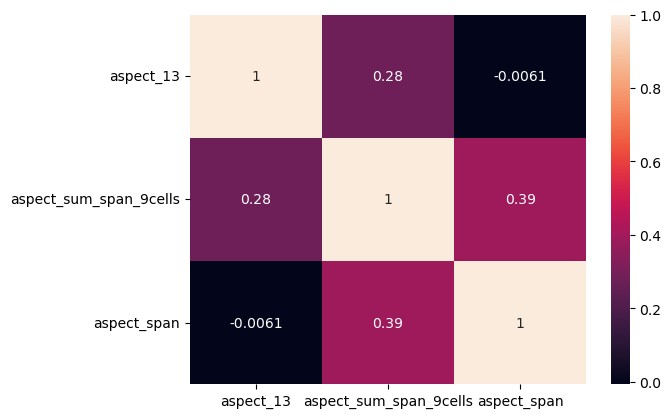

In [88]:
sns.heatmap(df[['aspect_13', 'aspect_sum_span_9cells', 'aspect_span']].corr(), annot=True)

### Conclusion

- Aspect center NSEW
- Aspect span
- Sum of span from center cell

## 2.6 Placurv

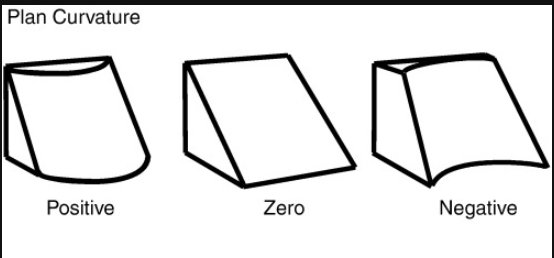

Center cell: + or - more LS?

Have more + (extrude) or more - (carved in) lead to more LS

regarding the centercell - cellbelow: does
>- ++ (both extrude)
>- -- (both carved in)
>- +- (center extrude but below carved in)
>- -+ (center carved in but below extrude)
which one leads to more LS

and then move to the difference of center-1below
+: center more extrude than below
-: center less extrude/more carve in than below

sum of center+below:
- large ++ 
- large --
- near to 0

### Visualize the correlation

In [89]:
df[placurv_cols].head()

,placurv_1,placurv_2,placurv_3,placurv_4,placurv_5,placurv_6,placurv_7,placurv_8,placurv_9,placurv_10,placurv_11,placurv_12,placurv_13,placurv_14,placurv_15,placurv_16,placurv_17,placurv_18,placurv_19,placurv_20,placurv_21,placurv_22,placurv_23,placurv_24,placurv_25
0,0.0385,0.0295,0.0314,0.0258,0.0105,0.0283,0.0274,0.0198,0.0093,0.0088,0.0215,0.0212,0.0173,0.0067,-0.0087,0.0239,0.0126,-0.0042,0.0036,-0.0068,0.0133,0.0053,0.0070,-0.0178,-0.0078
1,0.0070,0.0122,0.0179,0.0107,0.0173,0.0050,0.0109,0.0135,0.0223,0.0171,0.0187,0.0084,0.0170,0.0196,0.0167,0.0022,0.0084,0.0003,-0.0026,0.0027,0.0192,0.0110,0.0056,0.0056,-0.0001
2,0.0076,0.0160,0.0322,0.0261,0.0193,0.0273,0.0224,0.0383,0.0283,0.0134,0.0331,0.0337,0.0431,0.0258,0.0016,0.0608,0.0504,0.0422,0.0115,-0.0030,0.0818,0.0577,0.0350,0.0105,-0.0129
3,0.0335,0.0302,0.0324,0.0412,0.0385,0.0356,0.0385,0.0361,0.0331,0.0356,0.0407,0.0324,0.0323,0.0234,0.0318,0.0268,0.0283,0.0229,0.0219,0.0117,0.0231,0.0215,0.0195,0.0177,0.0178
4,0.0056,-0.0021,-0.0115,-0.0117,-0.0100,0.0154,-0.0020,0.0005,-0.0111,-0.0061,0.0129,-0.0056,-0.0072,-0.0092,-0.0091,-0.0009,-0.0024,-0.0026,-0.0067,-0.0149,0.0078,-0.0053,-0.0157,-0.0035,-0.0187


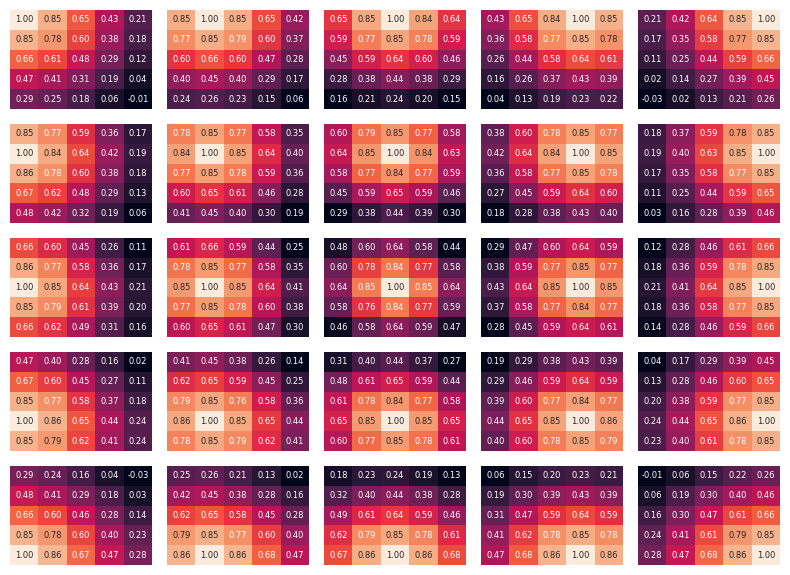

In [90]:
block_attribute(placurv_cols)

### Placurv center

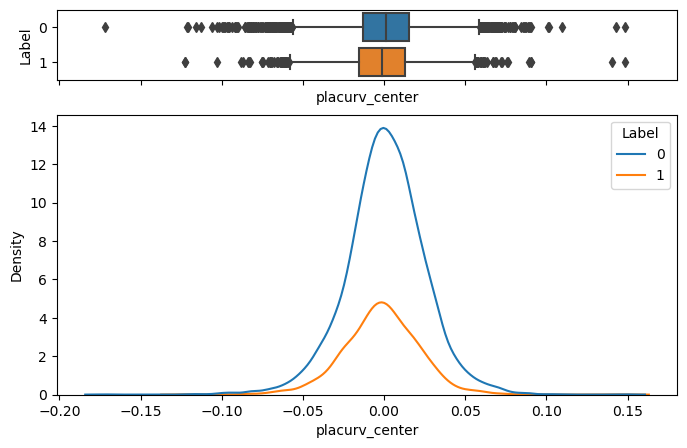

In [91]:
df['placurv_center'] = df.placurv_13
kde_label(df.placurv_center)

Has a normal distribution, seem similar in LS chance?

In [92]:
df.Label[df.placurv_center>0].mean()

0.23149151318165404

In [93]:
df.Label[df.placurv_center<0].mean()

0.26915852742299023

<AxesSubplot: xlabel='Label', ylabel='count'>

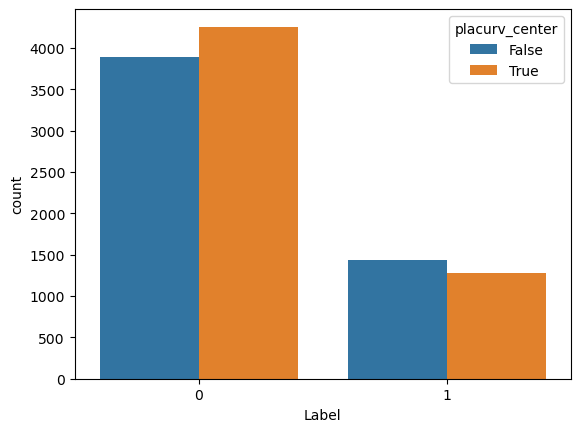

In [94]:
sns.countplot(x=df['Label'], hue=(df.placurv_center>0))

in Label 0: placurv >0
in label 1: placurv <0

=> placurv < 0 (carved in) leads to more LS?

In [95]:
convert_woe('placurv_center', bins=[-1,-0.05,-0.025,0,0.025,0.05,1])

Information value: 0.02


,Bin,Total,Good,Bad,WOE,IV
placurv_center_range,,,,,,
"(-0.05, -0.025]",2,1116,323,793,0.1986,0.0043
"(-0.025, 0.0]",3,3951,1047,2904,0.0782,0.0023
"(-1.0, -0.05]",1,259,64,195,-0.0149,0.0000
"(0.0, 0.025]",4,4081,979,3102,-0.0545,0.0011
"(0.025, 0.05]",5,1218,259,959,-0.2085,0.0047
"(0.05, 1.0]",6,239,44,195,-0.3712,0.0029


### 1 cell below

In [96]:
# create
attribute_1cell_below('placurv', placurv_cols)

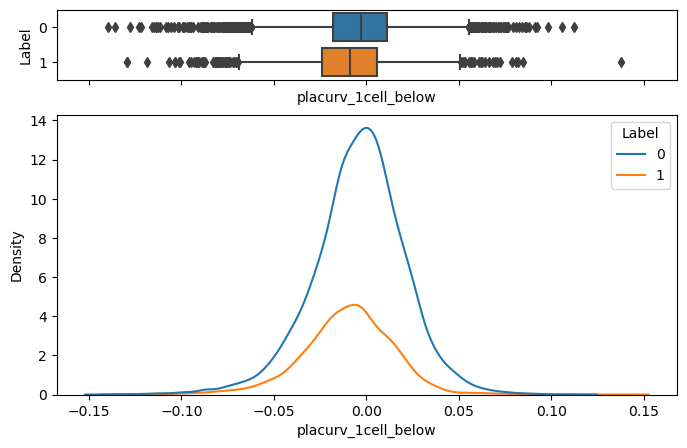

In [97]:
kde_label(df.placurv_1cell_below)

In [98]:
convert_woe('placurv_1cell_below', bins=[-1,-0.05,-0.025,0,0.025,0.05,1])

Information value: 0.07


,Bin,Total,Good,Bad,WOE,IV
placurv_1cell_below_range,,,,,,
"(-1.0, -0.05]",1,480,154,326,0.3415,0.0057
"(-0.05, -0.025]",2,1596,490,1106,0.2827,0.0126
"(-0.025, 0.0]",3,4266,1185,3081,0.1427,0.0083
"(0.0, 0.025]",4,3559,743,2816,-0.2330,0.0168
"(0.05, 1.0]",6,141,25,116,-0.4009,0.0020
"(0.025, 0.05]",5,822,119,703,-0.6666,0.0283


Funny the cell below give more information than the center cell.
1,2,3: negative -> LS
4,5,6: positive -> less

### sum of center+cell below

In [99]:
df['placurv_sum_center_below'] = df.placurv_center + df.placurv_1cell_below

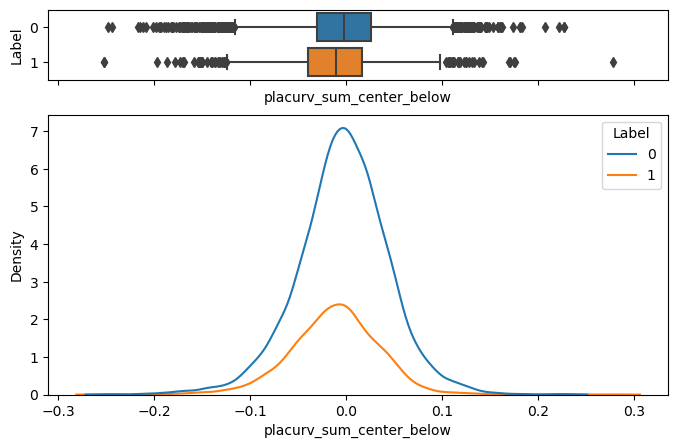

In [100]:
kde_label(df['placurv_sum_center_below'])

In [101]:
convert_woe('placurv_sum_center_below', bins=[-1,-0.05,-0.025,0,0.025,0.05,1])

Information value: 0.04


,Bin,Total,Good,Bad,WOE,IV
placurv_sum_center_below_range,,,,,,
"(-1.0, -0.05]",1,1652,489,1163,0.2308,0.0086
"(-0.05, -0.025]",2,1699,486,1213,0.1828,0.0055
"(-0.025, 0.0]",3,2516,652,1864,0.0480,0.0005
"(0.0, 0.025]",4,2340,551,1789,-0.0787,0.0013
"(0.025, 0.05]",5,1549,338,1211,-0.1762,0.0043
"(0.05, 1.0]",6,1108,200,908,-0.4098,0.0155


### center - cell below
the intuition here is that, if center is + while cell below is -, center cell has less support thus more chance LS

In [102]:
df['placurv_center_below_diff'] = df.placurv_13 - df.placurv_1cell_below

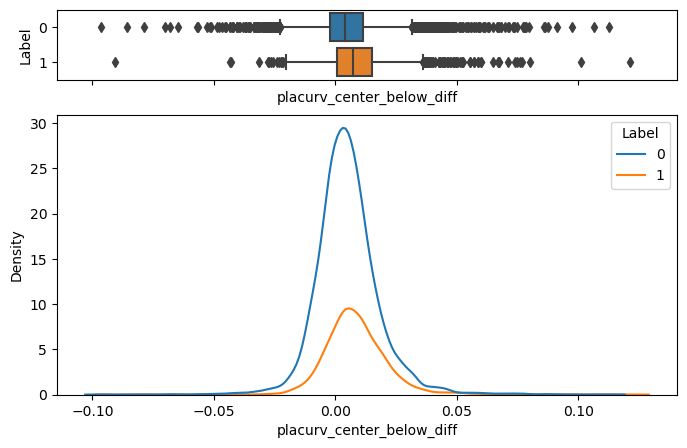

In [103]:
kde_label(df['placurv_center_below_diff'])

seems like the higher the range (cell center > cell below), more chance of LS

In [104]:
convert_woe('placurv_center_below_diff',bins=[-1,-0.05,-0.025,0,0.025,0.05,1])

Information value: 0.06


,Bin,Total,Good,Bad,WOE,IV
placurv_center_below_diff_range,,,,,,
"(0.05, 1.0]",6,81,27,54,0.3608,0.0012
"(0.025, 0.05]",5,616,191,425,0.2939,0.0053
"(0.0, 0.025]",4,6858,1894,4964,0.1349,0.0119
"(-0.025, 0.0]",3,3216,596,2620,-0.3806,0.0389
"(-1.0, -0.05]",1,12,1,11,-0.5409,0.0005
"(-0.05, -0.025]",2,81,7,74,-1.0361,0.0067


### 4 categories: ++, +-, -+, --

In [105]:
df[['placurv_center', 'placurv_1cell_below']]

,placurv_center,placurv_1cell_below
0,0.0173,0.0036
1,0.0170,0.0196
2,0.0431,0.0383
3,0.0323,0.0234
4,-0.0072,-0.0067
...,...,...
10859,0.0091,0.0029
10860,0.0167,0.0064
10861,0.0073,-0.0026
10862,-0.0141,-0.0234


In [106]:
# num -> sign function
int_sign = lambda x: '+' if x>0 else '-'

In [107]:
df['placurv_signs'] = df.placurv_center.apply(int_sign) + df.placurv_1cell_below.apply(int_sign)

<AxesSubplot: xlabel='placurv_signs', ylabel='count'>

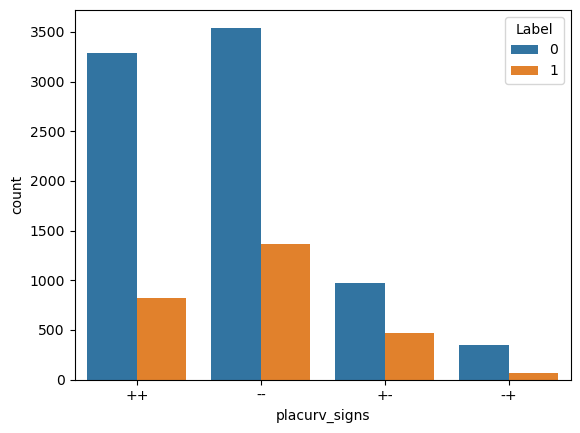

In [108]:
sns.countplot(x=df['placurv_signs'], hue=df.Label)

In [109]:
df.groupby('placurv_signs').mean(numeric_only=True)['Label']

placurv_signs
++   0.1991
+-   0.3240
-+   0.1671
--   0.2780
Name: Label, dtype: float64

+- has highest LS rate: centercell convex (+) while cell below concave (-)

followed by -- (both is concave)

++ is lower.

lowest is -+. 

In [110]:
convert_woe_cat('placurv_signs')

Information value: 0.07


,Total,Good,Bad,WOE,IV
placurv_signs,,,,,
+-,1435,465,970,0.3608,0.0188
--,4907,1364,3543,0.1438,0.0097
++,4103,817,3286,-0.2923,0.0300
-+,419,70,349,-0.4930,0.0084


### 8 category: 2 cell below

In [111]:
# create 2cell attribute
attribute_2cell_below('placurv', placurv_cols)

In [112]:
# create signs column
df['placurv_signs_8'] = df.placurv_signs + df.placurv_2cell_below.apply(int_sign)

In [113]:
df.groupby('placurv_signs_8').mean(numeric_only=True)['Label'].sort_values(ascending=False)

placurv_signs_8
+--   0.3465
---   0.2870
++-   0.2822
+-+   0.1804
-++   0.1706
+++   0.1701
-+-   0.1635
--+   0.1183
Name: Label, dtype: float64

- Highest: center + while 2 below -
- 2nd/3rd highest: all - or top 2+ while bottom -

- lowest: top2 - while bottom +

- The rest: almost the same rate?

In [114]:
convert_woe_cat('placurv_signs_8')

Information value: 0.13


,Total,Good,Bad,WOE,IV
placurv_signs_8,,,,,
+--,1241,430,811,0.4604,0.0271
---,4645,1333,3312,0.1881,0.0159
++-,1063,300,763,0.1635,0.0027
+-+,194,35,159,-0.3902,0.0026
-++,211,36,175,-0.4554,0.0037
+++,3040,517,2523,-0.4845,0.0578
-+-,208,34,174,-0.5030,0.0044
--+,262,31,231,-0.8605,0.0146


### Top - 2bottom?

Intuition here is that, how much the two top 'add up' the weight on the bottom cell.

In [115]:
df['placurv_top_vs_2bottom'] = df.placurv_center - df.placurv_1cell_below - df.placurv_2cell_below

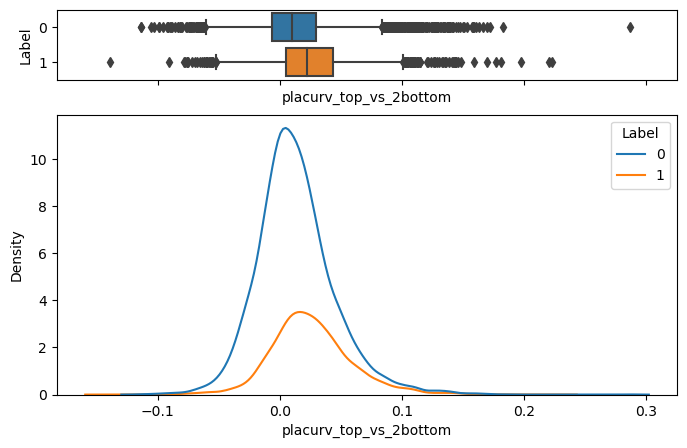

In [116]:
kde_label(df['placurv_top_vs_2bottom'])

In [117]:
convert_woe('placurv_top_vs_2bottom')

Information value: 0.16


,Bin,Total,Good,Bad,WOE,IV
placurv_top_vs_2bottom_range,,,,,,
"(0.0738, 0.116]",6,437,174,263,0.6705,0.0213
"(0.201, 0.244]",9,2,2,0,0.5518,0.0004
"(0.0313, 0.0738]",5,2404,849,1555,0.4914,0.0598
"(0.159, 0.201]",8,11,4,7,0.2852,0.0002
"(0.116, 0.159]",7,80,25,55,0.2751,0.0007
"(-0.0112, 0.0313]",4,6069,1403,4666,-0.1029,0.0058
"(0.244, 0.286]",10,1,0,1,-0.1158,0.0000
"(-0.0963, -0.0538]",2,111,24,87,-0.1716,0.0003
"(-0.139, -0.0963]",1,7,1,6,-0.2383,0.0001


Highest so far

## 2.7 Procurv

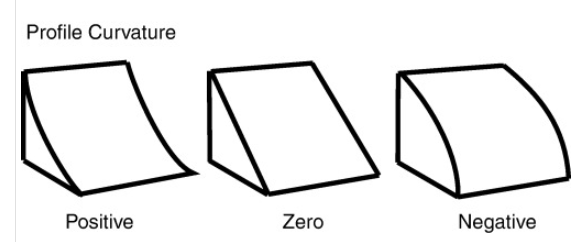

### Visualize

In [118]:
df[procurv_cols].head()

,procurv_1,procurv_2,procurv_3,procurv_4,procurv_5,procurv_6,procurv_7,procurv_8,procurv_9,procurv_10,procurv_11,procurv_12,procurv_13,procurv_14,procurv_15,procurv_16,procurv_17,procurv_18,procurv_19,procurv_20,procurv_21,procurv_22,procurv_23,procurv_24,procurv_25
0,0.0139,0.0147,0.0182,0.0184,0.0033,0.0020,0.0057,0.0022,-0.0038,-0.0033,-0.0021,0.0036,0.0020,-0.0123,-0.0272,0.0010,-0.0126,-0.0316,-0.0257,-0.0374,-0.0189,-0.0219,-0.0236,-0.0485,-0.0391
1,-0.0125,-0.0066,-0.0014,-0.0135,-0.0062,-0.0106,-0.0081,-0.0052,-0.0002,-0.0088,-0.0022,-0.0112,-0.0032,-0.0003,-0.0084,0.0006,0.0054,-0.0058,-0.0056,-0.0055,0.0194,0.0084,-0.0028,-0.0028,-0.0082
2,-0.0159,0.0005,0.0092,0.0098,0.0028,0.0058,0.0080,0.0141,0.0103,0.0031,0.0083,0.0187,0.0258,0.0211,0.0094,0.0468,0.0489,0.0378,0.0216,0.0223,0.0810,0.0609,0.0450,0.0419,0.0239
3,0.0189,0.0112,0.0090,0.0084,0.0111,0.0196,0.0111,0.0080,-0.0083,0.0058,0.0199,0.0090,0.0118,-0.0124,0.0096,0.0201,0.0159,0.0074,0.0002,-0.0007,0.0211,0.0144,0.0080,0.0017,0.0015
4,-0.0001,-0.0034,-0.0105,-0.0077,-0.0066,0.0095,-0.0007,0.0022,-0.0054,-0.0022,0.0037,-0.0109,-0.0121,-0.0101,-0.0102,-0.0128,-0.0087,-0.0056,-0.0099,-0.0155,-0.0078,-0.0140,-0.0201,-0.0103,-0.0227


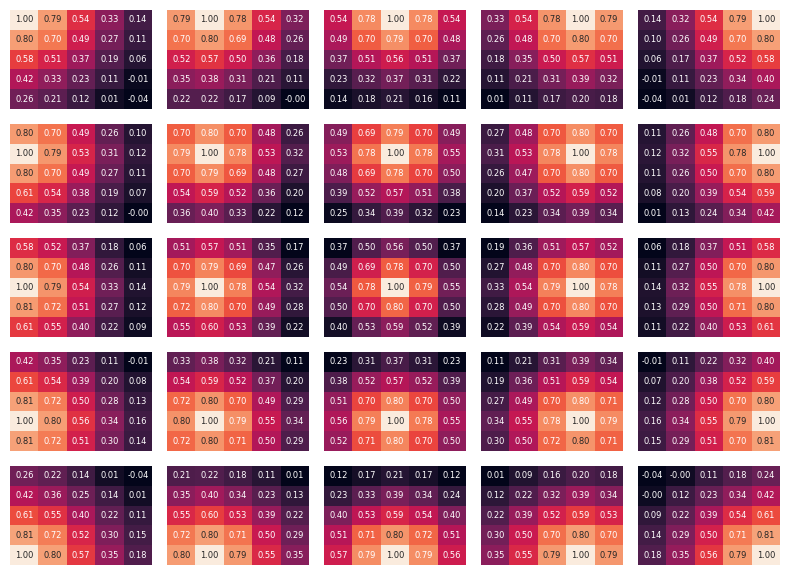

In [119]:
block_attribute(procurv_cols)

### Center cell

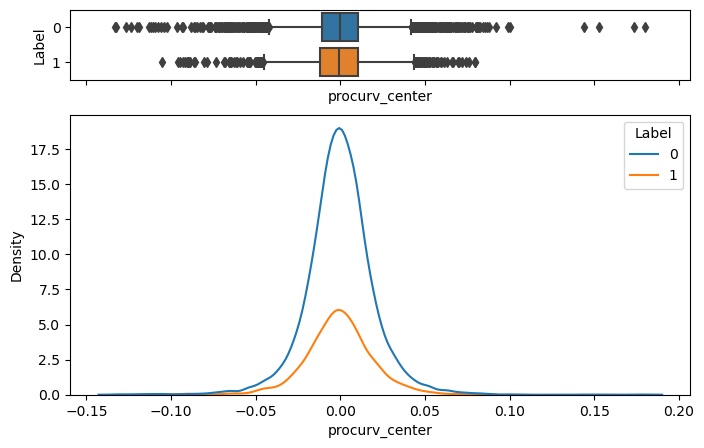

In [120]:
df['procurv_center'] = df.procurv_13
kde_label(df.procurv_center)

In [121]:
convert_woe('procurv_center', bins=[-1,-0.05,-0.025,0,0.025,0.05,1])

Information value: 0.00


,Bin,Total,Good,Bad,WOE,IV
procurv_center_range,,,,,,
"(-0.05, -0.025]",2,740,209,531,0.1639,0.0019
"(0.025, 0.05]",5,732,197,535,0.0981,0.0007
"(-0.025, 0.0]",3,4649,1175,3474,0.0145,0.0001
"(0.0, 0.025]",4,4450,1072,3378,-0.0490,0.0010
"(-1.0, -0.05]",1,149,33,116,-0.1473,0.0003
"(0.05, 1.0]",6,144,30,114,-0.2188,0.0006


### 1 cell below

In [122]:
attribute_1cell_below('procurv', procurv_cols)

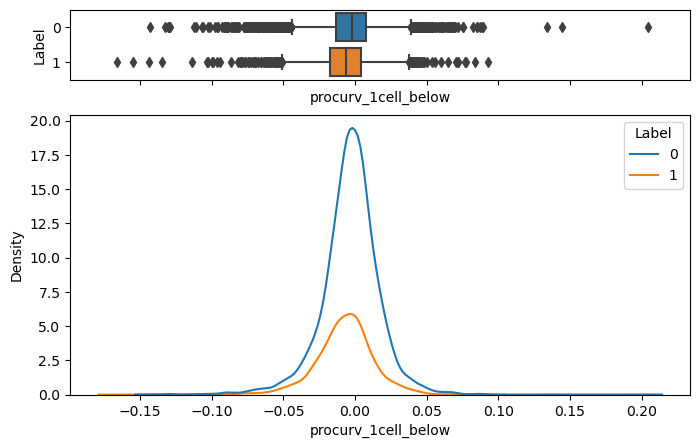

In [123]:
kde_label(df.procurv_1cell_below)

In [124]:
convert_woe('procurv_1cell_below', bins=[-1,-0.05,-0.025,0,0.025,0.05,1])

Information value: 0.04


,Bin,Total,Good,Bad,WOE,IV
procurv_1cell_below_range,,,,,,
"(-0.05, -0.025]",2,1023,338,685,0.3884,0.0157
"(-1.0, -0.05]",1,258,77,181,0.2346,0.0014
"(-0.025, 0.0]",3,5042,1343,3699,0.0853,0.0035
"(0.025, 0.05]",5,524,129,395,-0.0200,0.0000
"(0.0, 0.025]",4,3942,817,3125,-0.2422,0.0200
"(0.05, 1.0]",6,75,12,63,-0.4772,0.0016


Seems like - of cell below -> LS

### Center - cell below

In [125]:
df['procurv_center_below_diff'] = df.procurv_center - df.procurv_1cell_below

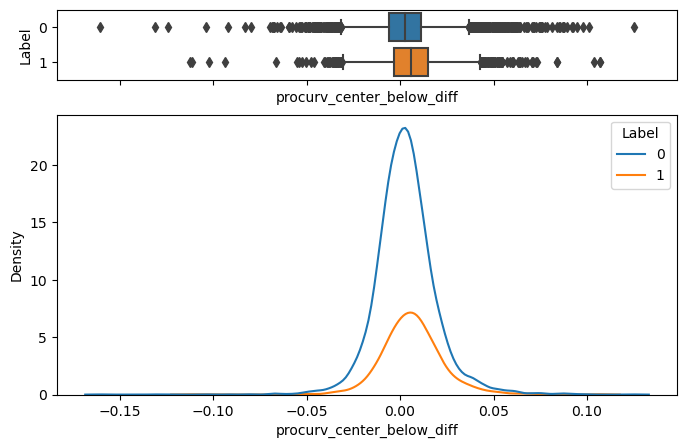

In [126]:
kde_label(df.procurv_center_below_diff)

In [127]:
convert_woe('procurv_center_below_diff', bins=[-1,-0.05,-0.025,0,0.025,0.05,1])

Information value: 0.04


,Bin,Total,Good,Bad,WOE,IV
procurv_center_below_diff_range,,,,,,
"(0.025, 0.05]",5,700,240,460,0.4417,0.0141
"(0.05, 1.0]",6,130,36,94,0.1284,0.0002
"(0.0, 0.025]",4,5642,1530,4112,0.1098,0.0064
"(-1.0, -0.05]",1,36,9,27,0.0000,0.0000
"(-0.025, 0.0]",3,4092,851,3241,-0.2379,0.0201
"(-0.05, -0.025]",2,264,50,214,-0.3398,0.0027


### 8 category +++--- with 2 cell below

In [128]:
# create 2cell attribute
attribute_2cell_below('procurv', procurv_cols)

In [129]:
# create signs column
df['procurv_signs_8'] = df.procurv_center.apply(int_sign) + df.procurv_1cell_below.apply(int_sign) + df.procurv_2cell_below.apply(int_sign)

In [130]:
df.groupby('procurv_signs_8').mean(numeric_only=True)['Label'].sort_values(ascending=False)

procurv_signs_8
+--   0.3262
---   0.2861
++-   0.2837
-+-   0.2515
+-+   0.1816
--+   0.1807
+++   0.1739
-++   0.1496
Name: Label, dtype: float64

In [131]:
convert_woe_cat('procurv_signs_8')

Information value: 0.11


,Total,Good,Bad,WOE,IV
procurv_signs_8,,,,,
+--,1493,487,1006,0.3706,0.0207
---,3775,1080,2695,0.1837,0.0123
++-,1297,368,929,0.1712,0.0037
-+-,513,129,384,0.0076,0.0000
+-+,380,69,311,-0.3943,0.0050
--+,675,122,553,-0.4053,0.0093
+++,2156,375,1781,-0.4567,0.0368
-++,575,86,489,-0.6248,0.0177


### top - 2 bottom

In [132]:
df['procurv_top_vs_2bottom'] = df.procurv_center - df.procurv_1cell_below - df.procurv_2cell_below

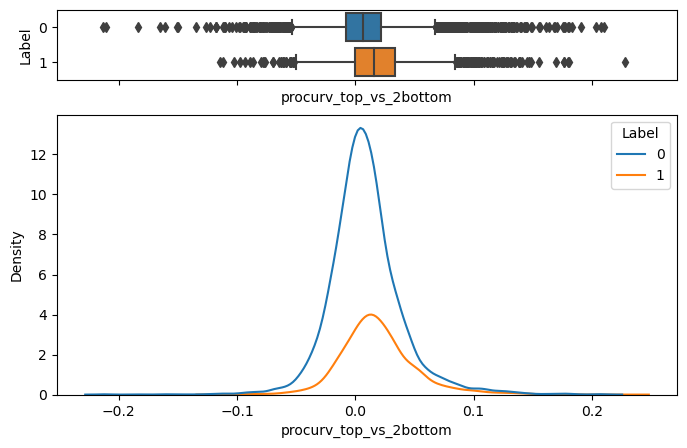

In [133]:
kde_label(df.procurv_top_vs_2bottom)

In [134]:
convert_woe('procurv_top_vs_2bottom')

Information value: 0.11


,Bin,Total,Good,Bad,WOE,IV
procurv_top_vs_2bottom_range,,,,,,
"(0.0518, 0.0959]",7,671,260,411,0.6315,0.0286
"(0.0959, 0.14]",8,160,58,102,0.5030,0.0044
"(0.14, 0.184]",9,32,11,21,0.3448,0.0005
"(0.00765, 0.0518]",6,4753,1399,3354,0.2237,0.0231
"(0.184, 0.228]",10,5,1,4,-0.0859,0.0000
"(-0.213, -0.169]",1,3,0,3,-0.3135,0.0001
"(-0.125, -0.0806]",3,39,7,32,-0.3202,0.0004
"(-0.0365, 0.00765]",5,4832,922,3910,-0.3453,0.0485
"(-0.0806, -0.0365]",4,363,58,305,-0.5419,0.0087


### Conclusion

- The bottom 2: -, especially the 2cell below, leads to more LS

- Reason? the negative (protruding) of the 2 cells below?

## 2.8 lsfactor

### Visualize

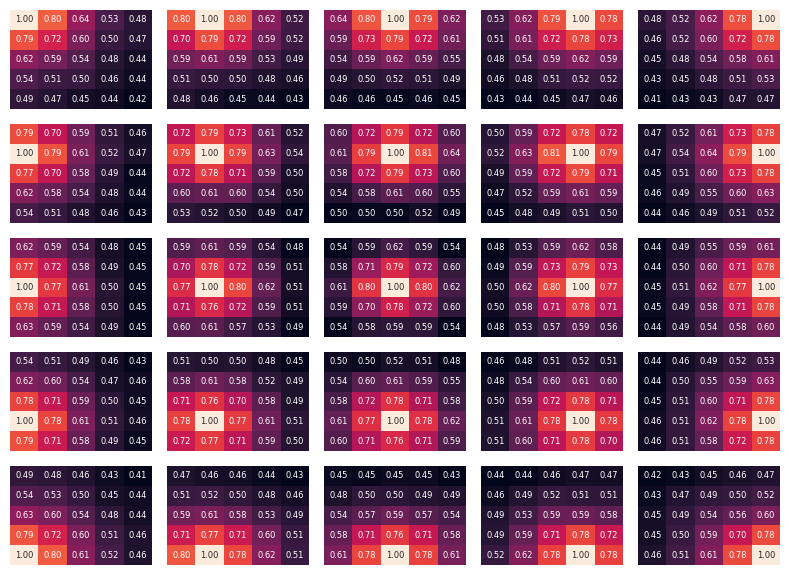

In [135]:
block_attribute(lsfactor_cols)

In [136]:
df[lsfactor_cols].describe().T

,count,mean,std,min,25%,50%,75%,max
lsfactor_1,"10,864.0000",7.4806,3.6262,0.0000,5.0755,7.3305,9.5683,42.1529
lsfactor_2,"10,864.0000",7.6245,3.6500,0.0000,5.2101,7.4357,9.7602,47.6347
lsfactor_3,"10,864.0000",7.7635,3.7150,0.0000,5.3257,7.5532,9.9216,48.8213
lsfactor_4,"10,864.0000",7.7691,3.7522,0.0000,5.2747,7.6218,9.9299,56.6308
lsfactor_5,"10,864.0000",7.6819,3.7533,0.0000,5.2005,7.5023,9.8029,51.5610
lsfactor_6,"10,864.0000",7.5465,3.6643,0.0000,5.1450,7.3606,9.6086,55.0831
lsfactor_7,"10,864.0000",7.7252,3.6202,0.0000,5.2887,7.5815,9.8422,45.9798
lsfactor_8,"10,864.0000",7.9512,3.7469,0.0000,5.4348,7.7927,10.1860,38.8091
lsfactor_9,"10,864.0000",7.9707,3.8193,0.0000,5.4491,7.7885,10.1922,56.6244
lsfactor_10,"10,864.0000",7.7559,3.7247,0.0000,5.3086,7.6048,9.9023,46.4747


### Center cell lsfactor

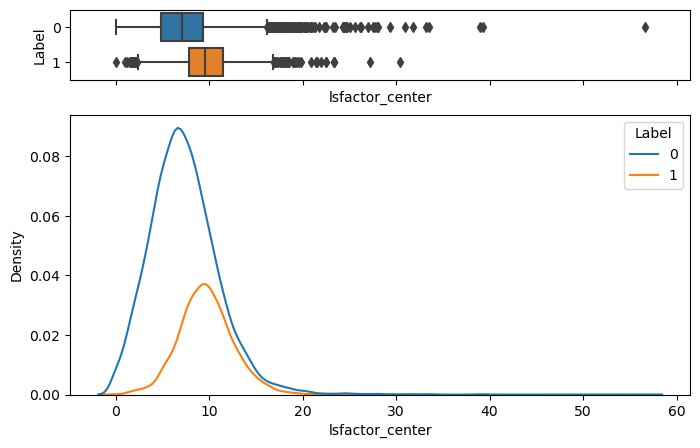

In [137]:
df['lsfactor_center'] = df.lsfactor_13
kde_label(df.lsfactor_center)

LS sample has higher lsfactor than non-LS

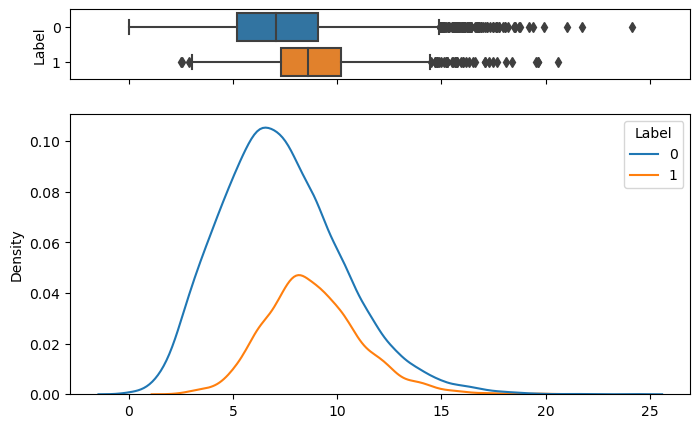

In [138]:
kde_label(df[lsfactor_cols].mean(axis=1))

Same apply for all cells

In [139]:
# center cell woe
convert_woe('lsfactor_center')

Information value: 0.54


,Bin,Total,Good,Bad,WOE,IV
lsfactor_center_range,,,,,,
"(11.322, 16.983]",3,1558,681,877,0.8404,0.1203
"(5.661, 11.322]",2,6220,1800,4420,0.1999,0.0240
"(16.983, 22.644]",4,125,32,93,0.0292,0.0000
"(39.626, 45.287]",[],0,0,0,0.0000,0.0000
"(45.287, 50.948]",[],0,0,0,0.0000,0.0000
"(50.948, 56.609]",10,1,0,1,-0.1158,0.0000
"(28.304, 33.965]",6,6,1,5,-0.1650,0.0000
"(33.965, 39.626]",7,2,0,2,-0.2195,0.0001
"(22.644, 28.304]",5,21,4,17,-0.2217,0.0001


In [140]:
# mean all cells woe

df['lsfactor_mean'] = df[lsfactor_cols].mean(axis=1)

convert_woe('lsfactor_mean')

Information value: 0.56


,Bin,Total,Good,Bad,WOE,IV
lsfactor_mean_range,,,,,,
"(19.305, 21.718]",9,7,4,3,0.5918,0.0007
"(9.653, 12.066]",5,1779,649,1130,0.5411,0.0543
"(7.24, 9.653]",4,3397,1177,2220,0.4627,0.0745
"(12.066, 14.479]",6,560,191,369,0.4324,0.0108
"(16.892, 19.305]",8,31,7,24,-0.0980,0.0000
"(14.479, 16.892]",7,137,31,106,-0.1209,0.0002
"(21.718, 24.131]",10,2,0,2,-0.2195,0.0001
"(4.827, 7.24]",3,3227,592,2635,-0.3930,0.0414
"(2.414, 4.827]",2,1545,65,1480,-1.9914,0.3141


### How about cell below

In [141]:
attribute_1cell_below('lsfactor', lsfactor_cols)

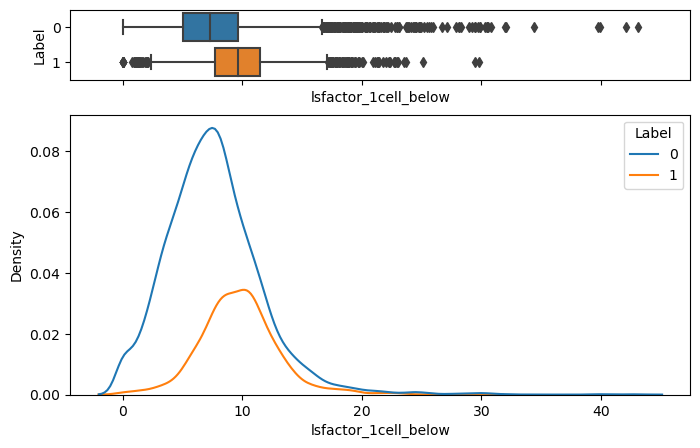

In [142]:
kde_label(df.lsfactor_1cell_below)

In [143]:
convert_woe('lsfactor_1cell_below')

Information value: 0.48


,Bin,Total,Good,Bad,WOE,IV
lsfactor_1cell_below_range,,,,,,
"(8.626, 12.939]",3,3566,1379,2187,0.6357,0.1521
"(12.939, 17.252]",4,745,275,470,0.5553,0.0242
"(17.252, 21.565]",5,154,55,99,0.4799,0.0039
"(21.565, 25.878]",6,46,13,33,0.1361,0.0001
"(34.504, 38.817]",[],0,0,0,0.0000,0.0000
"(4.313, 8.626]",2,4669,891,3778,-0.3451,0.0468
"(38.817, 43.13]",10,4,0,4,-0.3994,0.0002
"(25.878, 30.191]",7,16,2,14,-0.4482,0.0004
"(30.191, 34.504]",8,8,0,8,-0.6840,0.0007


### Sum of cell center and below

In [144]:
df['lsfactor_sum_center_1below'] = df.lsfactor_13 + df.lsfactor_1cell_below

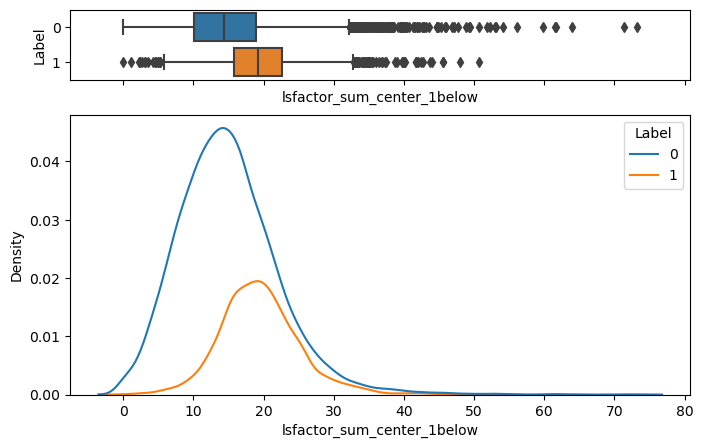

In [145]:
kde_label(df.lsfactor_sum_center_1below)

In [146]:
convert_woe('lsfactor_sum_center_1below')

Information value: 0.69


,Bin,Total,Good,Bad,WOE,IV
lsfactor_sum_center_1below_range,,,,,,
"(21.977, 29.302]",4,1514,651,863,0.8115,0.1086
"(29.302, 36.628]",5,292,109,183,0.5615,0.0099
"(14.651, 21.977]",3,4281,1484,2797,0.4637,0.0942
"(36.628, 43.953]",6,70,18,52,0.0327,0.0000
"(65.929, 73.255]",10,2,0,2,-0.2195,0.0001
"(43.953, 51.279]",7,21,4,17,-0.2217,0.0001
"(58.604, 65.929]",9,4,0,4,-0.3994,0.0002
"(51.279, 58.604]",8,6,0,6,-0.5518,0.0004
"(7.326, 14.651]",2,3608,415,3193,-0.9379,0.2242


Coarse finetuning

In [147]:
# 1, 2, 3, 4, 5, [6,7,8,9,10]
convert_woe('lsfactor_sum_center_1below', bins = [-1, 7.326, 14.651, 21.977, 29.302, 36.628, 100])

Information value: 0.69


,Bin,Total,Good,Bad,WOE,IV
lsfactor_sum_center_1below_range,,,,,,
"(21.977, 29.302]",4,1514,651,863,0.8115,0.1086
"(29.302, 36.628]",5,292,109,183,0.5615,0.0099
"(14.651, 21.977]",3,4281,1484,2797,0.4637,0.0942
"(36.628, 100.0]",6,103,22,81,-0.1842,0.0003
"(7.326, 14.651]",2,3608,415,3193,-0.9379,0.2242
"(-1.0, 7.326]",1,1066,35,1031,-2.2175,0.2520


Higher lsfactor of sum of center+below, higher chance of LS.

### Sum 3 cells

In [148]:
attribute_2cell_below('lsfactor', lsfactor_cols)

In [149]:
df['lsfactor_sum_center_2below'] = df.lsfactor_center + df.lsfactor_1cell_below + df.lsfactor_2cell_below

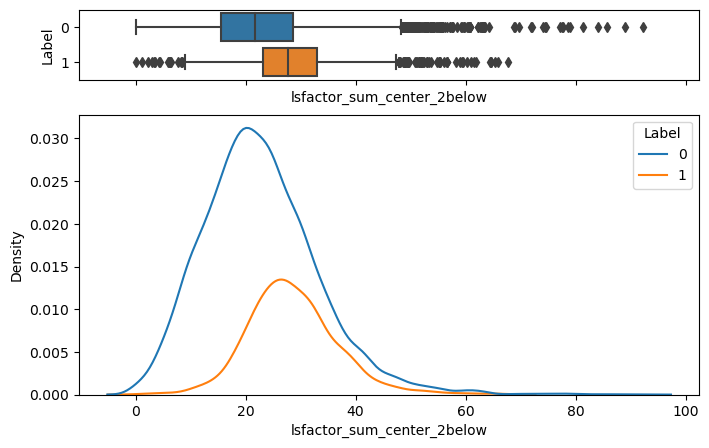

In [150]:
kde_label(df['lsfactor_sum_center_2below'])

In [151]:
convert_woe('lsfactor_sum_center_2below')

Information value: 0.58


,Bin,Total,Good,Bad,WOE,IV
lsfactor_sum_center_2below_range,,,,,,
"(36.875, 46.094]",5,780,308,472,0.6634,0.0368
"(27.656, 36.875]",4,2610,995,1615,0.6120,0.1029
"(64.531, 73.749]",8,10,5,5,0.5656,0.0007
"(46.094, 55.312]",6,193,57,136,0.2174,0.0009
"(18.438, 27.656]",3,4045,1111,2934,0.1272,0.0062
"(55.312, 64.531]",7,63,14,49,-0.1307,0.0001
"(82.968, 92.186]",10,4,0,4,-0.3994,0.0002
"(73.749, 82.968]",9,9,0,9,-0.7441,0.0008
"(9.219, 18.438]",2,2487,207,2280,-1.2911,0.2629


Only the cell directly below it matters?

### Does the cell above it?

In [152]:
attribute_1cell_above('lsfactor', lsfactor_cols)

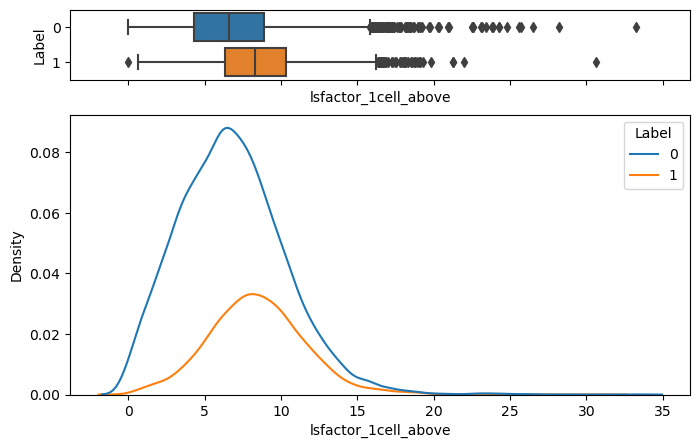

In [153]:
kde_label(df.lsfactor_1cell_above)

In [154]:
convert_woe('lsfactor_1cell_above')

Information value: 0.28


,Bin,Total,Good,Bad,WOE,IV
lsfactor_1cell_above_range,,,,,,
"(9.97, 13.293]",4,1695,629,1066,0.5678,0.0572
"(16.616, 19.939]",6,78,30,48,0.5585,0.0029
"(13.293, 16.616]",5,362,127,235,0.4703,0.0084
"(6.646, 9.97]",3,3790,1147,2643,0.2631,0.0258
"(29.909, 33.232]",10,2,1,1,0.1977,0.0000
"(19.939, 23.262]",7,12,3,9,0.0000,0.0000
"(26.585, 29.909]",9,1,0,1,-0.1158,0.0000
"(3.323, 6.646]",2,3440,654,2786,-0.3494,0.0353
"(23.262, 26.585]",8,9,0,9,-0.7441,0.0008


### Sum center + 1bove

In [155]:
df['lsfactor_sum_center_above'] = df.lsfactor_center + df.lsfactor_1cell_above
convert_woe('lsfactor_sum_center_above')

Information value: 0.52


,Bin,Total,Good,Bad,WOE,IV
lsfactor_sum_center_above_range,,,,,,
"(19.943, 26.59]",4,1861,772,1089,0.7506,0.1130
"(26.59, 33.238]",5,424,159,265,0.5744,0.0149
"(13.296, 19.943]",3,4037,1246,2791,0.2914,0.0339
"(33.238, 39.885]",6,69,20,49,0.1760,0.0002
"(39.885, 46.533]",7,22,6,16,0.0796,0.0000
"(53.18, 59.828]",[],0,0,0,0.0000,0.0000
"(59.828, 66.475]",10,5,1,4,-0.0859,0.0000
"(46.533, 53.18]",8,6,0,6,-0.5518,0.0004
"(6.648, 13.296]",2,3392,471,2921,-0.7232,0.1339


### Sum 3 center (center + 1above+1below)

In [156]:
df['lsfactor_sum_3center'] = df.lsfactor_center + df.lsfactor_1cell_below + df.lsfactor_1cell_above

In [157]:
convert_woe('lsfactor_sum_3center')

Information value: 0.62


,Bin,Total,Good,Bad,WOE,IV
lsfactor_sum_3center_range,,,,,,
"(28.434, 37.912]",4,2292,925,1367,0.7050,0.1218
"(37.912, 47.39]",5,575,231,344,0.6887,0.0295
"(47.39, 56.868]",6,121,36,85,0.2207,0.0006
"(18.957, 28.434]",3,4098,1198,2900,0.2140,0.0182
"(56.868, 66.346]",7,27,8,19,0.1690,0.0001
"(66.346, 75.823]",8,13,4,9,0.1612,0.0001
"(85.301, 94.779]",10,2,0,2,-0.2195,0.0001
"(75.823, 85.301]",9,5,0,5,-0.4785,0.0003
"(9.479, 18.957]",2,2949,294,2655,-1.0959,0.2385


In [158]:
# 1,2 3,4,5, [6,7,8,9,10]
convert_woe('lsfactor_sum_3center', bins=[-1, 9.479, 18.957, 28.434, 37.912, 100])

Information value: 0.61


,Bin,Total,Good,Bad,WOE,IV
lsfactor_sum_3center_range,,,,,,
"(28.434, 37.912]",4,2292,925,1367,0.7050,0.1218
"(37.912, 100.0]",5,743,279,464,0.5822,0.0267
"(18.957, 28.434]",3,4098,1198,2900,0.2140,0.0182
"(9.479, 18.957]",2,2949,294,2655,-1.0959,0.2385
"(-1.0, 9.479]",1,782,20,762,-2.4249,0.2089


### Conclusion

- Sum of center+1below: most important

## 2.9 TWI
https://en.wikipedia.org/wiki/Topographic_wetness_index

### Visualize

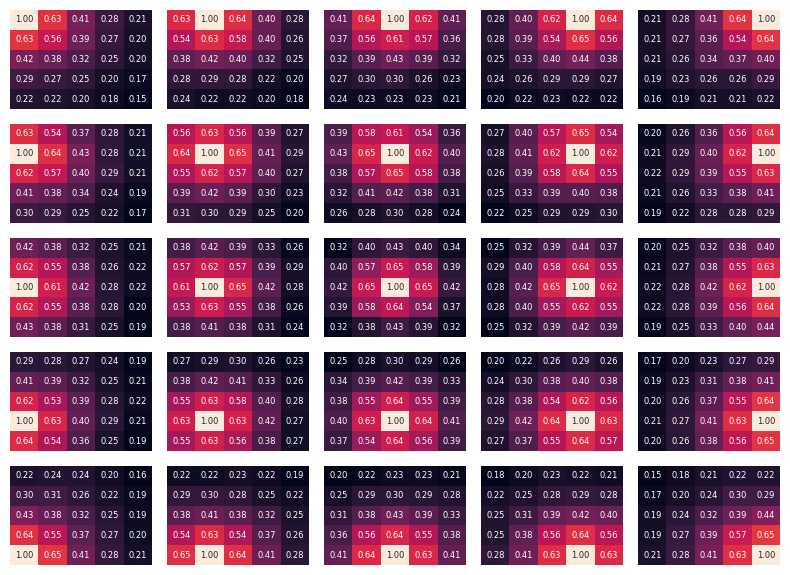

In [159]:
block_attribute(twi_cols)

In [160]:
df[twi_cols].describe().T

,count,mean,std,min,25%,50%,75%,max
twi_1,"10,864.0000",4.5377,1.6061,1.2745,3.5512,4.2020,5.1009,19.2624
twi_2,"10,864.0000",4.5225,1.5452,1.0100,3.5662,4.2128,5.0890,18.1263
twi_3,"10,864.0000",4.5355,1.5704,1.4513,3.5504,4.2269,5.0986,19.7143
twi_4,"10,864.0000",4.5339,1.5333,1.1956,3.5660,4.2329,5.1021,19.7797
twi_5,"10,864.0000",4.5742,1.5763,1.2318,3.5838,4.2615,5.1571,17.8406
twi_6,"10,864.0000",4.5242,1.5919,1.2671,3.5454,4.2024,5.0742,18.3439
twi_7,"10,864.0000",4.4967,1.5162,1.2386,3.5421,4.2006,5.0672,18.0223
twi_8,"10,864.0000",4.4963,1.5252,1.2385,3.5388,4.1894,5.0675,18.7118
twi_9,"10,864.0000",4.5272,1.5613,1.4030,3.5538,4.2178,5.1033,17.5571
twi_10,"10,864.0000",4.5603,1.5819,1.2452,3.5746,4.2417,5.1407,19.2729


### Center cell

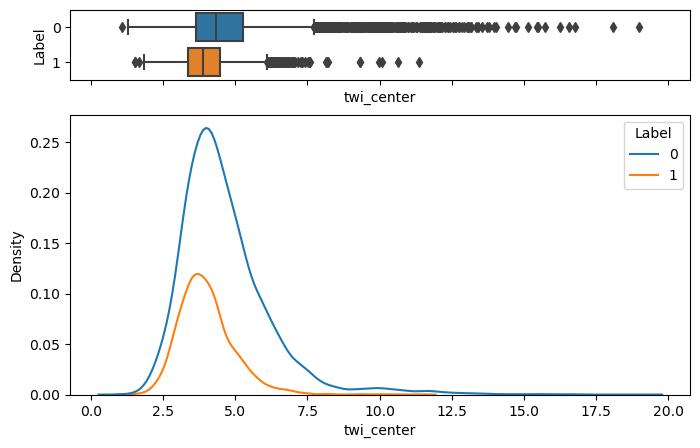

In [161]:
df['twi_center'] = df.twi_13

kde_label(df.twi_center)

LS sample have lower twi?

### How does TWI relate to slope, procurv, placurv,...

<AxesSubplot: >

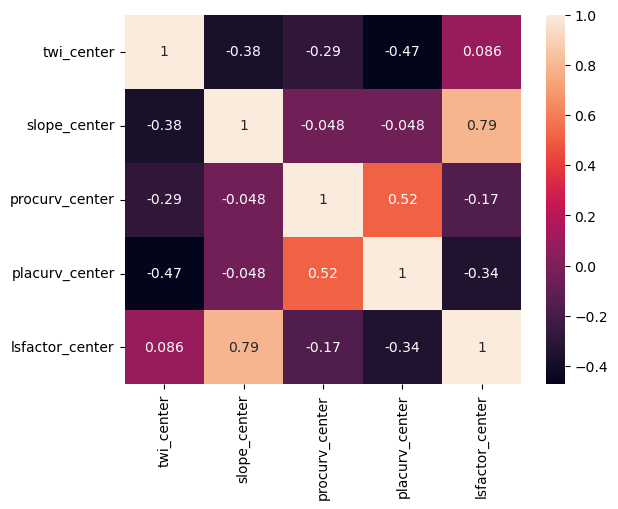

In [162]:
sns.heatmap(df[['twi_center','slope_center', 'procurv_center', 'placurv_center', 'lsfactor_center']].corr(), annot=True)

### Mean 25 cell / 9cell

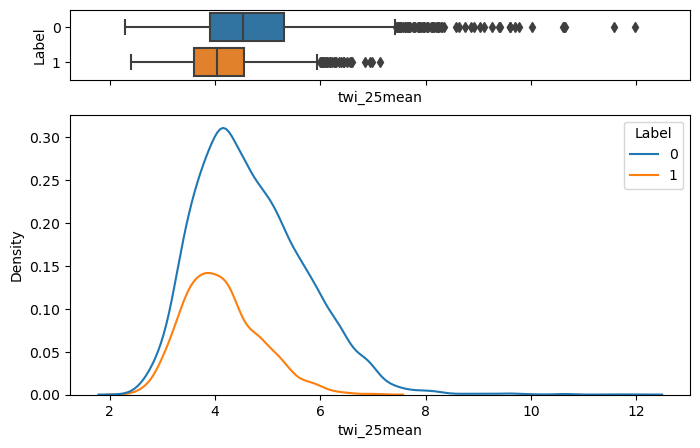

In [163]:
df['twi_25mean'] = df[twi_cols].mean(axis=1)
kde_label(df.twi_25mean)

In [164]:
convert_woe('twi_25mean')

Information value: 0.40


,Bin,Total,Good,Bad,WOE,IV
twi_25mean_range,,,,,,
"(2.289, 3.267]",1,671,270,401,0.6930,0.0348
"(3.267, 4.235]",2,4105,1385,2720,0.4226,0.0744
"(4.235, 5.203]",3,3554,832,2722,-0.0864,0.0024
"(11.012, 11.98]",10,2,0,2,-0.2195,0.0001
"(10.044, 11.012]",9,3,0,3,-0.3135,0.0001
"(9.075, 10.044]",8,10,0,10,-0.8008,0.0010
"(5.203, 6.171]",4,1785,210,1575,-0.9086,0.1054
"(8.107, 9.075]",7,19,0,19,-1.2035,0.0028
"(6.171, 7.139]",5,632,19,613,-2.2549,0.1539


Finetuning

In [165]:
convert_woe('twi_25mean', bins = [0, 3.267, 4.235, 5.203, 6.171,12])

Information value: 0.42


,Bin,Total,Good,Bad,WOE,IV
twi_25mean_range,,,,,,
"(0.0, 3.267]",1,670,270,400,0.6954,0.0350
"(3.267, 4.235]",2,4106,1385,2721,0.4223,0.0743
"(4.235, 5.203]",3,3554,832,2722,-0.0864,0.0024
"(5.203, 6.171]",4,1785,210,1575,-0.9086,0.1054
"(6.171, 12.0]",5,749,19,730,-2.4275,0.2005


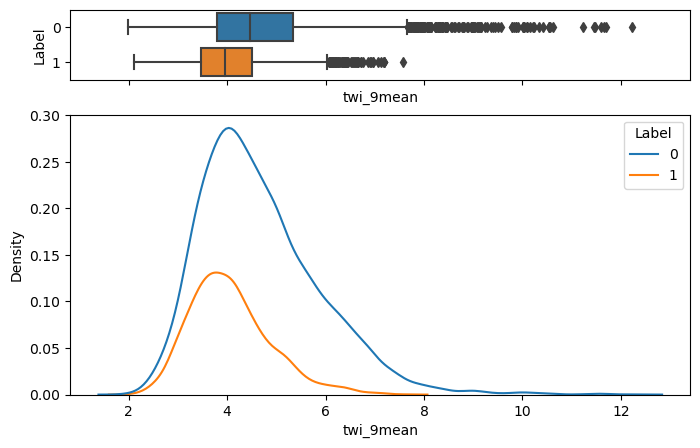

In [166]:
twi_9center_cols = 'twi_'+pd.Series([7,8,9,12,13,14,17,18,19]).astype('str')

df['twi_9mean'] = df[twi_9center_cols].mean(axis=1)
kde_label(df['twi_9mean'])

In [167]:
convert_woe('twi_9mean')

Information value: 0.32


,Bin,Total,Good,Bad,WOE,IV
twi_9mean_range,,,,,,
"(1.978, 3.013]",1,530,204,326,0.6184,0.0217
"(3.013, 4.038]",2,3775,1273,2502,0.4218,0.0682
"(4.038, 5.063]",3,3676,920,2756,0.0014,0.0000
"(11.212, 12.236]",10,7,0,7,-0.6201,0.0005
"(5.063, 6.087]",4,1782,258,1524,-0.6724,0.0619
"(10.187, 11.212]",9,8,0,8,-0.6840,0.0007
"(9.162, 10.187]",8,21,0,21,-1.2746,0.0033
"(6.087, 7.112]",5,798,56,742,-1.4489,0.1021
"(8.137, 9.162]",7,56,0,56,-2.0634,0.0142


In [168]:
convert_woe('twi_9mean', bins = [0,3.013, 4.038, 5.063, 6.087, 13])

Information value: 0.33


,Bin,Total,Good,Bad,WOE,IV
twi_9mean_range,,,,,,
"(0.0, 3.013]",1,530,204,326,0.6184,0.0217
"(3.013, 4.038]",2,3776,1273,2503,0.4214,0.0681
"(4.038, 5.063]",3,3676,920,2756,0.0014,0.0000
"(5.063, 6.087]",4,1779,257,1522,-0.6749,0.0622
"(6.087, 13.0]",5,1103,62,1041,-1.6871,0.1770


Conclusion:
- 25 cells mean provide more information than 9 cells

### sum of 1 cell below?

In [169]:
attribute_1cell_below('twi', twi_cols)

In [170]:
df['twi_sum_center_1below'] = df.twi_center + df.twi_1cell_below

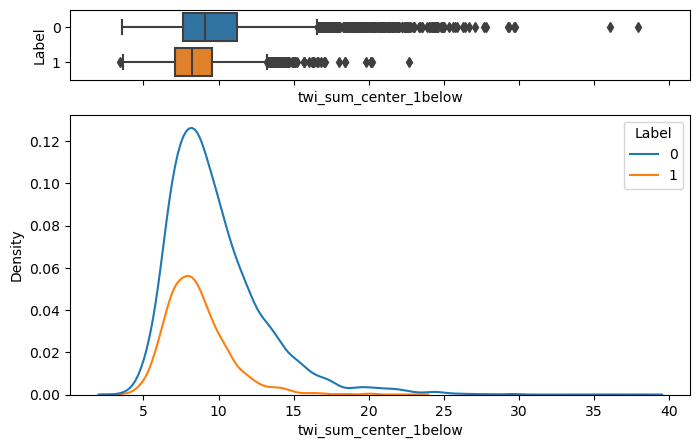

In [171]:
kde_label(df.twi_sum_center_1below)

In [172]:
convert_woe('twi_sum_center_1below')

Information value: 0.20


,Bin,Total,Good,Bad,WOE,IV
twi_sum_center_1below_range,,,,,,
"(3.389, 6.877]",1,1642,534,1108,0.3664,0.0222
"(6.877, 10.331]",2,6083,1744,4339,0.1868,0.0205
"(31.053, 34.506]",[],0,0,0,0.0000,0.0000
"(34.506, 37.96]",10,2,0,2,-0.2195,0.0001
"(10.331, 13.785]",3,2257,375,1882,-0.5117,0.0475
"(27.599, 31.053]",8,6,0,6,-0.5518,0.0004
"(13.785, 17.238]",4,625,54,571,-1.2249,0.0615
"(24.145, 27.599]",7,24,0,24,-1.3726,0.0040
"(17.238, 20.692]",5,153,8,145,-1.5611,0.0232


### Conclusion:
- Most informative is mean 25 cell

## 2.10 Geology

### Visualize

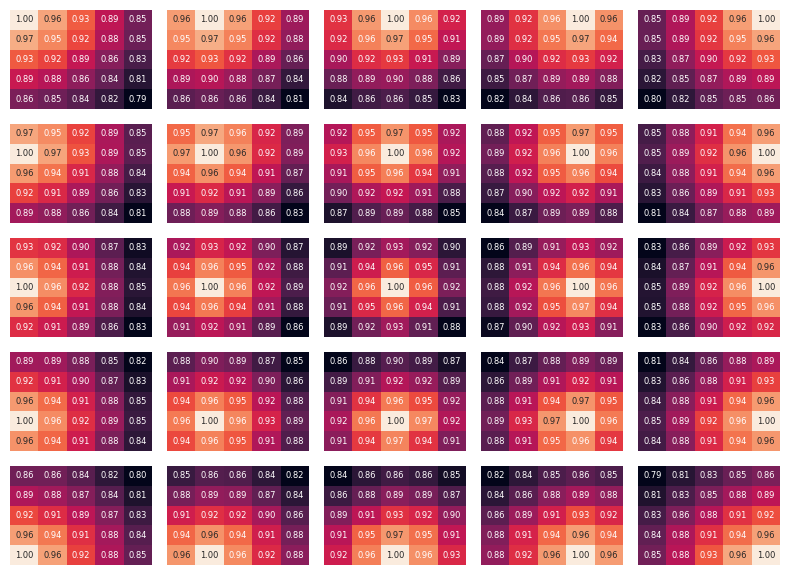

In [173]:
block_attribute(geology_cols)

In [174]:
df[geology_cols].describe().T

,count,mean,std,min,25%,50%,75%,max
geology_1,"10,864.0000",3.0123,1.1451,1.0000,2.0000,3.0000,3.0000,7.0000
geology_2,"10,864.0000",3.0088,1.1433,1.0000,2.0000,3.0000,3.0000,7.0000
geology_3,"10,864.0000",3.0087,1.1413,1.0000,2.0000,3.0000,3.0000,7.0000
geology_4,"10,864.0000",3.0114,1.1440,1.0000,2.0000,3.0000,3.0000,7.0000
geology_5,"10,864.0000",3.0110,1.1441,1.0000,2.0000,3.0000,3.0000,7.0000
geology_6,"10,864.0000",3.0096,1.1422,1.0000,2.0000,3.0000,3.0000,7.0000
geology_7,"10,864.0000",3.0060,1.1402,1.0000,2.0000,3.0000,3.0000,7.0000
geology_8,"10,864.0000",3.0064,1.1397,1.0000,2.0000,3.0000,3.0000,7.0000
geology_9,"10,864.0000",3.0110,1.1418,1.0000,2.0000,3.0000,3.0000,7.0000
geology_10,"10,864.0000",3.0118,1.1408,1.0000,2.0000,3.0000,3.0000,7.0000


There are 7 type of geo. This is actually a categorical columns

In [175]:
# convert to str
df[geology_cols] = df[geology_cols].astype('str')

### Center cell

<AxesSubplot: xlabel='geology_center', ylabel='count'>

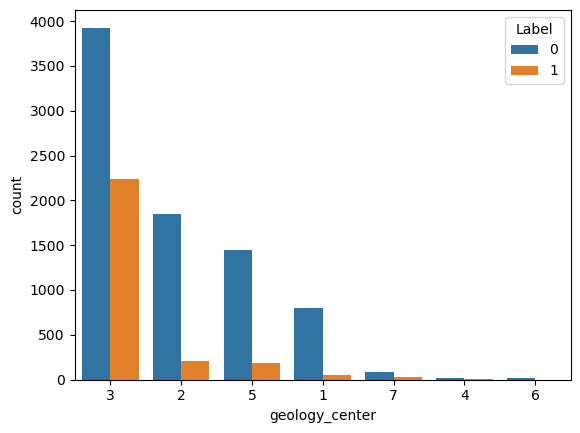

In [176]:
df['geology_center'] = df.geology_13

sns.countplot(df, x='geology_center', hue='Label')

Geo 3 seems to have the most sample and highest rate of LS as well

In [177]:
df[['geology_center', 'Label']].groupby('geology_center').aggregate(func=['count', 'mean']).sort_values(('Label', 'mean'), ascending=False)

Label       
               count   mean
geology_center             
3               6162 0.3625
7                117 0.2906
5               1639 0.1153
2               2052 0.0994
1                853 0.0633
4                 21 0.0476
6                 20 0.0000

3,7 tops the chart. 

In [178]:
convert_woe_cat('geology_center')

Information value: 0.58


,Total,Good,Bad,WOE,IV
geology_center,,,,,
3,6162,2234,3928,0.5334,0.1816
7,117,34,83,0.1893,0.0004
4,21,1,20,-0.9262,0.0019
5,1639,189,1450,-0.9303,0.1008
2,2052,204,1848,-1.0963,0.1663
6,20,0,20,-1.2397,0.0030
1,853,54,799,-1.5568,0.1217


### Would the mode of 9 cell matter more?

In [179]:
geology_9center_cols = 'geology_'+pd.Series([7,8,9,12,13,14,17,18,19]).astype('str')

df['geology_9mode'] = df[geology_9center_cols].mode(axis=1)[0]

convert_woe_cat('geology_9mode')

Information value: 0.58


,Total,Good,Bad,WOE,IV
geology_9mode,,,,,
3,6169,2236,3933,0.5330,0.1815
7,117,34,83,0.1893,0.0004
4,21,1,20,-0.9262,0.0019
5,1631,187,1444,-0.9367,0.1015
2,2053,204,1849,-1.0968,0.1665
6,20,0,20,-1.2397,0.0030
1,853,54,799,-1.5568,0.1217


Almost identical to center cell.

### Would mix type result more?

In [180]:
df['geology_counts'] = df[geology_cols].nunique(axis=1)

<AxesSubplot: xlabel='geology_counts', ylabel='count'>

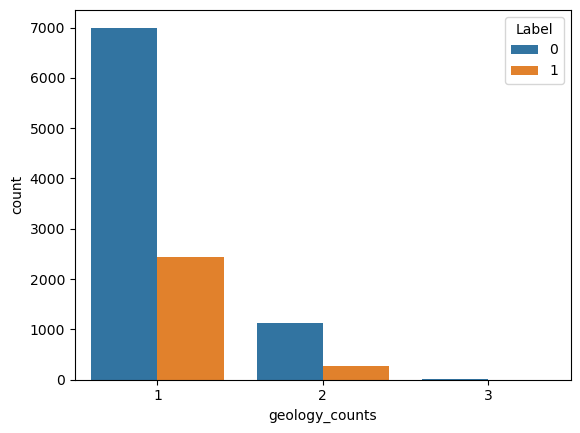

In [181]:
sns.countplot(x= df['geology_counts'], hue=df.Label)

Majority of them has only 1 type or 2 type. Have zero information

In [182]:
convert_woe('geology_counts', bins=[0,1,2,3])

Information value: 0.01


,Bin,Total,Good,Bad,WOE,IV
geology_counts_range,,,,,,
"(0, 1]",1,9439,2437,7002,0.0431,0.0016
"(1, 2]",2,1410,279,1131,-0.2985,0.0108
"(2, 3]",3,15,0,15,-1.0441,0.0019


### How about 'sort' the type from high -> low then calculate the mean 25?

In [183]:
geo_backup = df[geology_cols].copy()

In [184]:
# restore
# df[geology_cols] = geo_backup.copy()

In [185]:
# Highest: 3,7
# Mid: 5,2
# Lowest: 1,4,6

geo_type_sorted = {
    '1':1,
    '2':2,
    '3':3,
    '4':1,
    '5':2,
    '6':1,
    '7':3,
}

# map all cell to 'sorted' values
df[geology_cols] = df[geology_cols].apply(lambda x: x.map(geo_type_sorted))

# map the center cell again
df['geology_center'] = df.geology_13

Mean 25

In [186]:
# geology_9center_cols = 'geology_'+pd.Series([7,8,9,12,13,14,17,18,19]).astype('str')

df['geology_mean'] = df[geology_cols].mean(axis=1)

convert_woe('geology_mean', bins=10)

Information value: 0.61


,Bin,Total,Good,Bad,WOE,IV
geology_mean_range,,,,,,
"(2.8, 3.0]",10,5980,2188,3792,0.5478,0.1864
"(2.4, 2.6]",8,154,47,107,0.2587,0.0011
"(2.6, 2.8]",9,199,51,148,0.0315,0.0000
"(1.4, 1.6]",3,18,3,15,-0.3000,0.0002
"(2.2, 2.4]",7,149,28,121,-0.3376,0.0015
"(2.0, 2.2]",6,207,38,169,-0.3718,0.0025
"(1.2, 1.4]",2,20,1,19,-0.8900,0.0017
"(1.6, 1.8]",4,13,0,13,-0.9538,0.0015
"(1.8, 2.0]",5,3259,307,2952,-1.1587,0.2888


Mean 25 of 'sorted' type has slightly more info

**Mean 9**

In [187]:
geology_9center_cols = 'geology_'+pd.Series([7,8,9,12,13,14,17,18,19]).astype('str')

df['geology_mean9'] = df[geology_9center_cols].mean(axis=1)

convert_woe('geology_mean9', bins=5)

Information value: 0.60


,Bin,Total,Good,Bad,WOE,IV
geology_mean9_range,,,,,,
"(2.6, 3.0]",5,6241,2256,3985,0.5288,0.1806
"(2.2, 2.6]",4,182,52,130,0.1724,0.0006
"(1.4, 1.8]",2,19,3,16,-0.3423,0.0003
"(1.8, 2.2]",3,3533,351,3182,-1.1007,0.2876
"(0.998, 1.4]",1,889,54,835,-1.6005,0.1322


## 2.11 sdoif

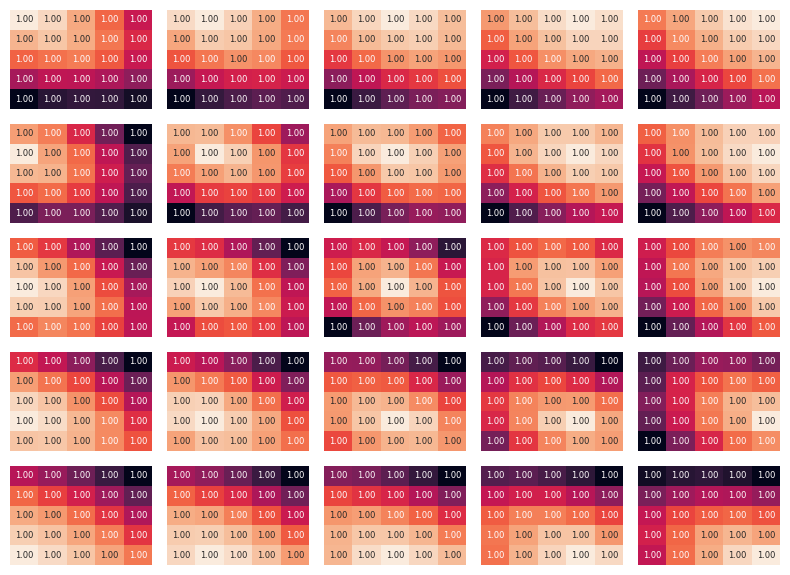

In [188]:
block_attribute(sdoif_cols)

Very high correlation. Only need to keep the center cell

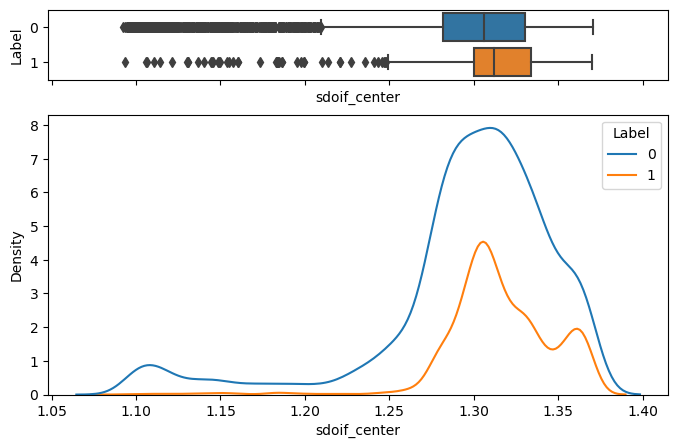

In [189]:
df['sdoif_center'] = df.sdoif_13
kde_label(df.sdoif_center)

Seems like higher range of sdoif leads to slightly more LS but that's it.

In [190]:
convert_woe('sdoif_center')

Information value: 0.33


,Bin,Total,Good,Bad,WOE,IV
sdoif_center_range,,,,,,
"(1.287, 1.315]",8,3558,1165,2393,0.3777,0.0511
"(1.343, 1.371]",10,1735,532,1203,0.2810,0.0136
"(1.315, 1.343]",9,2781,705,2076,0.0185,0.0001
"(1.259, 1.287]",7,1606,258,1348,-0.5504,0.0388
"(1.176, 1.204]",4,114,13,101,-0.8394,0.0064
"(1.148, 1.176]",3,111,9,102,-1.1423,0.0105
"(1.12, 1.148]",2,146,9,137,-1.4182,0.0191
"(1.204, 1.232]",5,129,5,124,-1.7420,0.0233
"(1.232, 1.259]",6,406,15,391,-2.0163,0.0856


## 2.12 Multivariate

In [191]:
# backup
df_backup = df.copy()

In [192]:
# restore? 
# df = df_backup.copy()
df = df.loc[:, 'Label':]

In [193]:
df.head()

,Label,aspect_NSEW,ID_1cell_below,ID_2cell_below,ID_1cell_above,elevation_center,elevation_minmax_difference,elevation_difference_pct,elevation_total_difference,elevation_1cell_below,elevation_1below_diff,elevation_1cell_above,elevation_1above_center_diff,slope_center,slope_minmax_difference,slope_difference_pct,slope_1cell_below,slope_1cell_below_diff,aspect_span,aspect_sum_span_9cells,placurv_center,placurv_1cell_below,placurv_sum_center_below,placurv_center_below_diff,placurv_signs,placurv_2cell_below,placurv_signs_8,placurv_top_vs_2bottom,procurv_center,procurv_1cell_below,procurv_center_below_diff,procurv_2cell_below,procurv_signs_8,procurv_top_vs_2bottom,lsfactor_center,lsfactor_mean,lsfactor_1cell_below,lsfactor_sum_center_1below,lsfactor_2cell_below,lsfactor_sum_center_2below,lsfactor_1cell_above,lsfactor_sum_center_above,lsfactor_sum_3center,twi_center,twi_25mean,twi_9mean,twi_1cell_below,twi_sum_center_1below,geology_center,geology_9mode,geology_counts,geology_mean,geology_mean9,sdoif_center
0,0,SE,19,25,7,119,20,16.8067,264,114,5,125,6,44.5637,15.5883,34.9797,33.8545,10.7092,37.8750,35.4213,0.0173,0.0036,0.0209,0.0136,++,-0.0078,++-,0.0214,0.0020,-0.0257,0.0277,-0.0391,+--,0.0668,11.0358,9.0137,8.2511,19.2870,7.2192,26.5062,9.3751,20.4109,28.6621,3.1545,3.4665,3.3152,3.5846,6.7391,3,3,1,3.0000,3.0000,1.2817
1,1,S,14,15,12,156,12,7.6923,145,153,3,159,3,32.3115,13.4630,41.6662,26.5650,5.7465,29.7449,91.5230,0.0170,0.0196,0.0366,-0.0026,++,0.0167,+++,-0.0193,-0.0032,-0.0003,-0.0030,-0.0084,---,0.0055,9.0672,8.0138,7.5718,16.6390,6.0372,22.6762,8.9601,18.0273,25.5990,4.3839,4.6605,4.5571,4.8769,9.2607,3,3,1,3.0000,3.0000,1.3596
2,0,W,8,3,18,164,22,13.4146,211,158,6,168,4,45.0000,34.9689,77.7087,46.2340,-1.2340,62.4027,106.3306,0.0431,0.0383,0.0815,0.0048,++,0.0322,+++,-0.0274,0.0258,0.0141,0.0118,0.0092,+++,0.0026,13.6965,10.9580,15.1735,28.8700,13.2489,42.1189,9.4278,23.1242,38.2978,4.1693,4.2278,4.1422,4.5013,8.6706,2,2,1,2.0000,2.0000,1.3651
3,0,S,14,15,12,77,8,10.3896,90,75,2,78,1,16.6992,14.4531,86.5494,21.8014,-5.1022,78.6901,45.0000,0.0323,0.0234,0.0557,0.0089,++,0.0318,+++,-0.0229,0.0118,-0.0124,0.0242,0.0096,+-+,0.0146,3.4002,3.7857,4.8112,8.2114,3.4872,11.6986,3.3096,6.7098,11.5210,4.2599,3.7378,3.9619,4.0402,8.3001,2,2,1,2.0000,2.0000,1.1008
4,0,SE,19,25,7,109,15,13.7615,196,105,4,113,4,29.4962,9.6422,32.6895,26.5650,2.9312,18.4350,72.4050,-0.0072,-0.0067,-0.0139,-0.0006,--,-0.0187,---,0.0181,-0.0121,-0.0099,-0.0022,-0.0227,---,0.0205,8.0431,7.7425,7.7748,15.8179,7.3685,23.1864,7.5872,15.6303,23.4051,4.4302,4.5421,4.3944,5.0092,9.4393,2,5,2,2.0000,2.0000,1.2842


In [194]:
df.shape

(10864, 54)

In [195]:
df.drop(columns=['ID_1cell_below','ID_2cell_below','ID_1cell_above','twi_9mean','elevation_1cell_above', 'elevation_1above_center_diff', 'geology_mean', 'geology_mean9','placurv_signs'], inplace=True)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10864 entries, 0 to 10863
Data columns (total 45 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   Label                        10864 non-null  int64   
 1   aspect_NSEW                  10864 non-null  category
 2   elevation_center             10864 non-null  int64   
 3   elevation_minmax_difference  10864 non-null  int64   
 4   elevation_difference_pct     10864 non-null  float64 
 5   elevation_total_difference   10864 non-null  int64   
 6   elevation_1cell_below        10864 non-null  int64   
 7   elevation_1below_diff        10864 non-null  int64   
 8   slope_center                 10864 non-null  float64 
 9   slope_minmax_difference      10864 non-null  float64 
 10  slope_difference_pct         10864 non-null  float64 
 11  slope_1cell_below            10864 non-null  float64 
 12  slope_1cell_below_diff       10864 non-null  float64 
 13  a

C:\Users\nguye_5159g\AppData\Local\Temp\ipykernel_24292\3316535741.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  data = df.corr()


<AxesSubplot: >

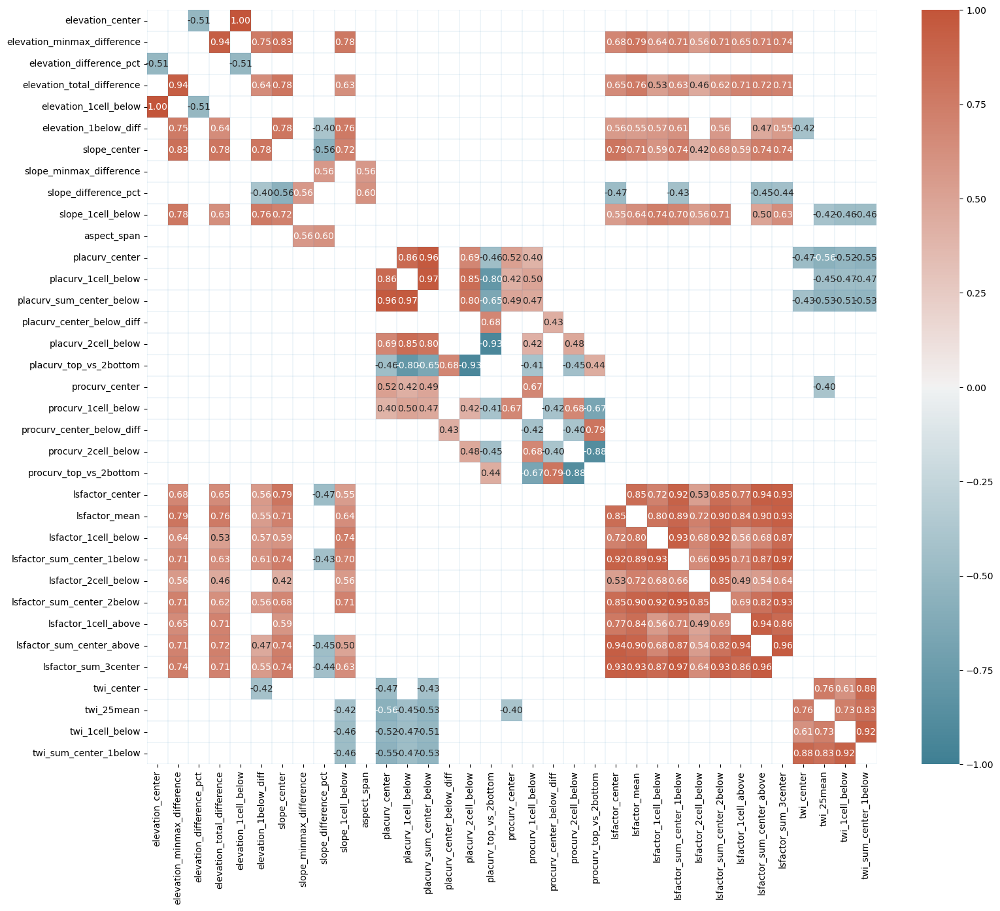

In [196]:
data = df.corr()

# replace the diag line with np.NaN
for i in range(0, len(data)):
    data.iloc[i,i]=np.NaN

# Get the variables that has high correlation coef. to other variables (>0.4 or <0.4)
heatmap_index = data.abs().max()[data.abs().max()>=0.4].index
data = data.loc[heatmap_index,heatmap_index.tolist()]

# replace all values that are <0.4 with np.NaN. We only care about correlation coef. >0.4
data = data.applymap(lambda x: np.NaN if abs(x) < 0.4 else x)

# plot
plt.figure(figsize=(18,15))
[plt.axhline(x, **{'lw': 0.1}) for x in range(0, len(data)+1)]
[plt.axvline(x, **{'lw': 0.1}) for x in range(0, len(data)+1)]
sns.heatmap(data, annot=True, fmt='.2f', cmap=sns.diverging_palette(220, 20, as_cmap=True), vmax=1, vmin=-1)

### Elevation -> Aspect

<AxesSubplot: >

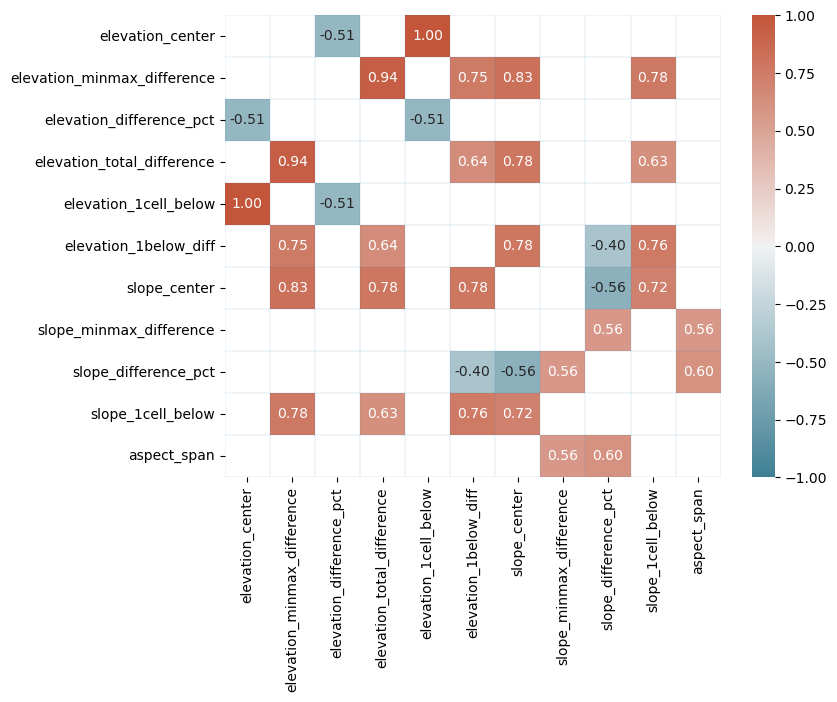

In [197]:
# from elevation -> aspect
data = df.loc[:, 'elevation_center': 'aspect_span'].corr()

# replace the diag line with np.NaN
for i in range(0, len(data)):
    data.iloc[i,i]=np.NaN

# Get the variables that has high correlation coef. to other variables (>0.4 or <0.4)
heatmap_index = data.abs().max()[data.abs().max()>=0.4].index
data = data.loc[heatmap_index,heatmap_index.tolist()]

# replace all values that are <0.4 with np.NaN. We only care about correlation coef. >0.4
data = data.applymap(lambda x: np.NaN if abs(x) < 0.4 else x)

# plot
plt.figure(figsize=(8,6))
[plt.axhline(x, **{'lw': 0.1}) for x in range(0, len(data)+1)]
[plt.axvline(x, **{'lw': 0.1}) for x in range(0, len(data)+1)]
sns.heatmap(data, annot=True, fmt='.2f', cmap=sns.diverging_palette(220, 20, as_cmap=True), vmax=1, vmin=-1)

In [198]:
for column in df.loc[:, 'elevation_center': 'aspect_span'].columns:
    space = ' '*(30 - len(column))
    print(column, end=space)
    convert_woe(column)

elevation_center              Information value: 0.28
elevation_minmax_difference   Information value: 0.92
elevation_difference_pct      Information value: 0.02
elevation_total_difference    Information value: 0.61
elevation_1cell_below         Information value: 0.27
elevation_1below_diff         Information value: 0.62
slope_center                  Information value: 1.06
slope_minmax_difference       Information value: 0.09
slope_difference_pct          Information value: 0.18
slope_1cell_below             Information value: 0.65
slope_1cell_below_diff        Information value: 0.07
aspect_span                   Information value: 0.09


<AxesSubplot: >

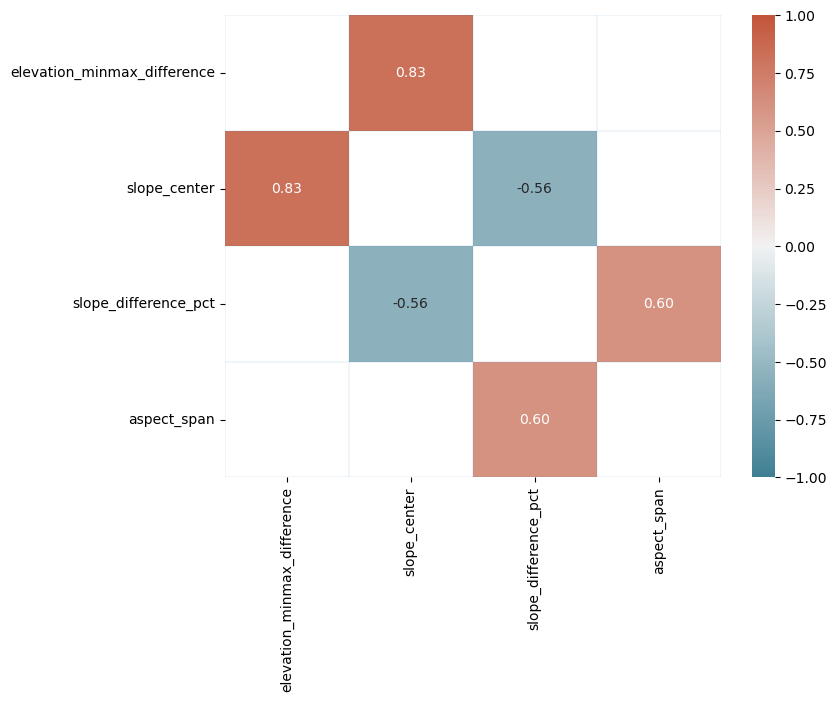

In [199]:
to_drop = ['elevation_1cell_below',
           'elevation_difference_pct',
           'elevation_total_difference',
           'slope_minmax_difference',
           'slope_1cell_below_diff',
           'elevation_1below_diff',
           'slope_1cell_below'
          ]

# from elevation -> aspect
data = df.loc[:, 'elevation_center': 'aspect_span'].drop(columns=to_drop).corr()

# replace the diag line with np.NaN
for i in range(0, len(data)):
    data.iloc[i,i]=np.NaN

# Get the variables that has high correlation coef. to other variables (>0.4 or <0.4)
heatmap_index = data.abs().max()[data.abs().max()>=0.4].index
data = data.loc[heatmap_index,heatmap_index.tolist()]

# replace all values that are <0.4 with np.NaN. We only care about correlation coef. >0.4
data = data.applymap(lambda x: np.NaN if abs(x) < 0.4 else x)

# plot
plt.figure(figsize=(8,6))
[plt.axhline(x, **{'lw': 0.1}) for x in range(0, len(data)+1)]
[plt.axvline(x, **{'lw': 0.1}) for x in range(0, len(data)+1)]
sns.heatmap(data, annot=True, fmt='.2f', cmap=sns.diverging_palette(220, 20, as_cmap=True), vmax=1, vmin=-1)


In [200]:
df.drop(columns = to_drop, inplace=True)

### placurv - procurv

C:\Users\nguye_5159g\AppData\Local\Temp\ipykernel_24292\1562819932.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  data = df.loc[:, 'placurv_center': 'procurv_top_vs_2bottom'].corr()


<AxesSubplot: >

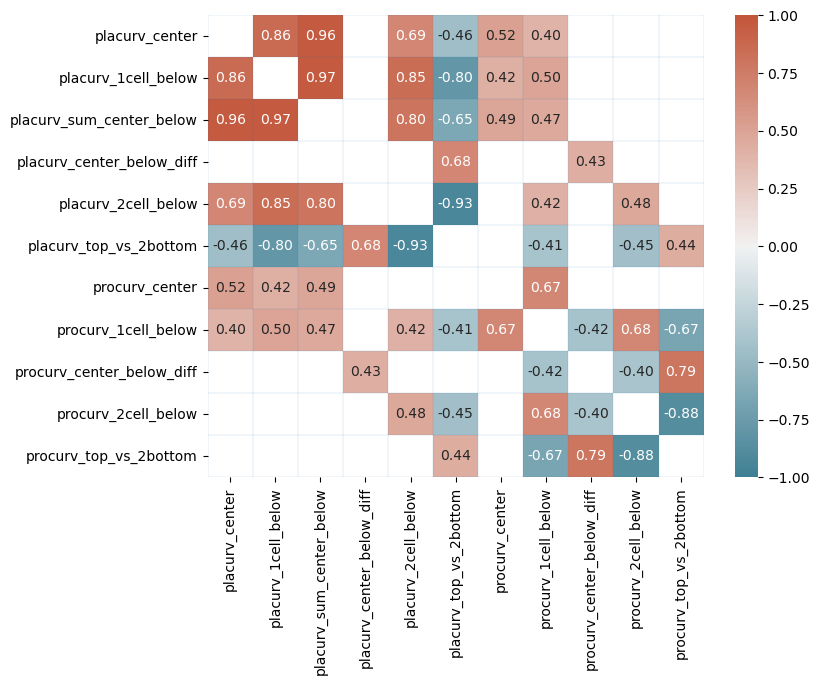

In [201]:
# from placurv-procurv
data = df.loc[:, 'placurv_center': 'procurv_top_vs_2bottom'].corr()

# replace the diag line with np.NaN
for i in range(0, len(data)):
    data.iloc[i,i]=np.NaN

# Get the variables that has high correlation coef. to other variables (>0.4 or <0.4)
heatmap_index = data.abs().max()[data.abs().max()>=0.4].index
data = data.loc[heatmap_index,heatmap_index.tolist()]

# replace all values that are <0.4 with np.NaN. We only care about correlation coef. >0.4
data = data.applymap(lambda x: np.NaN if abs(x) < 0.4 else x)

# plot
plt.figure(figsize=(8,6))
[plt.axhline(x, **{'lw': 0.1}) for x in range(0, len(data)+1)]
[plt.axvline(x, **{'lw': 0.1}) for x in range(0, len(data)+1)]
sns.heatmap(data, annot=True, fmt='.2f', cmap=sns.diverging_palette(220, 20, as_cmap=True), vmax=1, vmin=-1)

In [202]:
df['placurv_center'].dtype

dtype('float64')

In [203]:
for column in df.loc[:, 'placurv_center': 'procurv_top_vs_2bottom'].select_dtypes(np.number).columns:
    space = ' '*(30 - len(column))
    print(column, end=space)
    convert_woe(column)

placurv_center                Information value: 0.01
placurv_1cell_below           Information value: 0.07
placurv_sum_center_below      Information value: 0.04
placurv_center_below_diff     Information value: 0.06
placurv_2cell_below           Information value: 0.13
placurv_top_vs_2bottom        Information value: 0.16
procurv_center                Information value: 0.01
procurv_1cell_below           Information value: 0.04
procurv_center_below_diff     Information value: 0.05
procurv_2cell_below           Information value: 0.09
procurv_top_vs_2bottom        Information value: 0.11


C:\Users\nguye_5159g\AppData\Local\Temp\ipykernel_24292\2113982715.py:14: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  data = data.drop(columns=to_drop).corr()


<AxesSubplot: >

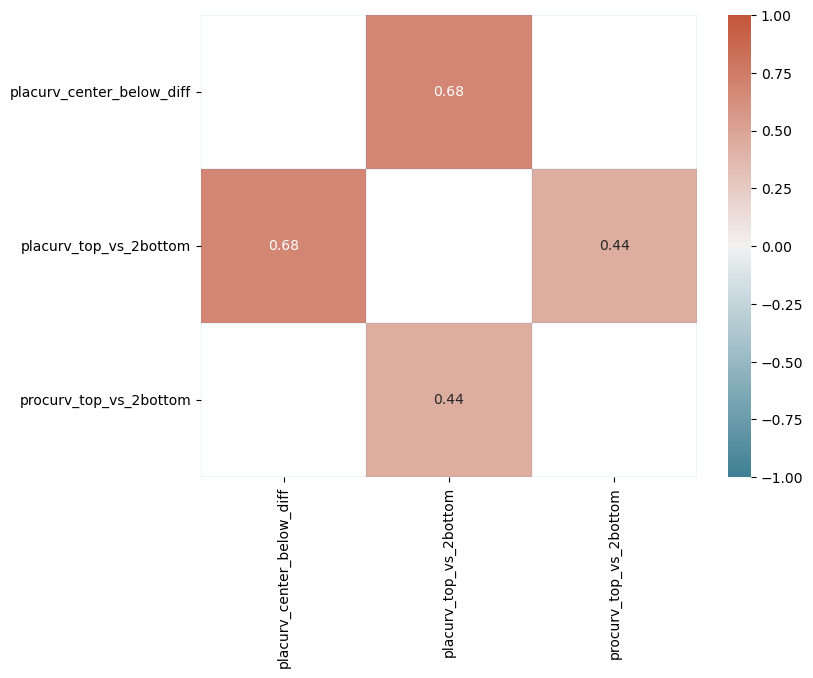

In [204]:
to_drop = [
    'placurv_center',
    'placurv_sum_center_below',
    'placurv_1cell_below',
    'placurv_2cell_below',
    'procurv_2cell_below',
    'procurv_center',
    'procurv_1cell_below',
    'procurv_center_below_diff'
          ]

# from elevation -> aspect
data = df.loc[:, 'placurv_center': 'procurv_top_vs_2bottom']
data = data.drop(columns=to_drop).corr()

# replace the diag line with np.NaN
for i in range(0, len(data)):
    data.iloc[i,i]=np.NaN

# Get the variables that has high correlation coef. to other variables (>0.4 or <0.4)
heatmap_index = data.abs().max()[data.abs().max()>=0.4].index
data = data.loc[heatmap_index,heatmap_index.tolist()]

# replace all values that are <0.4 with np.NaN. We only care about correlation coef. >0.4
data = data.applymap(lambda x: np.NaN if abs(x) < 0.4 else x)

# plot
plt.figure(figsize=(8,6))
[plt.axhline(x, **{'lw': 0.1}) for x in range(0, len(data)+1)]
[plt.axvline(x, **{'lw': 0.1}) for x in range(0, len(data)+1)]
sns.heatmap(data, annot=True, fmt='.2f', cmap=sns.diverging_palette(220, 20, as_cmap=True), vmax=1, vmin=-1)


In [205]:
df.drop(columns=to_drop, inplace=True)

### lsfactor center

<AxesSubplot: >

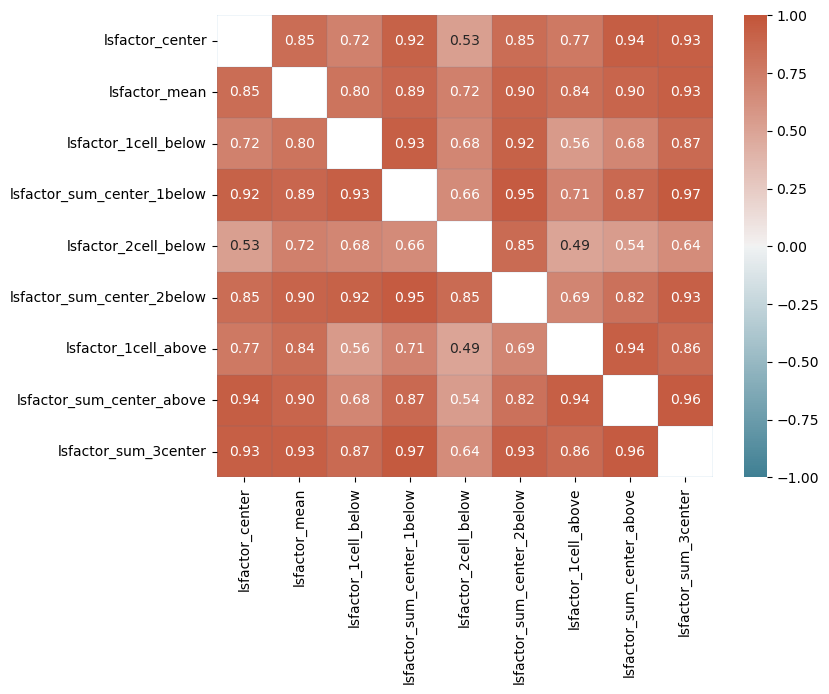

In [206]:
# from 
data = df.loc[:, 'lsfactor_center': 'lsfactor_sum_3center'].corr()

# replace the diag line with np.NaN
for i in range(0, len(data)):
    data.iloc[i,i]=np.NaN

# Get the variables that has high correlation coef. to other variables (>0.4 or <0.4)
heatmap_index = data.abs().max()[data.abs().max()>=0.4].index
data = data.loc[heatmap_index,heatmap_index.tolist()]

# replace all values that are <0.4 with np.NaN. We only care about correlation coef. >0.4
data = data.applymap(lambda x: np.NaN if abs(x) < 0.4 else x)

# plot
plt.figure(figsize=(8,6))
[plt.axhline(x, **{'lw': 0.1}) for x in range(0, len(data)+1)]
[plt.axvline(x, **{'lw': 0.1}) for x in range(0, len(data)+1)]
sns.heatmap(data, annot=True, fmt='.2f', cmap=sns.diverging_palette(220, 20, as_cmap=True), vmax=1, vmin=-1)

In [207]:
for column in df.loc[:, 'lsfactor_center': 'lsfactor_sum_3center'].select_dtypes(np.number).columns:
    space = ' '*(30 - len(column))
    print(column, end=space)
    convert_woe(column)

lsfactor_center               Information value: 0.54
lsfactor_mean                 Information value: 0.56
lsfactor_1cell_below          Information value: 0.48
lsfactor_sum_center_1below    Information value: 0.69
lsfactor_2cell_below          Information value: 0.20
lsfactor_sum_center_2below    Information value: 0.58
lsfactor_1cell_above          Information value: 0.28
lsfactor_sum_center_above     Information value: 0.52
lsfactor_sum_3center          Information value: 0.62


C:\Users\nguye_5159g\anaconda3\envs\newbase010323\lib\site-packages\seaborn\matrix.py:309: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set(xlim=(0, self.data.shape[1]), ylim=(0, self.data.shape[0]))
C:\Users\nguye_5159g\anaconda3\envs\newbase010323\lib\site-packages\seaborn\matrix.py:309: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set(xlim=(0, self.data.shape[1]), ylim=(0, self.data.shape[0]))


<AxesSubplot: >

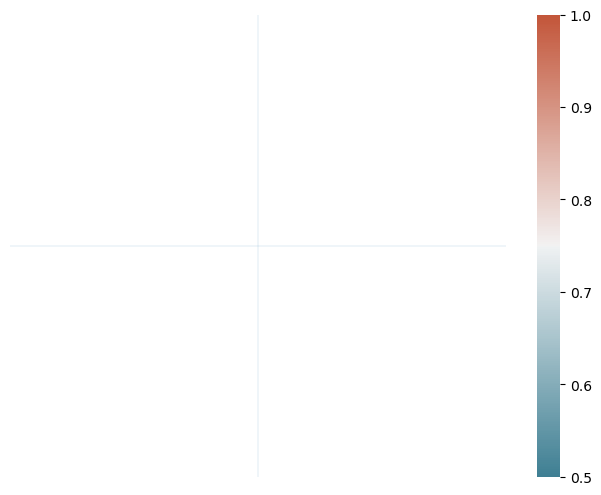

In [208]:
to_drop = [
    'lsfactor_1cell_below',
    'lsfactor_2cell_below',
    'lsfactor_1cell_above',
    'lsfactor_sum_center_2below',
    'lsfactor_sum_center_above',
    'lsfactor_center',
    'lsfactor_mean',
    'lsfactor_sum_3center'
    
          ]

# from elevation -> aspect
data = df.loc[:, 'lsfactor_center': 'lsfactor_sum_3center']
data = data.drop(columns=to_drop).corr()

# replace the diag line with np.NaN
for i in range(0, len(data)):
    data.iloc[i,i]=np.NaN

# Get the variables that has high correlation coef. to other variables (>0.4 or <0.4)
heatmap_index = data.abs().max()[data.abs().max()>=0.4].index
data = data.loc[heatmap_index,heatmap_index.tolist()]

# replace all values that are <0.4 with np.NaN. We only care about correlation coef. >0.4
data = data.applymap(lambda x: np.NaN if abs(x) < 0.4 else x)

# plot
plt.figure(figsize=(8,6))
[plt.axhline(x, **{'lw': 0.1}) for x in range(0, len(data)+1)]
[plt.axvline(x, **{'lw': 0.1}) for x in range(0, len(data)+1)]
sns.heatmap(data, annot=True, fmt='.2f', cmap=sns.diverging_palette(220, 20, as_cmap=True), vmax=1, vmin=0.5)


In [209]:
df.drop(columns=to_drop, inplace=True)

### twi

C:\Users\nguye_5159g\AppData\Local\Temp\ipykernel_24292\1941247888.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  data = df.loc[:, 'twi_center':].corr()


<AxesSubplot: >

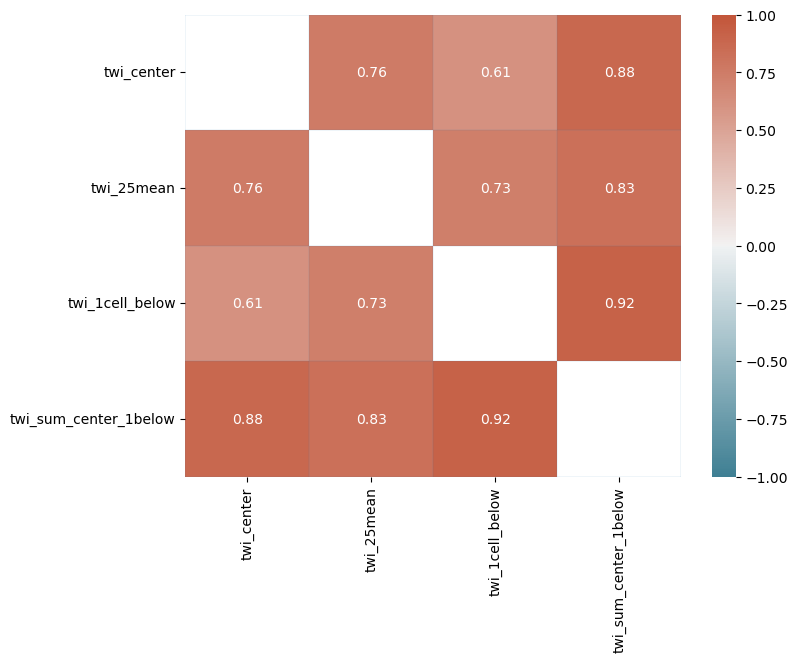

In [210]:
# from 
data = df.loc[:, 'twi_center':].corr()

# replace the diag line with np.NaN
for i in range(0, len(data)):
    data.iloc[i,i]=np.NaN

# Get the variables that has high correlation coef. to other variables (>0.4 or <0.4)
heatmap_index = data.abs().max()[data.abs().max()>=0.4].index
data = data.loc[heatmap_index,heatmap_index.tolist()]

# replace all values that are <0.4 with np.NaN. We only care about correlation coef. >0.4
data = data.applymap(lambda x: np.NaN if abs(x) < 0.4 else x)

# plot
plt.figure(figsize=(8,6))
[plt.axhline(x, **{'lw': 0.1}) for x in range(0, len(data)+1)]
[plt.axvline(x, **{'lw': 0.1}) for x in range(0, len(data)+1)]
sns.heatmap(data, annot=True, fmt='.2f', cmap=sns.diverging_palette(220, 20, as_cmap=True), vmax=1, vmin=-1)

In [211]:
for column in df.loc[:, 'twi_center':].select_dtypes(np.number).columns:
    space = ' '*(30 - len(column))
    print(column, end=space)
    convert_woe(column)

twi_center                    Information value: 0.24
twi_25mean                    Information value: 0.40
twi_1cell_below               Information value: 0.14
twi_sum_center_1below         Information value: 0.20
geology_center                Information value: 0.58
geology_counts                Information value: 0.01
sdoif_center                  Information value: 0.33


In [212]:
df.drop(columns=['twi_1cell_below', 'twi_sum_center_1below','geology_counts'], inplace=True)

### Check back

C:\Users\nguye_5159g\AppData\Local\Temp\ipykernel_24292\3316535741.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  data = df.corr()


<AxesSubplot: >

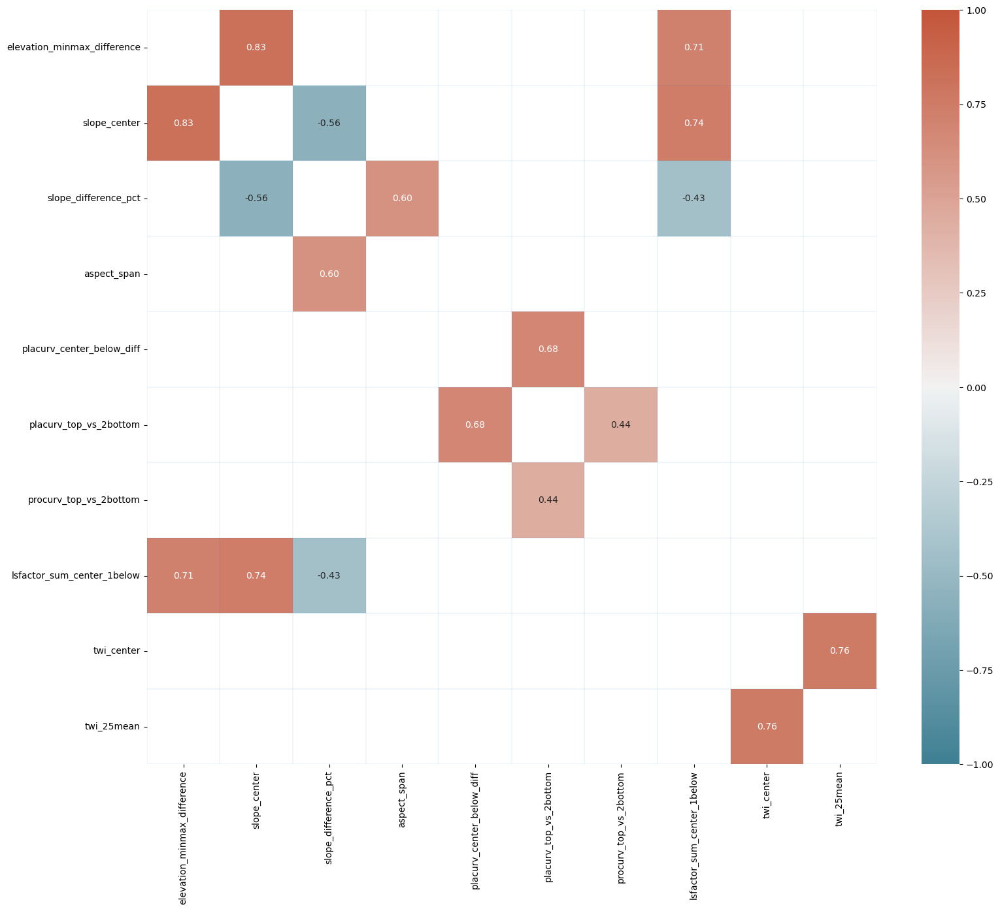

In [213]:
data = df.corr()

# replace the diag line with np.NaN
for i in range(0, len(data)):
    data.iloc[i,i]=np.NaN

# Get the variables that has high correlation coef. to other variables (>0.4 or <0.4)
heatmap_index = data.abs().max()[data.abs().max()>=0.4].index
data = data.loc[heatmap_index,heatmap_index.tolist()]

# replace all values that are <0.4 with np.NaN. We only care about correlation coef. >0.4
data = data.applymap(lambda x: np.NaN if abs(x) < 0.4 else x)

# plot
plt.figure(figsize=(18,15))
[plt.axhline(x, **{'lw': 0.1}) for x in range(0, len(data)+1)]
[plt.axvline(x, **{'lw': 0.1}) for x in range(0, len(data)+1)]
sns.heatmap(data, annot=True, fmt='.2f', cmap=sns.diverging_palette(220, 20, as_cmap=True), vmax=1, vmin=-1)

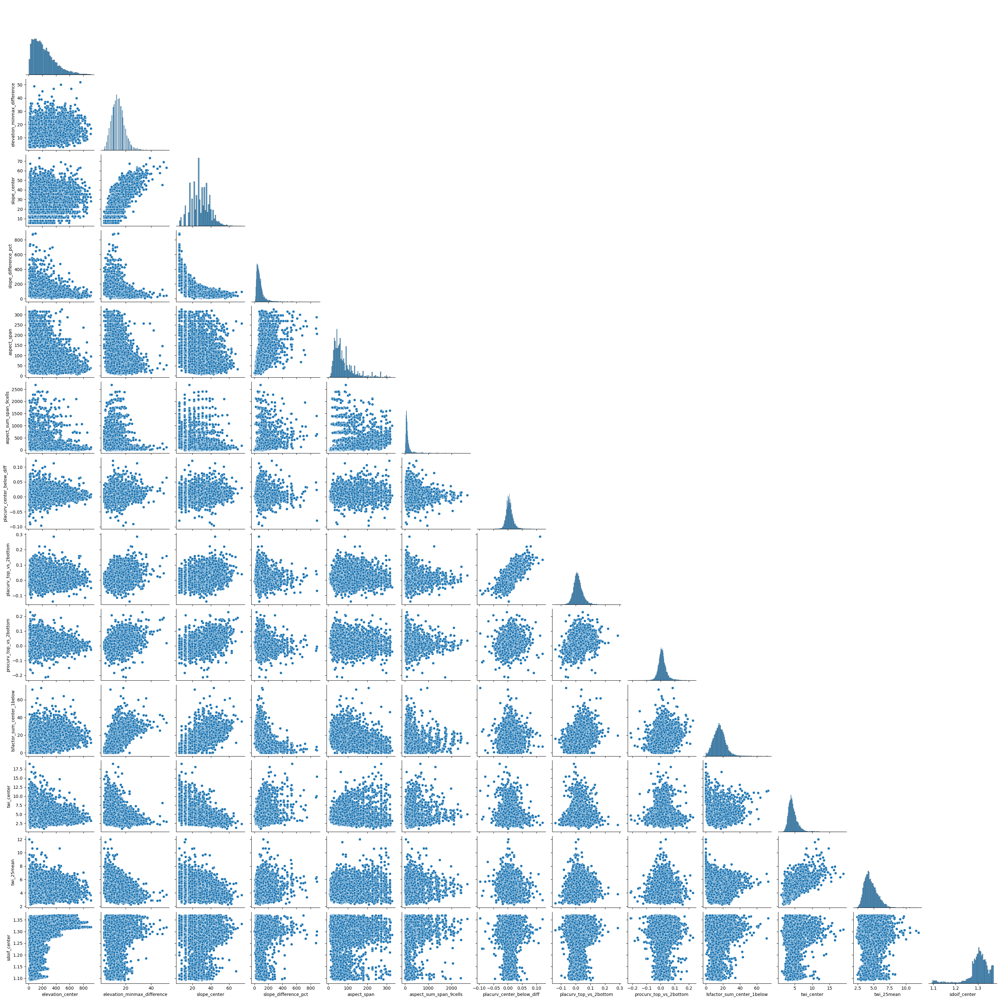

In [214]:
sns.pairplot(df.drop(columns=['Label', 'geology_center']), corner=True)

## 2.13. Export

In [215]:
df.to_csv('landslide_engineered_features.csv', index=False)